In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import scipy.stats as stats









pd.set_option('display.max_rows',None)
pd.set_option('display.max_colwidth',None)
# Instead of getting output as NumPy array, get it as a pandas DataFrame
from sklearn import set_config
set_config(transform_output="pandas")

# Reading data 

In [3]:
df = pd.read_csv(r'C:\Users\ABC\Desktop/bhushan/property_project/data/property_cleaned_data.csv')

In [4]:
df.head()

,id,builder,project_name,project_in_acres,location,city,lattitude,longitude,property_type,status,...,hospital_within_2km,tourist_mean_km,tourist_min_km,tourist_within_2km,overall_min_mean_km,overall_avg_mean_km,overall_min_min_km,overall_avg_min_km,total_within_2km,seller
0,cardid69429251,raymond realty,tenx habitat raymond realty,1.3006,pokhran road,thane,19.207777,72.967479,new property,under construction,...,0,NaN,NaN,0,1.833333,3.044444,1.2,2.100000,2,organization
1,cardid69427147,paradise group,paradise sai world empire,17.0000,kharghar,navi mumbai,19.080605,73.073939,new property,under construction,...,0,NaN,NaN,0,2.760000,3.980000,1.1,1.900000,2,realestateagent
2,cardid71764335,n rose developers pvt. ltd.,northern hills,1.0000,dahisar east,mumbai,19.248778,72.863793,new property,under construction,...,0,NaN,NaN,0,5.380000,10.417917,0.2,4.900000,8,organization
3,cardid71631505,avant group,avant heritage v,1.0000,jogeshwari east,mumbai,19.138704,72.859964,new property,under construction,...,0,NaN,NaN,0,NaN,NaN,NaN,NaN,0,organization
4,cardid72558997,mj shah,centrionx,2.0000,govandi,mumbai,19.055308,72.922850,new property,under construction,...,0,NaN,NaN,0,1.200000,2.370000,1.2,1.566667,4,organization


In [5]:
df.shape

(11859, 53)

# User-Defined Functions

make price_category in order while plotting in graph 

In [6]:
# Define the desired order
price_order = [
    "0.00 - 0.99",  
    "1.00 - 1.99",  
    "2.00 - 2.99",  
    "3.00 - 3.99",  
    "4.00 - 4.99",  
    "5.00 - 5.99",  
    "6.00 - 6.99",  
    "7.00 - 7.99",  
    "8.00 - 8.99",  
    "9.00 - 9.99",  
    "10.00 - 14.99",  
    "15.00 - 20.00",  
    "20.00 and above"
]

# Convert the column to a categorical type with the specified order.
df['price_category'] = pd.Categorical(df['price_category'], categories=price_order, ordered=True)

use to plot Boxen Plot, Box Plot, Bar Plot (Mean), Bar Plot (Median), Count Plot

In [7]:
def num_charts_plot(df, feature):
    """
    Alternative plots for a numerical feature with high cardinality:
      - Boxen Plot
      - Box Plot
      - Violin Plot
      - Line Plot of aggregated price by feature (assumed ordinal)
      - Heatmap of median price by feature
      - Jittered Strip Plot of Price by feature
      - Count Plot      
    """
    
    # Increase figure height to accommodate an additional plot (16 rows)
    fig = plt.figure(constrained_layout=True, figsize=(20, 35))
    grid = gridspec.GridSpec(ncols=2, nrows=16, figure=fig)
    
    # 1. Boxen Plot
    ax1 = fig.add_subplot(grid[0:2, :])
    ax1.set_title('Boxen Plot')
    sns.boxenplot(x=df[feature], y=df['price'], ax=ax1)
    ax1.tick_params(axis='x', rotation=90)
    
    # 2. Box Plot
    ax2 = fig.add_subplot(grid[2:4, :])
    ax2.set_title('Box Plot')
    sns.boxplot(x=df[feature], y=df['price'], ax=ax2)
    ax2.tick_params(axis='x', rotation=90)
    
    # 3. Violin Plot
    ax3 = fig.add_subplot(grid[4:6, :])
    ax3.set_title('Violin Plot')
    sns.violinplot(x=df[feature], y=df['price'], data=df, ax=ax3)
    ax3.tick_params(axis='x', rotation=90)
    
    # 4. Line Plot (Mean and Median)
    ax4 = fig.add_subplot(grid[6:8, :])
    ax4.set_title('Line Plot of Aggregated Price by ' + feature)
    
    # Compute aggregated values
    agg_data = df.groupby(feature)['price'].agg(['mean', 'median']).reset_index()
    agg_data = agg_data.sort_values(feature)
    
    # Plot mean and median
    ax4.plot(agg_data[feature], agg_data['mean'], marker='o', label='Mean Price', color='#1f77b4')
    ax4.plot(agg_data[feature], agg_data['median'], marker='o', label='Median Price', color='#ff7f0e')
    
    # Offsets for text placement
    y_offset_mean = 0.5
    y_offset_median = -0.5
    
    # Annotate mean (vertical text)
    for x_val, y_val in zip(agg_data[feature], agg_data['mean']):
        ax4.text(x_val, y_val + y_offset_mean, f"{y_val:.2f}",
                 ha='center', va='bottom', fontsize=10, color='#1f77b4', rotation=90)
    
    # Annotate median (vertical text)
    for x_val, y_val in zip(agg_data[feature], agg_data['median']):
        ax4.text(x_val, y_val + y_offset_median, f"{y_val:.2f}",
                 ha='center', va='top', fontsize=10, color='#ff7f0e', rotation=90)
    
    ax4.legend()
    ax4.tick_params(axis='x', rotation=90)
    ax4.set_xlabel(feature)
    ax4.set_ylabel('Mean and Median Price')
    
    # 5. Heatmap of Median Price by feature
    ax5 = fig.add_subplot(grid[8:10, :])
    ax5.set_title('Heatmap of Median Price by ' + feature)
    
    # Reuse the agg_data focusing on the median
    heat_data = agg_data.set_index(feature)[['median']].T
    
    sns.heatmap(
        heat_data,
        annot=True,           # show numeric values
        fmt=".2f",            # decimal format for numbers
        cmap="viridis", 
        ax=ax5,
        cbar=True,            # show colorbar
        linewidths=0.5,       # lines between cells
        linecolor='white',
        annot_kws={"size": 12, "rotation": 90}  # vertical annotation text
    )
    
    # Optionally rotate tick labels for x or y axes
    ax5.set_xticklabels(ax5.get_xticklabels(), rotation=45, ha='right')
    ax5.set_yticklabels(ax5.get_yticklabels(), rotation=0)
    
    # 6. Jittered Strip Plot
    ax6 = fig.add_subplot(grid[10:12, :])
    ax6.set_title('Jittered Strip Plot of Price by ' + feature)
    
    # Compute the median price by feature and sort it
    table = df.groupby(feature, as_index=False)['price'].median().sort_values(feature)
    
    # Create the strip plot with sorted order
    a1 = sns.stripplot(data=df, x=feature, y='price', order=table[feature].tolist(), 
                       jitter=True, alpha=0.6, size=5, ax=ax6)
    a1.set_xticklabels(a1.get_xticklabels(), rotation=90)
    
    # 7. Count Plot
    ax7 = fig.add_subplot(grid[12:14, :])
    ax7.set_title('Count Plot')
    sns.countplot(x=df[feature], ax=ax7)
    ax7.tick_params(axis='x', rotation=90)
    
    plt.show()


Confidence Interval comparison

In [8]:
def ci_mean(data, confidence=0.95):
    """Compute the confidence interval for the mean."""
    n = len(data)
    mean = np.mean(data)
    sem = st.sem(data)
    h = sem * st.t.ppf((1 + confidence) / 2., n-1)
    return mean, mean - h, mean + h

def ci_median(data, confidence=0.95, n_bootstrap=1000):
    """Compute the confidence interval for the median using bootstrapping."""
    boot_medians = [np.median(np.random.choice(data, size=len(data), replace=True)) 
                    for _ in range(n_bootstrap)]
    med = np.median(data)
    lower = np.percentile(boot_medians, (1-confidence)/2 * 100)
    upper = np.percentile(boot_medians, (1+confidence)/2 * 100)
    return med, lower, upper

def bar_plot_mean_median_ci(df, feature, price_col='price', confidence=0.95):
    """
    Create a bar plot with error bars to compare the mean and median price 
    (with their confidence intervals) for each level of the feature and annotate the CI.
    """
    # Group data by the feature
    groups = df.groupby(feature)[price_col]
    results = []
    
    for name, group in groups:
        m, m_low, m_high = ci_mean(group, confidence)
        med, med_low, med_high = ci_median(group, confidence)
        results.append((name, m, m_low, m_high, med, med_low, med_high))
        
    # Build DataFrame and sort if needed
    res_df = pd.DataFrame(results, columns=[feature, 'mean', 'mean_low', 'mean_high', 
                                              'median', 'median_low', 'median_high'])
    res_df.sort_values(feature, inplace=True)
    
    # Calculate error bars
    res_df['mean_err_low'] = res_df['mean'] - res_df['mean_low']
    res_df['mean_err_high'] = res_df['mean_high'] - res_df['mean']
    # For median, we compute asymmetric error bars
    res_df['median_err_low'] = res_df['median'] - res_df['median_low']
    res_df['median_err_high'] = res_df['median_high'] - res_df['median']
    
    # Plotting
    fig, ax = plt.subplots(figsize=(12, 6))
    width = 0.35  # width of the bars
    indices = np.arange(len(res_df))
    
    # Bar for mean
    bars_mean = ax.bar(indices - width/2, res_df['mean'], width, 
                       yerr=[res_df['mean_err_low'], res_df['mean_err_high']], 
                       capsize=5, label='Mean Price', color='#1f77b4')
    
    # Bar for median
    bars_median = ax.bar(indices + width/2, res_df['median'], width, 
                         yerr=[res_df['median_err_low'], res_df['median_err_high']], 
                         capsize=5, label='Median Price', color='#ff7f0e')
    
    # Annotate the CI on each bar
    for i, row in res_df.iterrows():
        # Mean annotation
        ax.text(i - width/2, row['mean_high'] + 0.5, 
                f"CI: [{row['mean_low']:.1f}, {row['mean_high']:.1f}]", 
                ha='center', va='bottom', fontsize=9, color='#1f77b4')
        # Median annotation
        ax.text(i + width/2, row['median_high'] + 0.5, 
                f"CI: [{row['median_low']:.1f}, {row['median_high']:.1f}]", 
                ha='center', va='bottom', fontsize=9, color='#ff7f0e')
    
    ax.set_xlabel(feature)
    ax.set_ylabel('Price')
    ax.set_title('Mean and Median Price with 95% Confidence Intervals by ' + feature)
    ax.set_xticks(indices)
    ax.set_xticklabels(res_df[feature], rotation=90)
    ax.legend()
    
    plt.show()

hypothesis testing between two numerical columns 

In [9]:
# hypothesis testing for association between 2 numeric variables
def num_num_hyp_testing(data, var1, var2, alpha=0.05):

  temp = (
      data
      .dropna(subset=[var1, var2], how="any")
      .copy()
  )

  # pearson test
  pearson = stats.pearsonr(temp[var1].values, temp[var2].values)
  pvalue = pearson.pvalue
  statistic = pearson.statistic
  print("Pearson Test")
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The samples are uncorrelated")
  print(f"- {'Alternate Hypothesis':21}: The samples are correlated")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {var1} and {var2} are correlated")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {var1} and {var2} are uncorrelated")

  # spearman test
  spearman = stats.spearmanr(temp[var1].values, temp[var2].values)
  pvalue = spearman.pvalue
  statistic = spearman.statistic
  print('-'*100)  
  print("Spearman Test")
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The samples are uncorrelated")
  print(f"- {'Alternate Hypothesis':21}: The samples are correlated")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {var1} and {var2} are correlated")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {var1} and {var2} are uncorrelated")


use for cat and num columns 

In [10]:
def bivariate_plot(df, feature):
    """
    Plots:
    - Distribution Plot
    - Scatter Plot (with trend line if numeric)
    - Hexbin Plot with Color Bar (only for numeric features)
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    import seaborn as sns

    is_numeric = pd.api.types.is_numeric_dtype(df[feature])

    fig, axes = plt.subplots(1, 3 if is_numeric else 2, figsize=(18, 6))

    # Distribution Plot
    sns.histplot(df[feature], kde=True, ax=axes[0])
    axes[0].set_title('Distribution Plot', fontsize=12)
    axes[0].set_xlabel(feature, fontsize=12)
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].tick_params(axis='x', rotation=90)

    # Scatter Plot
    if is_numeric:
        sns.regplot(x=df[feature], y=df['price'],
                    ax=axes[1],
                    scatter_kws={'s': 40},
                    line_kws={'color': 'red'})
        axes[1].set_title('Scatter Plot with Trend Line', fontsize=12)
    else:
        sns.stripplot(x=df[feature], y=df['price'],
                      ax=axes[1], jitter=True)
        axes[1].set_title('Scatter Plot (No Trend Line)', fontsize=12)

    axes[1].set_xlabel(feature, fontsize=12)
    axes[1].set_ylabel('Price', fontsize=12)
    axes[1].tick_params(axis='both', labelsize=10)
    axes[1].tick_params(axis='x', rotation=90)

    # Hexbin Plot (only if numeric)
    if is_numeric:
        hb = axes[2].hexbin(x=df[feature], y=df['price'],
                            gridsize=30, cmap='viridis', mincnt=1)
        axes[2].set_title('Hexbin Plot', fontsize=12)
        axes[2].set_xlabel(feature, fontsize=12)
        axes[2].set_ylabel('Price', fontsize=12)
        axes[2].tick_params(axis='both', labelsize=10)
        axes[2].tick_params(axis='x', rotation=90)

        cbar = fig.colorbar(hb, ax=axes[2])
        cbar.set_label('Counts', fontsize=10)

    plt.tight_layout()
    plt.show()


use to plot count plot, bar plot, KDE plot

In [11]:
def region_plots(df, feature):
    """
    Plots various relationships between the given feature and other attributes, ensuring consistent colors for 'city'.
    """

    # Define a fixed color palette for 'city'
    unique_regions = df['city'].dropna().unique()
    palette = sns.color_palette("tab10", len(unique_regions))  # Using 'tab10' for distinct colors
    region_palette = dict(zip(unique_regions, palette))  # Mapping colors to each region

    # Create a figure with a grid of 4 rows x 2 columns
    fig = plt.figure(constrained_layout=True, figsize=(30, 30))
    grid = gridspec.GridSpec(ncols=3, nrows=5, figure=fig)

    # 1. Count plot
    ax1 = fig.add_subplot(grid[2, 0])
    ax1.set_title(f"1.Count Plot of '{feature}' by 'city'")
    sns.countplot(x=feature, hue='city', data=df, ax=ax1, palette=region_palette)

    # 2. Bar plot: price_category vs feature
    ax2 = fig.add_subplot(grid[2, 1])
    ax2.set_title(f"2. Barplot of '{feature}' mean and price categories")
    sns.barplot(x='price_category', y=feature, data=df, ax=ax2, estimator=np.mean, errorbar=None)
    ax2.tick_params(axis='x', rotation=90)

    # 3. Bar plot: price vs feature by city
    ax3 = fig.add_subplot(grid[0, 0])
    ax3.set_title(f"3. Bar Plot of 'price' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='price', hue='city', data=df, ax=ax3, palette=region_palette)

    # 4. Bar plot: area vs feature by city
    ax4 = fig.add_subplot(grid[0, 1])
    ax4.set_title(f"4. Bar Plot of 'area' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='area', hue='city', data=df, ax=ax4, palette=region_palette)

    # 5. Bar plot: costpersqft vs feature by city
    ax5 = fig.add_subplot(grid[0, 2])
    ax5.set_title(f"5. Bar Plot of 'costpersqft' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='costpersqft', hue='city', data=df, ax=ax5, palette=region_palette)

    # 6. Bar plot: feature vs city
    ax6 = fig.add_subplot(grid[2, 2])
    ax6.set_title(f"6. Bar Plot of '{feature}' mean vs 'city'")
    sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)

    # 7. KDE plot: Price distribution by feature
    ax7 = fig.add_subplot(grid[3, 0])
    ax7.set_title(f"7. Price Distribution by '{feature}' (KDE Plot)")
    sns.kdeplot(data=df, x="price", hue=feature, fill=True, common_norm=False, palette="tab10", linewidth=1.5, ax=ax7, warn_singular=False)
    ax7.set_xlabel("Price")
    ax7.set_ylabel("Density")

    # 8. Price vs Bath (line plot)
    ax8 = fig.add_subplot(grid[1, 0])
    ax8.set_title(f"8. Price vs {feature}")
    sns.lineplot(data=df, x=feature, y="price", hue="city", ax=ax8, palette=region_palette)

    # 9. Area vs Bath (line plot)
    ax9 = fig.add_subplot(grid[1, 1])
    ax9.set_title(f"9. Area vs {feature}")
    sns.lineplot(data=df, x=feature, y="area", hue="city", ax=ax9, palette=region_palette)

    # 10. Cost per Sqft vs Bath (line plot)
    ax10 = fig.add_subplot(grid[1, 2])
    ax10.set_title(f"10. Cost per Sqft vs {feature}")
    sns.lineplot(data=df, x=feature, y="costpersqft", hue="city", ax=ax10, palette=region_palette)

    plt.show()


median plot

In [12]:
def median_plot(df, feature):
    # Drop rows with missing values for relevant columns
    df = df.dropna(subset=[feature, 'costpersqft', 'area', 'price'])
    
    # Compute median values for each category in the feature
    median_cost = df.groupby(feature)['costpersqft'].median()
    median_area = df.groupby(feature)['area'].median()
    median_price = df.groupby(feature)['price'].median()
    
    # Apply log transformation
    log_median_cost = np.log1p(median_cost)
    log_median_area = np.log1p(median_area)
    log_median_price = np.log1p(median_price)
    
    # Combine data for visualization
    median_df = (
        pd.DataFrame({
            feature: log_median_cost.index, 
            'Log Median Cost per Sqft': log_median_cost.values, 
            'Log Median Area': log_median_area.values, 
            'Log Median Price': log_median_price.values
        })
        .melt(id_vars=[feature], var_name='Metric', value_name='Log Value')
    )
    
    # Plot the graph
    plt.figure(figsize=(10, 6))
    ax = sns.lineplot(data=median_df, x=feature, y='Log Value', hue='Metric', marker='o')
    
    # Annotate each point
    for line in ax.lines:
        for x, y in zip(line.get_xdata(), line.get_ydata()):
            ax.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=9)
    
    # Set labels and title
    plt.xlabel(feature, fontsize=12)
    plt.ylabel("Log Median Values", fontsize=12)
    plt.title("Log Median Cost per Sqft, Area, and Price by " + feature + " (Line Plot)", fontsize=14)
    plt.xticks(rotation=45)
    
    # Move legend outside the plot
    plt.legend(title="Metric", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, frameon=True)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()
    
    # Create a sorted DataFrame (from expensive to cheapest)
    sorted_df = pd.DataFrame({
        feature: log_median_cost.index, 
        'log_median_costpersqft_values': log_median_cost.values  # Renamed column
    }).sort_values(by='log_median_costpersqft_values', ascending=False)
    
    # Print the sorted table
    print(sorted_df.to_string(index=False))

median plot for high cardinality 

In [13]:
def median_plot_high_card(df, feature):
    # Drop rows with missing values for the relevant columns to avoid issues during groupby or log transform
    df = df.dropna(subset=[feature, 'costpersqft', 'area', 'price'])
    
    # Compute median values for each category in the feature
    median_cost = df.groupby(feature)['costpersqft'].median()
    median_area = df.groupby(feature)['area'].median()
    median_price = df.groupby(feature)['price'].median()
    
    # Apply log transformation using np.log1p to handle zeros gracefully
    median_cost = np.log1p(median_cost)
    median_area = np.log1p(median_area)
    median_price = np.log1p(median_price)
    
    # Combine data into a single DataFrame suitable for Seaborn plotting
    median_df = (
        pd.DataFrame({
            feature: median_cost.index, 
            'Log Median Cost per Sqft': median_cost.values, 
            'Log Median Area': median_area.values, 
            'Log Median Price': median_price.values
        })
        .melt(id_vars=[feature], var_name='Metric', value_name='Log Value')
    )
    
    # Create the line plot
    plt.figure(figsize=(10, 6))
    ax = sns.lineplot(data=median_df, x=feature, y='Log Value', hue='Metric', marker='o')
    
    # Set labels and title
    plt.xlabel(feature, fontsize=12)
    plt.ylabel("Log Median Values", fontsize=12)
    plt.title("Log Median Cost per Sqft, Area, and Price by " + feature + " (Line Plot)", fontsize=14)
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
    
    # Move legend outside the plot area
    plt.legend(title="Metric", bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=12, frameon=True)
    
    # Adjust layout to accommodate the legend outside the plot
    plt.tight_layout()
    plt.show()

plot_log_median_subplots

In [14]:
def plot_log_median_subplots(df, feature):
    fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharex=True, sharey=True)
    
    regions = ['mumbai', 'navi mumbai', 'palghar', 'thane']
    labels = ['Log Median costpersqft', 'Log Median area', 'Log Median price']
    columns = ['costpersqft', 'area', 'price']
    
    for i, region in enumerate(regions):
        ax = axes[i]
        subset = df[df['city'] == region]
        
        median_values = subset.groupby(feature)[columns].median()
        log_median_values = np.log1p(median_values)
        
        for j, col in enumerate(columns):
            sns.lineplot(
                x=log_median_values.index,
                y=log_median_values[col],
                ax=ax,
                label=f"{labels[j]} for {region}",
                marker='o',
                linewidth=2
            )
            
            # Annotate each point
            for x_val, y_val in zip(log_median_values.index, log_median_values[col]):
                ax.text(x_val, y_val, f'{y_val:.2f}', ha='right', va='bottom', fontsize=12)
        
        ax.set_title(region.title(), fontsize=14, fontweight='bold')
        ax.set_xlabel(feature, fontsize=12)
        ax.set_ylabel("Log Median Values", fontsize=12)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=12, frameon=True)

        # Rotate x-axis labels properly
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()


log median subplots for high cardinality 

In [15]:
def plot_log_median_subplots_high_card(df, feature):
    fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharex=True, sharey=True)
    
    regions = ['mumbai', 'navi mumbai', 'palghar', 'thane']
    labels = ['Log Median costpersqft', 'Log Median area', 'Log Median price']
    columns = ['costpersqft', 'area', 'price']
    
    for i, region in enumerate(regions):
        ax = axes[i]
        subset = df[df['city'] == region]
        
        median_values = subset.groupby(feature)[columns].median()
        log_median_values = np.log1p(median_values)
        
        for j, col in enumerate(columns):
            sns.lineplot(
                x=log_median_values.index,
                y=log_median_values[col],
                ax=ax,
                label=f"{labels[j]} for {region}",
                marker='o',
                linewidth=2
            )
        
        ax.set_title(region.title(), fontsize=14, fontweight='bold')
        ax.set_xlabel(feature, fontsize=12)
        ax.set_ylabel("Log Median Values", fontsize=12)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=12, frameon=True)
    
    plt.tight_layout()
    plt.show()


region plot for high cardinality features

In [16]:
def region_plots_high_card(df, feature):
    """
    Plots:
      1. Bar plot: price_category vs feature
      2. Bar plot: feature vs city
      3. Line plot: Price vs feature (colored by city)
      4. Line plot: Area vs feature (colored by city)
      5. Line plot: Cost per Sqft vs feature (colored by city)
    """
    # Create a color palette based on the number of unique regions
    region_palette = sns.color_palette("husl", n_colors=df["city"].nunique())
    
    # Create a figure with a grid of 3 rows x 2 columns
    fig = plt.figure(constrained_layout=True, figsize=(20, 20))
    grid = gridspec.GridSpec(ncols=2, nrows=4, figure=fig)
    
    # 1. Bar plot: price_category vs feature at grid position (0, 0)
    ax1 = fig.add_subplot(grid[0, 0])
    ax1.set_title(f"1. Barplot of '{feature}' mean and price categories", fontsize=12)
    sns.barplot(
        x='price_category', y=feature, data=df, 
        estimator=np.mean, errorbar=None, ax=ax1
    )
    # Rotate tick labels for better readability
    ax1.tick_params(axis='x', rotation=45, labelsize=10)
    for label in ax1.get_xticklabels():
        label.set_ha('right')  
    ax1.tick_params(axis='y', labelsize=14)
    ax1.set_xlabel('price_category', fontsize=14)
    ax1.set_ylabel(feature, fontsize=14)
    
    # 2. Bar plot: feature vs city at grid position (0, 1)
    ax2 = fig.add_subplot(grid[0, 1])
    ax2.set_title(f"2. Bar Plot of '{feature}' mean vs 'city'", fontsize=12)
    sns.barplot(
        x='city', y=feature, data=df,
        estimator=np.mean, errorbar=None, ax=ax2
    )
    ax2.tick_params(axis='x', rotation=45, labelsize=10)
    ax2.tick_params(axis='y', labelsize=14)
    ax2.set_xlabel('city', fontsize=14)
    ax2.set_ylabel(feature, fontsize=14)
    
    # 3. Line plot: Price vs feature at grid position (1, 0)
    ax3 = fig.add_subplot(grid[1, :])
    ax3.set_title(f"3. Price vs  + '{feature}'", fontsize=12)
    sns.lineplot(data=df, x=feature, y="price", hue="city", ax=ax3, palette=region_palette)
    
    # 4. Line plot: Area vs feature at grid position (1, 1)
    ax4 = fig.add_subplot(grid[2, :])
    ax4.set_title(f"4. Area vs  + '{feature}'", fontsize=12)
    sns.lineplot(data=df, x=feature, y="area", hue="city", ax=ax4, palette=region_palette)
    
    # 5. Line plot: Cost per Sqft vs feature at grid position (2, 0)
    ax5 = fig.add_subplot(grid[3, :])
    ax5.set_title(f"5. Cost per Sqft vs  + '{feature}'", fontsize=12)
    sns.lineplot(data=df, x=feature, y="costpersqft", hue="city", ax=ax5, palette=region_palette)
    
    # If you want to hide the empty subplot at grid position (2, 1)
    ax6 = fig.add_subplot(grid[2, 1])
    ax6.axis('off')
    
    # Tight layout to ensure minimal overlapping
    plt.tight_layout()
    plt.show()

summary table

In [17]:
def summarize_properties(df, feature):
    """
    Returns a summary DataFrame containing overall metrics and region-specific counts 
    and median prices for properties, grouped by the specified feature.
    """
    # Define regions of interest.
    regions = ['mumbai', 'navi mumbai', 'thane', 'palghar']
    
    # Group by the feature column to compute overall metrics.
    overall = df.groupby(feature).agg(
        price_mean=('price', 'mean'),
        price_median=('price', 'median'),
        count=('price', 'count')
    ).reset_index().rename(columns={feature: 'feature_value'})
    
    # Prepare lists to collect region-specific metrics for each unique feature value.
    region_counts = {region: [] for region in regions}
    region_median_prices = {region: [] for region in regions}
    
    unique_values = overall['feature_value'].unique()
    for val in unique_values:
        df_val = df[df[feature] == val]
        for region in regions:
            # Use a case-insensitive match on 'city'
            region_df = df_val[df_val['city'].str.lower() == region]
            region_counts[region].append(len(region_df))
            median_price = region_df['price'].median() if len(region_df) > 0 else None
            region_median_prices[region].append(median_price)
    
    # Add region-specific columns to the overall DataFrame.
    for region in regions:
        overall[region] = region_counts[region]
        overall[f"{region}_median_price"] = region_median_prices[region]
    
    return overall

region plots for categorical features 

In [18]:
def region_plots_for_categorical_features(df, feature):
    """
    Plots various relationships between the given feature and other attributes, ensuring consistent colors for 'city' and feature.
    """

    # Define a fixed color palette for 'city'
    unique_regions = df['city'].dropna().unique()
    palette_regions = sns.color_palette("tab10", len(unique_regions))
    region_palette = dict(zip(unique_regions, palette_regions))

    # Define a separate palette for the 'feature'
    unique_feature_values = df[feature].dropna().unique()
    palette_feature = sns.color_palette("tab10", len(unique_feature_values))
    feature_palette = dict(zip(unique_feature_values, palette_feature))

    # Create a figure with a grid of 4 rows x 2 columns
    fig = plt.figure(constrained_layout=True, figsize=(30, 30))
    grid = gridspec.GridSpec(ncols=3, nrows=5, figure=fig)

    # 7. Count plot
    ax7 = fig.add_subplot(grid[2, 0])
    ax7.set_title(f"7. Count Plot of '{feature}' by 'city'")
    sns.countplot(x=feature, hue='city', data=df, ax=ax7, palette=region_palette)
    ax7.tick_params(axis='x', rotation=45)

    # 1. Bar plot: price vs feature by city
    ax1 = fig.add_subplot(grid[0, 0])
    ax1.set_title(f"1. Bar Plot of 'price' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='price', hue='city', data=df, ax=ax1, palette=region_palette)
    ax1.tick_params(axis='x', rotation=45)

    # 2. Bar plot: area vs feature by city
    ax2 = fig.add_subplot(grid[0, 1])
    ax2.set_title(f"2. Bar Plot of 'area' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='area', hue='city', data=df, ax=ax2, palette=region_palette)
    ax2.tick_params(axis='x', rotation=45)

    # 3. Bar plot: costpersqft vs feature by city
    ax3 = fig.add_subplot(grid[0, 2])
    ax3.set_title(f"3. Bar Plot of 'costpersqft' vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='costpersqft', hue='city', data=df, ax=ax3, palette=region_palette)
    ax3.tick_params(axis='x', rotation=45)

    # 10. KDE plot: Price distribution by feature
    ax10 = fig.add_subplot(grid[3, 0])
    ax10.set_title(f"10. Price Distribution by '{feature}' (KDE Plot)")
    sns.kdeplot(data=df, x="price", hue=feature, fill=True, common_norm=False, palette=feature_palette, linewidth=1.5, ax=ax10, warn_singular=False)
    ax10.set_xlabel("Price")
    ax10.set_ylabel("Density")

    # Skip plots 4, 5, and 6 if the feature is 'city'
    if feature != 'city':
        # 4. Price vs Feature (line plot)
        ax4 = fig.add_subplot(grid[1, 0])
        ax4.set_title(f"4. Price vs {feature}")
        sns.lineplot(data=df, x=feature, y="price", hue="city", ax=ax4, palette=region_palette)
        ax4.tick_params(axis='x', rotation=45)

        # 5. Area vs Feature (line plot)
        ax5 = fig.add_subplot(grid[1, 1])
        ax5.set_title(f"5. Area vs {feature}")
        sns.lineplot(data=df, x=feature, y="area", hue="city", ax=ax5, palette=region_palette)
        ax5.tick_params(axis='x', rotation=45)

        # 6. Cost per Sqft vs Feature (line plot)
        ax6 = fig.add_subplot(grid[1, 2])
        ax6.set_title(f"6. Cost per Sqft vs {feature}")
        sns.lineplot(data=df, x=feature, y="costpersqft", hue="city", ax=ax6, palette=region_palette)
        ax6.tick_params(axis='x', rotation=45)

    # 8. Count plot with corrected palette
    ax8 = fig.add_subplot(grid[2, 1])
    ax8.set_title(f"8. Count Plot of '{feature}' by 'price_category'")
    sns.countplot(x='price_category', hue=feature, data=df, ax=ax8, palette=feature_palette)
    ax8.tick_params(axis='x', rotation=90)

    # 9. Median price vs feature by price_category
    ax9 = fig.add_subplot(grid[2, 2])
    ax9.set_title(f"9. Median Price by '{feature}' and 'price_category'")
    sns.barplot(x='price_category', y='price', hue=feature, data=df, ax=ax9, estimator=np.median, errorbar=None, palette=feature_palette)
    ax9.tick_params(axis='x', rotation=90)

    plt.show()

plots for high cardinality categorical features 

In [19]:
def num_charts_plot_high_card_categorical(df, feature, top_n=10):
    """
    Plots various charts for a high-cardinality categorical feature,
    showing only the top N categories by frequency.
    """
    # Get top N categories
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()
    
    # Filter and copy to avoid SettingWithCopyWarning
    df_filtered = df[df[feature].isin(top_categories)].copy()
    
    # Sort categories by frequency
    df_filtered.loc[:, feature] = pd.Categorical(df_filtered[feature], categories=top_categories, ordered=True)
    df_filtered = df_filtered.sort_values(feature)
    
    # Setup figure and grid
    fig = plt.figure(constrained_layout=True, figsize=(25, 40))
    grid = gridspec.GridSpec(ncols=2, nrows=16, figure=fig)
    
    # 1. Boxen Plot
    ax1 = fig.add_subplot(grid[0:2, :])
    ax1.set_title('Boxen Plot')
    sns.boxenplot(x=feature, y='price', data=df_filtered, ax=ax1)
    ax1.tick_params(axis='x', rotation=90)
    
    # 2. Box Plot
    ax2 = fig.add_subplot(grid[2:4, :])
    ax2.set_title('Box Plot')
    sns.boxplot(x=feature, y='price', data=df_filtered, ax=ax2)
    ax2.tick_params(axis='x', rotation=90)
    
    # 3. Violin Plot
    ax3 = fig.add_subplot(grid[4:6, :])
    ax3.set_title('Violin Plot')
    sns.violinplot(x=feature, y='price', data=df_filtered, ax=ax3)
    ax3.tick_params(axis='x', rotation=90)
    
    # 4. Line Plot (Mean and Median)
    ax4 = fig.add_subplot(grid[6:8, :])
    ax4.set_title(f'Line Plot of Aggregated Price by {feature}')
    agg_data = df_filtered.groupby(feature, observed=False)['price'].agg(['mean', 'median']).reset_index()
    agg_data = agg_data.sort_values('median', ascending=False)  # Sort for line plot too!
    ax4.plot(agg_data[feature], agg_data['mean'], marker='o', label='Mean Price', color='#1f77b4')
    ax4.plot(agg_data[feature], agg_data['median'], marker='o', label='Median Price', color='#ff7f0e')
    ax4.legend()
    ax4.tick_params(axis='x', rotation=45)
    ax4.set_xlabel(feature)
    ax4.set_ylabel('Mean and Median Price')
    
    # 5. Heatmap of Median Price
    ax5 = fig.add_subplot(grid[8:10, :])
    ax5.set_title(f'Heatmap of Median Price by {feature}')
    heat_data = agg_data.set_index(feature)[['median']].T
    sns.heatmap(
        heat_data,
        annot=True,
        fmt=".2f",
        cmap="viridis",
        ax=ax5,
        cbar=True,
        cbar_kws={'label': 'Median Price'},
        linewidths=0.5,
        linecolor='white'
    )
    ax5.tick_params(axis='x', rotation=45)
    # Align them to the right
    for label in ax5.get_xticklabels():
        label.set_horizontalalignment('right')
    ax5.set_xlabel(feature)
    
    # 6. Jittered Strip Plot
    ax6 = fig.add_subplot(grid[10:12, :])
    ax6.set_title(f'Jittered Strip Plot of Price by {feature}')
    sns.stripplot(x=feature, y='price', data=df_filtered, jitter=True, alpha=0.6, size=5, ax=ax6)
    ax6.tick_params(axis='x', rotation=90)
    
    # 7. Count Plot
    ax7 = fig.add_subplot(grid[12:14, :])
    ax7.set_title('Count Plot')
    sns.countplot(x=feature, data=df_filtered, order=top_categories, ax=ax7)
    ax7.tick_params(axis='x', rotation=90)
    
    plt.show()


In [20]:
def region_plots_high_card_categorical(df, feature, top_n=10):
    """
    Plots various relationships between the given feature and other attributes,
    ensuring consistent colors for 'city'. Handles SettingWithCopyWarning and tick label rotation.
    """

    # Get the top N categories based on count
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()
    df_filtered = df[df[feature].isin(top_categories) & df['city'].notna()].copy()

    # Sort categories based on count using .loc to avoid SettingWithCopyWarning
    df_filtered.loc[:, feature] = pd.Categorical(
        df_filtered[feature],
        categories=top_categories,
        ordered=True
    )
    df_filtered = df_filtered.sort_values(feature)

    # Define a fixed color palette for 'city'
    unique_regions = df_filtered['city'].unique()
    palette = sns.color_palette("tab10", len(unique_regions))  
    region_palette = dict(zip(unique_regions, palette)) 

    # Create a figure with a grid
    fig = plt.figure(constrained_layout=True, figsize=(30, 30))
    grid = gridspec.GridSpec(ncols=3, nrows=5, figure=fig)

    # 1. Price vs feature
    ax1 = fig.add_subplot(grid[0, 0])
    ax1.set_title(f"1. Price vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='price', hue='city', data=df_filtered, ax=ax1, palette=region_palette)

    # 2. Area vs feature
    ax2 = fig.add_subplot(grid[0, 1])
    ax2.set_title(f"2. Area vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='area', hue='city', data=df_filtered, ax=ax2, palette=region_palette)

    # 3. Cost per Sqft vs feature
    ax3 = fig.add_subplot(grid[0, 2])
    ax3.set_title(f"3. Cost per Sqft vs '{feature}' by 'city'")
    sns.barplot(x=feature, y='costpersqft', hue='city', data=df_filtered, ax=ax3, palette=region_palette)

    # 4. Line plot: Price vs feature
    ax4 = fig.add_subplot(grid[1, 0])
    ax4.set_title(f"4. Price vs {feature}")
    sns.lineplot(data=df_filtered, x=feature, y="price", hue="city", ax=ax4, palette=region_palette)

    # 5. Line plot: Area vs feature
    ax5 = fig.add_subplot(grid[1, 1])
    ax5.set_title(f"5. Area vs {feature}")
    sns.lineplot(data=df_filtered, x=feature, y="area", hue="city", ax=ax5, palette=region_palette)

    # 6. Line plot: Cost per Sqft vs feature
    ax6 = fig.add_subplot(grid[1, 2])
    ax6.set_title(f"6. Cost per Sqft vs {feature}")
    sns.lineplot(data=df_filtered, x=feature, y="costpersqft", hue="city", ax=ax6, palette=region_palette)

    # 7. Count plot
    ax7 = fig.add_subplot(grid[2, 0])
    ax7.set_title(f"7. Count Plot of '{feature}' by 'city'")
    sns.countplot(x=feature, hue='city', data=df_filtered, ax=ax7, palette=region_palette)

    # 8. KDE plot
    ax8 = fig.add_subplot(grid[2, 1])
    ax8.set_title(f"8. Price Distribution by '{feature}' (KDE Plot)")
    sns.kdeplot(
        data=df_filtered,
        x="price",
        hue=feature,
        fill=True,
        common_norm=False,
        palette="tab10",
        linewidth=1.5,
        ax=ax8,
        warn_singular=False
    )

    # Rotate, align right, and set xlabel for each subplot
    for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]:
        ax.tick_params(axis='x', rotation=45)
        for label in ax.get_xticklabels():
            label.set_horizontalalignment('right')
        ax.set_xlabel(feature)

# Example usage:
# region_plots_high_card_categorical(df, 'builder', top_n=15)


In [21]:
def num_two_chart_plot_high_card_categorical(df, feature, top_n=10):
    """
    The plots include:
    - Distribution Plot
    - Scatter Plot
    """
    # Get the top N categories based on count
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()

    # Use .copy() to avoid SettingWithCopyWarning
    df_filtered = df[df[feature].isin(top_categories) & df['city'].notna()].copy()

    # Use .loc for safe assignment
    df_filtered.loc[:, feature] = pd.Categorical(
        df_filtered[feature],
        categories=top_categories,
        ordered=True
    )
    df_filtered = df_filtered.sort_values(feature)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Distribution Plot
    sns.histplot(df_filtered[feature], kde=True, ax=axes[0])
    axes[0].set_title('Distribution Plot', fontsize=12)
    axes[0].set_xlabel(feature, fontsize=12)
    axes[0].set_ylabel('Count', fontsize=12)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].tick_params(axis='x', rotation=90)

    # Scatter Plot
    sns.scatterplot(x=df_filtered[feature], y=df_filtered['price'], ax=axes[1])
    axes[1].set_title('Scatter Plot', fontsize=12)
    axes[1].set_xlabel(feature, fontsize=12)
    axes[1].set_ylabel('Price', fontsize=12)
    axes[1].tick_params(axis='both', labelsize=10)
    axes[1].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()

# Example usage:
# num_two_chart_plot_high_card_categorical(df, 'builder', top_n=25)


In [22]:
def summarize_properties_high_card_categorical(df, feature, top_n=10):
    """
    Returns a summary DataFrame containing overall metrics and region-specific counts 
    and median prices for properties, grouped by the specified feature.
    """

    # Get the top N categories based on count
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()
    
    # Use .copy() to avoid SettingWithCopyWarning
    df_filtered = df[df[feature].isin(top_categories) & df['city'].notna()].copy()

    # Use .loc for safe assignment
    df_filtered.loc[:, feature] = pd.Categorical(
        df_filtered[feature],
        categories=top_categories,
        ordered=True
    )
    df_filtered = df_filtered.sort_values(feature)
    
    # Define regions of interest.
    regions = ['mumbai', 'navi mumbai', 'thane', 'palghar']
    
    # Group by the feature column to compute overall metrics with observed=True
    overall = (
        df_filtered.groupby(feature, observed=True)
        .agg(
            price_mean=('price', 'mean'),
            price_median=('price', 'median'),
            count=('price', 'count')
        )
        .reset_index()
        .rename(columns={feature: 'feature_value'})
    )
    
    # Prepare lists to collect region-specific metrics for each unique feature value.
    region_counts = {region: [] for region in regions}
    region_median_prices = {region: [] for region in regions}
    
    unique_values = overall['feature_value'].unique()
    for val in unique_values:
        df_val = df_filtered[df_filtered[feature] == val]
        for region in regions:
            # Use a case-insensitive match on 'city'
            region_df = df_val[df_val['city'].str.lower() == region]
            region_counts[region].append(len(region_df))
            median_price = region_df['price'].median() if len(region_df) > 0 else None
            region_median_prices[region].append(median_price)
    
    # Add region-specific columns to the overall DataFrame.
    for region in regions:
        overall[region] = region_counts[region]
        overall[f"{region}_median_price"] = region_median_prices[region]
    
    return overall

# Example usage
# summarize_properties_high_card_categorical(df, 'builder', top_n=15)


In [23]:
def plot_log_median_subplots_high_card_categorical(df, feature, top_n=10):
    # Get the top N categories based on count
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()
    
    # Copy to avoid SettingWithCopyWarning
    df_filtered = df[df[feature].isin(top_categories) & df['city'].notna()].copy()

    # Use .loc for safe assignment
    df_filtered.loc[:, feature] = pd.Categorical(
        df_filtered[feature],
        categories=top_categories,
        ordered=True
    )
    df_filtered = df_filtered.sort_values(feature)
    
    fig, axes = plt.subplots(1, 4, figsize=(24, 6), sharex=True, sharey=True)
    
    regions = ['mumbai', 'navi mumbai', 'palghar', 'thane']
    labels = ['Log Median costpersqft', 'Log Median area', 'Log Median price']
    columns = ['costpersqft', 'area', 'price']
    
    for i, region in enumerate(regions):
        ax = axes[i]
        subset = df_filtered[df_filtered['city'] == region]
        
        # Use observed=True to silence FutureWarning
        median_values = subset.groupby(feature, observed=True)[columns].median()
        
        # Ensure positive values before log transform
        median_values = median_values.replace(0, np.nan).dropna()
        log_median_values = np.log1p(median_values.dropna())

        for j, col in enumerate(columns):
            if log_median_values[col].isna().all():
                continue
            
            sns.lineplot(
                x=log_median_values.index,
                y=log_median_values[col],
                ax=ax,
                label=f"{labels[j]} for {region}",
                marker='o',
                linewidth=2
            )
            
            # Annotate each point
            for x_val, y_val in zip(log_median_values.index, log_median_values[col]):
                if np.isfinite(y_val):
                    ax.text(x_val, y_val, f'{y_val:.2f}', ha='right', va='bottom', fontsize=12)
        
        ax.set_title(region.title(), fontsize=14, fontweight='bold')
        ax.set_xlabel(feature, fontsize=12)
        ax.set_ylabel("Log Median Values", fontsize=12)
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=12, frameon=True)

        # Rotate x-axis labels safely
        ax.tick_params(axis='x', rotation=45)
        for label in ax.get_xticklabels():
            label.set_horizontalalignment('right')

    plt.tight_layout()
    plt.show()

# Example usage
# plot_log_median_subplots_high_card_categorical(df, 'builder', top_n=10)


In [24]:
def median_plot_high_card_categorical(df, feature, top_n=10):
    # Get the top N categories based on count
    top_categories = df[feature].value_counts().nlargest(top_n).index.tolist()
    
    # Use .copy() to avoid SettingWithCopyWarning
    df_filtered = df[df[feature].isin(top_categories) & df['city'].notna()].copy()

    # Use .loc for safe assignment
    df_filtered.loc[:, feature] = pd.Categorical(
        df_filtered[feature],
        categories=top_categories,
        ordered=True
    )
    df_filtered = df_filtered.sort_values(feature)
    
    # Drop rows with missing values for relevant columns
    df_filtered = df_filtered.dropna(subset=[feature, 'costpersqft', 'area', 'price'])
    
    # Compute median values with observed=True
    median_cost = df_filtered.groupby(feature, observed=True)['costpersqft'].median()
    median_area = df_filtered.groupby(feature, observed=True)['area'].median()
    median_price = df_filtered.groupby(feature, observed=True)['price'].median()
    
    # Apply log transformation
    log_median_cost = np.log1p(median_cost)
    log_median_area = np.log1p(median_area)
    log_median_price = np.log1p(median_price)
    
    # Combine data for visualization
    median_df = (
        pd.DataFrame({
            feature: log_median_cost.index, 
            'Log Median Cost per Sqft': log_median_cost.values, 
            'Log Median Area': log_median_area.values, 
            'Log Median Price': log_median_price.values
        })
        .melt(id_vars=[feature], var_name='Metric', value_name='Log Value')
    )
    
    # Plot the graph
    plt.figure(figsize=(10, 6))
    ax = sns.lineplot(data=median_df, x=feature, y='Log Value', hue='Metric', marker='o')
    
    # Annotate each point
    for line in ax.lines:
        for x, y in zip(line.get_xdata(), line.get_ydata()):
            ax.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=9)
    
    # Set labels and title
    plt.xlabel(feature, fontsize=12)
    plt.ylabel("Log Median Values", fontsize=12)
    plt.title("Log Median Cost per Sqft, Area, and Price by " + feature + " (Line Plot)", fontsize=14)
    plt.xticks(rotation=45)
    
    # Move legend outside the plot
    plt.legend(title="Metric", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, frameon=True)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()
    
    # Create a sorted DataFrame (from expensive to cheapest)
    sorted_df = pd.DataFrame({
        feature: log_median_cost.index, 
        'log_median_costpersqft_values': log_median_cost.values
    }).sort_values(by='log_median_costpersqft_values', ascending=False)
    
    # Print the sorted table
    print(sorted_df.to_string(index=False))

# Example usage:
# median_plot_high_card_categorical(df, 'builder', top_n=10)


pair plot function 

In [25]:
def pair_plots(data,
               height=3,
               aspect=1.5,
               hue=None,
               legend=False):
    print("\n--- Pair Plots ---\n")  # Optional header

    pair_grid = sns.PairGrid(
        data=data,
        aspect=aspect,
        height=height,
        hue=hue,
        corner=True
    )
    pair_grid.map_lower(sns.scatterplot)

    if legend:
        pair_grid.add_legend()

    plt.show()


correlation analysis for numerical columns 

In [26]:
def correlation_heatmap(data,
                        figsize=(20, 12),
                        method="spearman",
                        cmap="RdBu"):

    # Compute correlation matrix
    cm = data.corr(method=method, numeric_only=True)

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(cm, dtype=bool))

    # Set up the matplotlib figure
    plt.figure(figsize=figsize)

    # Draw the heatmap
    sns.heatmap(
        cm,
        mask=mask,
        cmap=cmap,
        vmin=-1,
        vmax=1,
        center=0,
        annot=True,
        fmt=".2f",
        linewidths=0.5,
        square=True,
        cbar_kws={"shrink": 0.75}
    )

    plt.title(f"{method.title()} Correlation Matrix Heatmap", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


correlation analysis using cramers'V for categorical columns 

In [27]:
# cramers-v corrrelation heatmap
def cramers_v(data, var1, var2):
  ct = pd.crosstab(
      data.loc[:, var1],
      data.loc[:, var2]
  )
  r, c = ct.shape
  n = ct.sum().sum()
  chi2 = stats.chi2_contingency(ct).statistic
  phi2 = chi2 / n

  # bias correction
  phi2_ = max(0, phi2 - ((r - 1) * (c - 1) / (n - 1)))
  r_ = r - (((r - 1) ** 2) / (n - 1))
  c_ = c - (((c - 1) ** 2) / (n - 1))

  return np.sqrt(phi2_ / min(r_ - 1, c_ - 1))

In [28]:
# def rotate_xlabels(ax, angle=45):
#     for label in ax.get_xticklabels():
#         label.set_rotation(angle)
#         label.set_horizontalalignment('right')

# def rotate_ylabels(ax, angle=0):
#     for label in ax.get_yticklabels():
#         label.set_rotation(angle)

# def cramersV_heatmap(data, figsize=(20, 12), cmap="Blues"):
#   cols = data.select_dtypes(include="O").columns.to_list()

#   matrix = (
#       pd
#       .DataFrame(data=np.ones((len(cols), len(cols))))
#       .set_axis(cols, axis=0)
#       .set_axis(cols, axis=1)
#   )

#   for col1 in cols:
#     for col2 in cols:
#       if col1 != col2:
#         matrix.loc[col1, col2] = cramers_v(data, col1, col2)

#   mask = np.zeros_like(matrix, dtype=bool)
#   mask[np.triu_indices_from(mask)] = True
  
#   fig, ax = plt.subplots(figsize=figsize)
#   hm = sns.heatmap(
#       matrix,
#       vmin=0,
#       vmax=1,
#       cmap=cmap,
#       annot=True,
#       fmt=".2f",
#       square=True,
#       linewidths=1.5,
#       mask=mask,
#       ax=ax
#   )
#   ax.set(title="Cramer's V Correlation Matrix Heatmap")
#   rotate_xlabels(ax)
#   rotate_ylabels(ax)

hypothesis testing for association between numeric and categorical variable 

In [29]:
# hypothesis testing for association between numeric and categorical variable 
    
def num_cat_hyp_testing(data, num_var, cat_var, alpha=0.05):
  print(f"Hypothesis Test for Association between {num_var} and {cat_var}")

  groups_df = (
      data
      .dropna(subset=[num_var])
      .groupby(cat_var)
  )
  groups = [group[num_var].values for _, group in groups_df]

  # anova test
  anova = stats.f_oneway(*groups)
  statistic = anova[0]
  pvalue = anova[1]
  print('-'*50)
  print('ANOVA Test')
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The groups have similar population mean")
  print(f"- {'Alternate Hypothesis':21}: The groups don't have similar population mean")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are associated to each other")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are not associated to each other")

  # kruskal-wallis test
  kruskal = stats.kruskal(*groups)
  statistic = kruskal[0]
  pvalue = kruskal[1]
  print('-'*50)
  print('Kruskal-Wallis Test')
  print(f"- {'Significance Level':21}: {alpha * 100}%")
  print(f"- {'Null Hypothesis':21}: The groups have similar population median")
  print(f"- {'Alternate Hypothesis':21}: The groups don't have similar population median")
  print(f"- {'Test Statistic':21}: {statistic}")
  print(f"- {'p-value':21}: {pvalue}")
  if pvalue < alpha:
    print(f"- Since p-value is less than {alpha}, we Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are associated to each other")
  else:
    print(f"- Since p-value is greater than {alpha}, we Fail to Reject the Null Hypothesis at {alpha * 100}% significance level")
    print(f"- CONCLUSION: The variables {num_var} and {cat_var} are not associated to each other")


* **ANOVA Test**  
* The ANOVA test compares the means of a numerical variable across different groups of a categorical variable.  
* It calculates the mean of the numerical column for each group.  
* If the difference in means between groups is large, it suggests a strong association between the variables.  
* **Observation:**
  * If the null hypothesis is rejected, it means the groups do not have the same population means — indicating a good association.
* **Kruskal-Wallis Test**
* The Kruskal-Wallis test is a non-parametric test that compares the medians of a numerical variable across different groups of a categorical variable.
* It calculates the median of the numerical column for each group.
* If the difference in medians between groups is large, it suggests a strong association between the variables.
* **Observation:**
  * If the null hypothesis is rejected, it means the groups do not have the same population medians — indicating a good association.

`observation`  
will do analysis of each column with price and address column also 
- Multivariate analysis on Numerical columns
- Multivariate analysis on Categorical columns

# Multivariate analysis on Numerical columns

In [30]:
#find the numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns
print(numerical_columns)
print("-"*100)
print(f'total numerical columns : {len(numerical_columns)}')

Index(['project_in_acres', 'lattitude', 'longitude', 'flat_on_floor',
       'total_floor', 'area', 'bed', 'bath', 'balcony', 'lift', 'parking',
       'costpersqft', 'emi', 'price', 'education_mean_km', 'education_min_km',
       'education_within_2km', 'transport_mean_km', 'transport_min_km',
       'transport_within_2km', 'shopping_centre_mean_km',
       'shopping_centre_min_km', 'shopping_centre_within_2km',
       'commercial_hub_mean_km', 'commercial_hub_min_km',
       'commercial_hub_within_2km', 'hospital_mean_km', 'hospital_min_km',
       'hospital_within_2km', 'tourist_mean_km', 'tourist_min_km',
       'tourist_within_2km', 'overall_min_mean_km', 'overall_avg_mean_km',
       'overall_min_min_km', 'overall_avg_min_km', 'total_within_2km'],
      dtype='object')
----------------------------------------------------------------------------------------------------
total numerical columns : 37


In [31]:
# Find numerical columns with fewer than 15 unique values
low_cardinality_columns = [col for col in numerical_columns if df[col].nunique() < 15]

print("Numerical columns with less than 15 unique categories:")
print(low_cardinality_columns)
print("-"*100)
print(f"Total: {len(low_cardinality_columns)}")


Numerical columns with less than 15 unique categories:
['bed', 'bath', 'balcony', 'lift', 'parking', 'education_within_2km', 'transport_within_2km', 'shopping_centre_within_2km', 'commercial_hub_within_2km', 'hospital_within_2km', 'tourist_mean_km', 'tourist_min_km', 'tourist_within_2km']
----------------------------------------------------------------------------------------------------
Total: 13


## `numerical columns with fewer than 15 unique values`

### bath

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


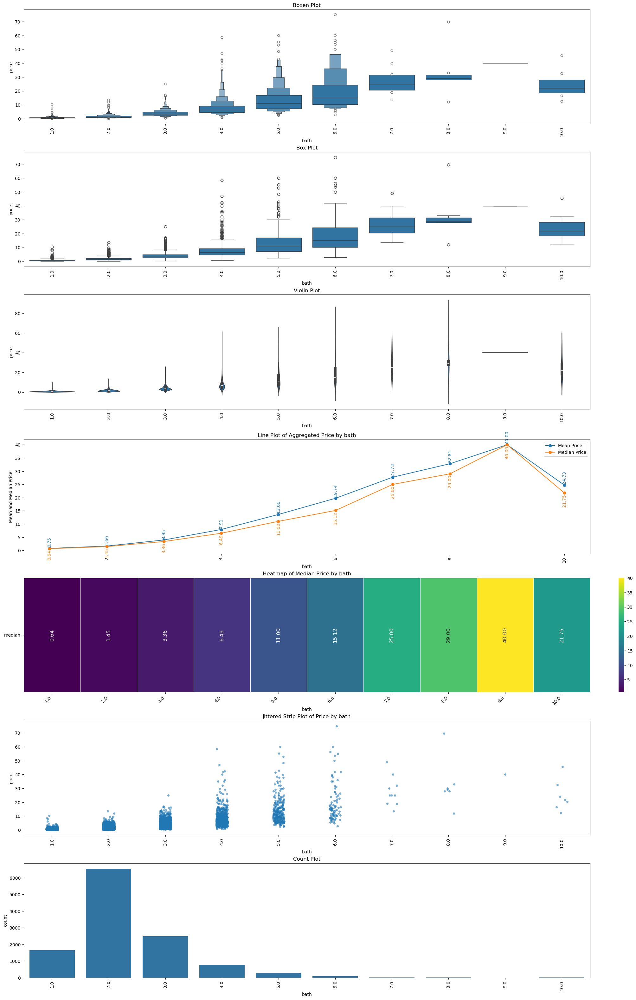

In [32]:
num_charts_plot(df, 'bath')

`observation`
- Price increases with the number of bathrooms – Higher bath categories generally have higher median prices.
- Higher variance in larger bath categories (5+) – The spread of prices is wider for 5+ bath categories, indicating significant variation in prices.
- Outliers are present in all categories – Especially in lower bath categories (1-4), there are many outliers at higher price points.
- 9 bath category has a very narrow spread – Suggests limited data points or less price variation.
- Higher bath counts (6+) have more dispersed prices – Suggests more price variation in luxury properties.
- Narrow density for lower bath counts (1-3) – Prices are more concentrated in a smaller range.
- Mean > Median → Right-skewed distribution
- Higher density for 1-5 bath categories, Greater spread in 5+ bath categories and Fewer data points for 8+ baths
- imbalanced data for bath column

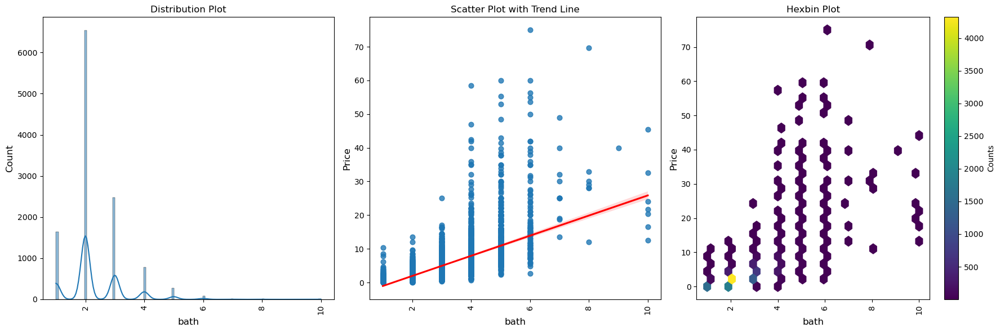

In [33]:
bivariate_plot(df, 'bath')

`observation`
- from hexbin plot majority of properties in our dataset have 1–3 bathrooms, and are priced in the ₹0–3 Cr range.

In [34]:
num_num_hyp_testing(df, 'price', 'bath')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.6927590794479621
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and bath are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.7496731475182905
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and bath are correlated


`observation`
- Pearson correlation (0.69) → strong positive linear relationship → more bathrooms generally it means higher price
- Spearman correlation (0.75) → strong positive monotonic relationship → as bathrooms increase, price tends to increase.
- More bathrooms → higher property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\1597587530.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)


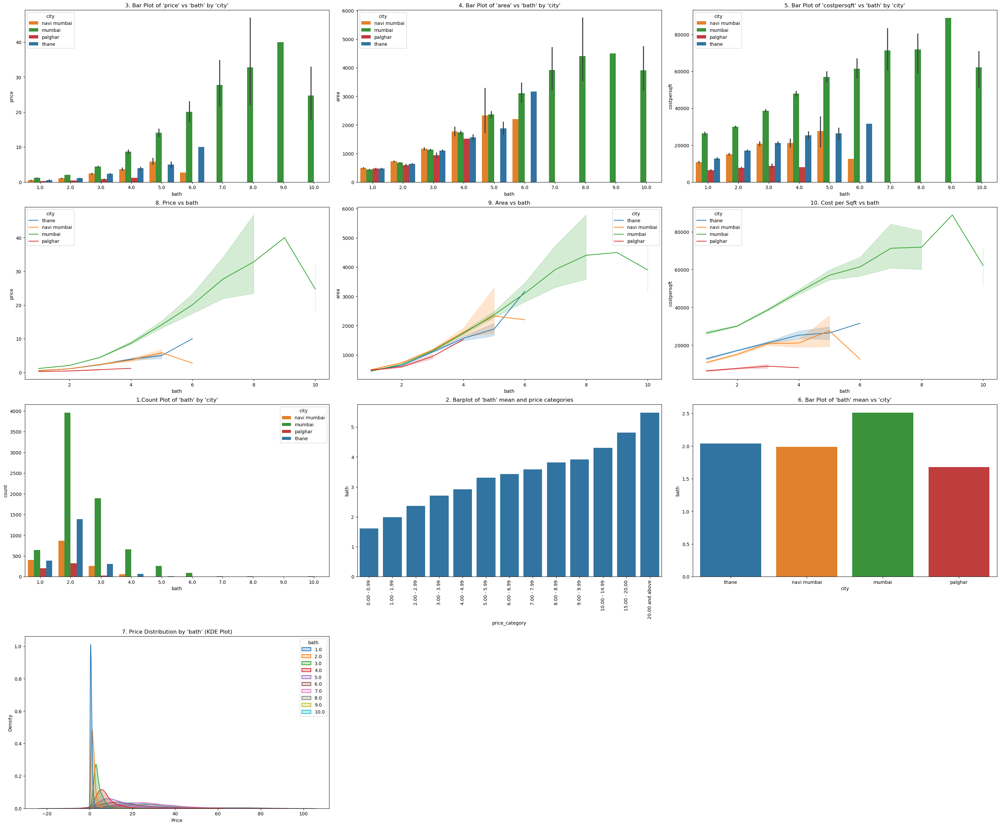

In [35]:
region_plots(df, 'bath')

`observation`
- Properties with more baths generally have higher prices.
- from costpersqft expensiveness as : mumbai> thane > navi mumbai > palghar
- after a certain point(eg after bath = 5), Thane properties become more expensive but may offer less area compared to Navi Mumbai.
- Mumbai generally offer more bath properties on average compared to other regions.

In [36]:
summarize_properties(df, 'bath')

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,0.754509,0.640,1645,645,1.050,405,0.454,389,0.590,206,0.2825
1,2.0,1.655148,1.450,6535,3960,1.890,866,0.990,1386,1.000,323,0.3950
2,3.0,3.951286,3.360,2481,1891,3.840,261,2.210,305,2.250,24,0.8375
3,4.0,7.908933,6.490,778,659,7.000,54,3.245,64,3.500,1,1.2200
4,5.0,13.599567,11.000,277,261,11.310,4,5.725,12,5.025,0,NaN
5,6.0,19.736364,15.125,88,86,15.275,1,2.750,1,10.000,0,NaN
6,7.0,27.727000,25.000,10,10,25.000,0,NaN,0,NaN,0,NaN
7,8.0,32.814286,29.000,7,7,29.000,0,NaN,0,NaN,0,NaN
8,9.0,40.000000,40.000,1,1,40.000,0,NaN,0,NaN,0,NaN
9,10.0,24.732857,21.750,7,7,21.750,0,NaN,0,NaN,0,NaN


`observation`
- less number of properties after bath 5 in mumbai, for thane and navi mumbai it is after bath 3 , for palghar after bath 2 , Locations like Navi Mumbai, Thane, and Palghar have no data for baths above 6.
- Mean and median prices rise as the number of baths increases, but fluctuations occur (e.g., bath=10 has a lower mean than bath=9).
- Properties with 6, 7, 8, and 9 baths have fewer data points, which may introduce bias in the above analysis.

`solution`
- Convert bath values ≥5 into a single category (5+)

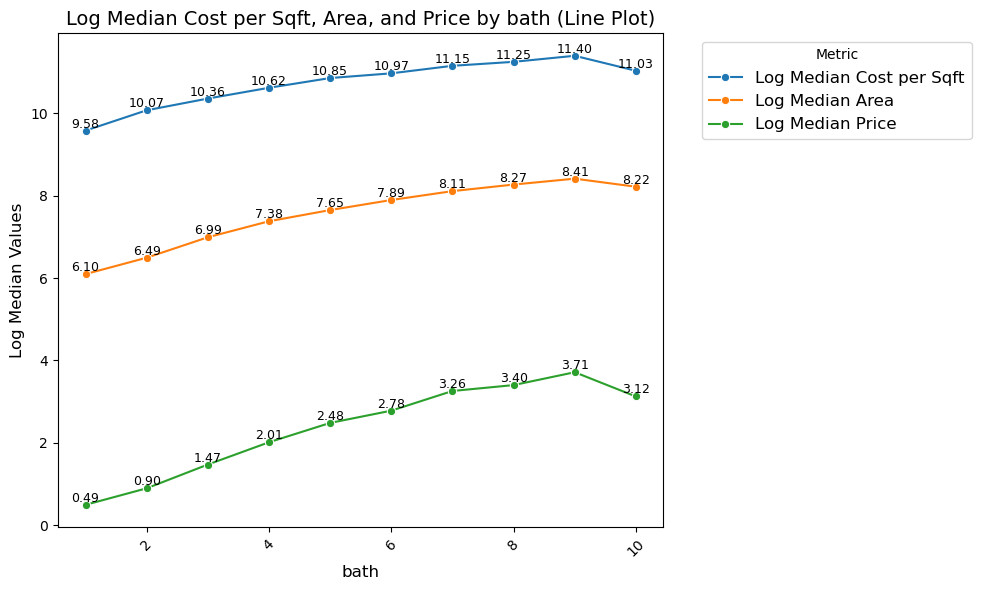

 bath  log_median_costpersqft_values
  9.0                      11.395155
  8.0                      11.248244
  7.0                      11.151898
 10.0                      11.031642
  6.0                      10.969172
  5.0                      10.854865
  4.0                      10.618592
  3.0                      10.356885
  2.0                      10.072597
  1.0                       9.579072


In [37]:
median_plot(df,'bath')

`observation`
- Properties with 8.0, 7.0, 10.0, 6.0, 5.0, 4.0, 3.0, 2.0, and 1.0 baths are more affordable compared to properties with 9 baths.
- the trend for expensive properties follows:9.0 > 8.0 > 7.0 > 10.0 > 6.0 > 5.0 > 4.0 > 3.0 > 2.0 > 1.0

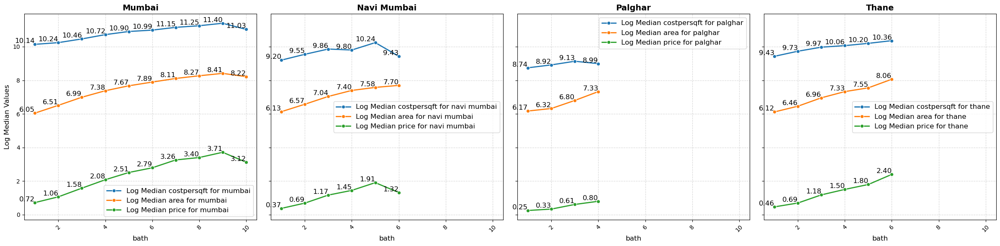

In [38]:
plot_log_median_subplots(df,'bath')

### parking

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


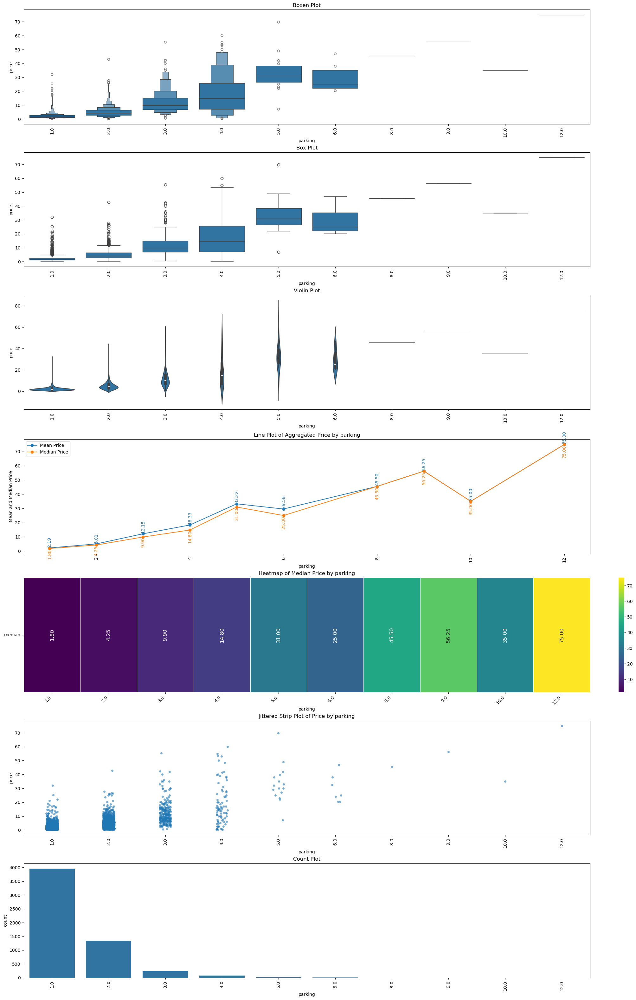

In [39]:
num_charts_plot(df, 'parking')

`observation`
- Higher parking categories (8-12) have higher median prices.
- Lower parking categories (1-4) have lower median prices but more variability.
- Categories 1-3 have many outliers, suggesting price fluctuations.
- Categories 8, 9, 10, and 12 have stable prices with little variation.
- A clear upward trend in price with increasing parking category.
- imabalanced data for parking column 

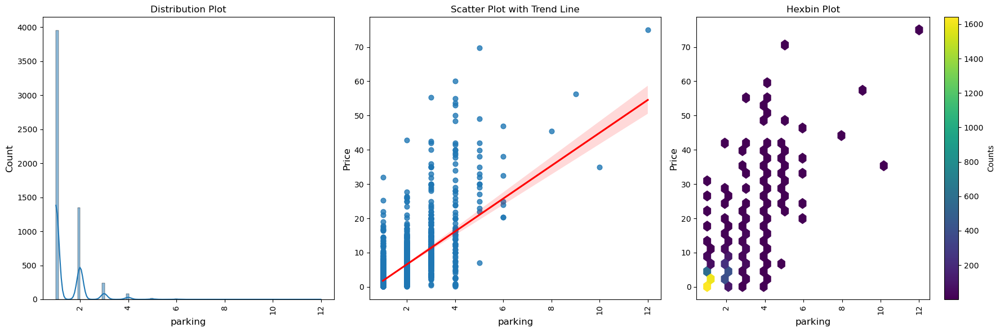

In [40]:
bivariate_plot(df, 'parking')

In [41]:
num_num_hyp_testing(df, 'price', 'parking')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.6844105129835005
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and parking are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.5539970768968259
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and parking are correlated


`observation`
- Pearson correlation (0.68) → strong positive linear relationship → more parking generally means higher price.
- Spearman correlation (0.55) → moderate positive monotonic relationship → as parking spaces increase, price tends to increase.
- More parking → higher property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\1597587530.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)


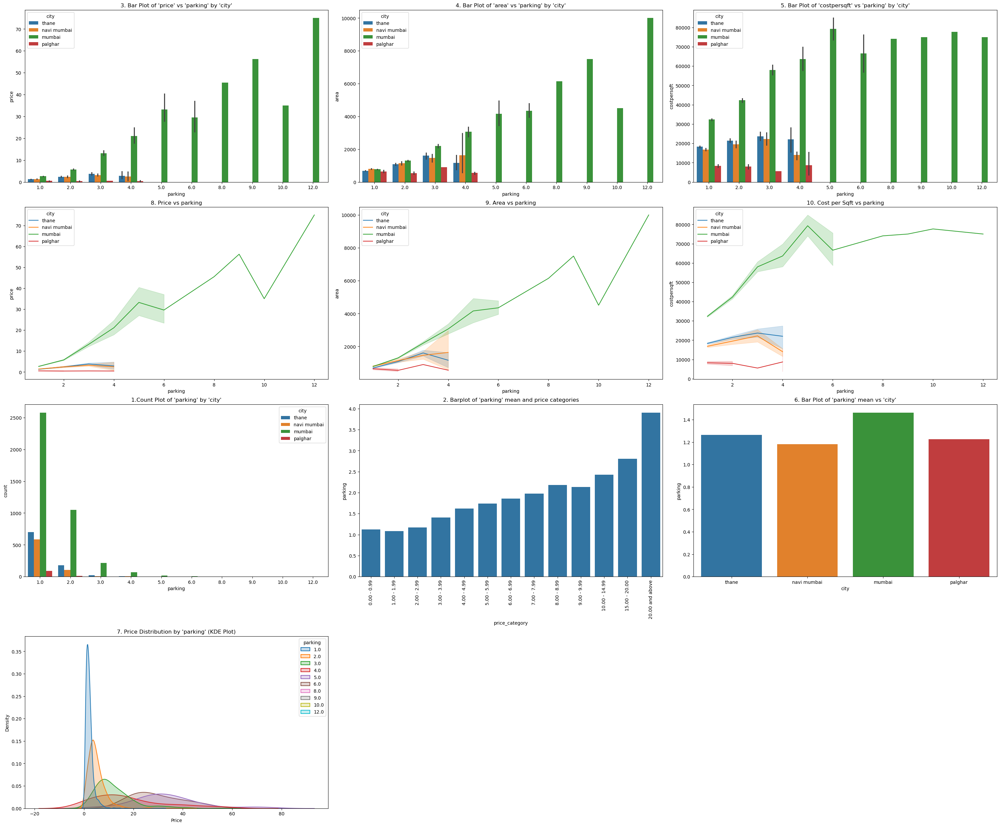

In [42]:
region_plots(df, 'parking')

`observation`
- Mumbai dominates in price, area, and cost per sqft across all parking levels.
- Higher parking spaces (5+) are mostly associated with Mumbai, indicating larger properties.
- Navi Mumbai and Thane have moderate prices and area, with lower cost per sqft than Mumbai.
- Palghar has the lowest price, area, and cost per sqft, showing affordability.
- Expensiveness based on parking: Mumbai > Thane > Navi Mumbai > Palghar.
- Mumbai generally offer more parking spaces on average compared to other regions.

form KDE plot 
- Lower parking categories (1-4) have high-density peaks at lower prices.
- Higher parking categories (5-12) have wider distributions, indicating higher price variance.
- Price distributions for higher parking categories (8-12) are more spread out towards higher prices.
- Density sharply declines as price increases, with some long tails extending to high prices.
- Possible data skewness, as most prices concentrate at the lower end.

In [43]:
summarize_properties(df, 'parking')

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,2.189845,1.80,3952,2578,2.250,583,1.170,701,1.17,90,0.42
1,2.0,5.011780,4.25,1346,1048,4.950,105,2.000,180,2.25,13,0.45
2,3.0,12.151157,9.90,242,215,11.000,4,3.085,22,3.65,1,0.50
3,4.0,18.325976,14.80,82,70,16.285,4,1.710,5,2.55,3,0.40
4,5.0,33.221875,31.00,16,16,31.000,0,NaN,0,NaN,0,NaN
5,6.0,29.582857,25.00,7,7,25.000,0,NaN,0,NaN,0,NaN
6,8.0,45.500000,45.50,1,1,45.500,0,NaN,0,NaN,0,NaN
7,9.0,56.250000,56.25,1,1,56.250,0,NaN,0,NaN,0,NaN
8,10.0,35.000000,35.00,1,1,35.000,0,NaN,0,NaN,0,NaN
9,12.0,75.000000,75.00,1,1,75.000,0,NaN,0,NaN,0,NaN


`observation`
- less number of properties from parking 5 in mumbai, for thane and navi mumbai it is from parking 3 , for palghar less data or may be special parking area not needed there. 
- Mean and median prices rise as the number of baths increases, but fluctuations occur (e.g., parking=10 has a lower mean than parking=9).
- some parking have fewer data points, which may introduce bias in the above analysis.

`solution`
- Convert parking values ≥5 into a single category (5+)

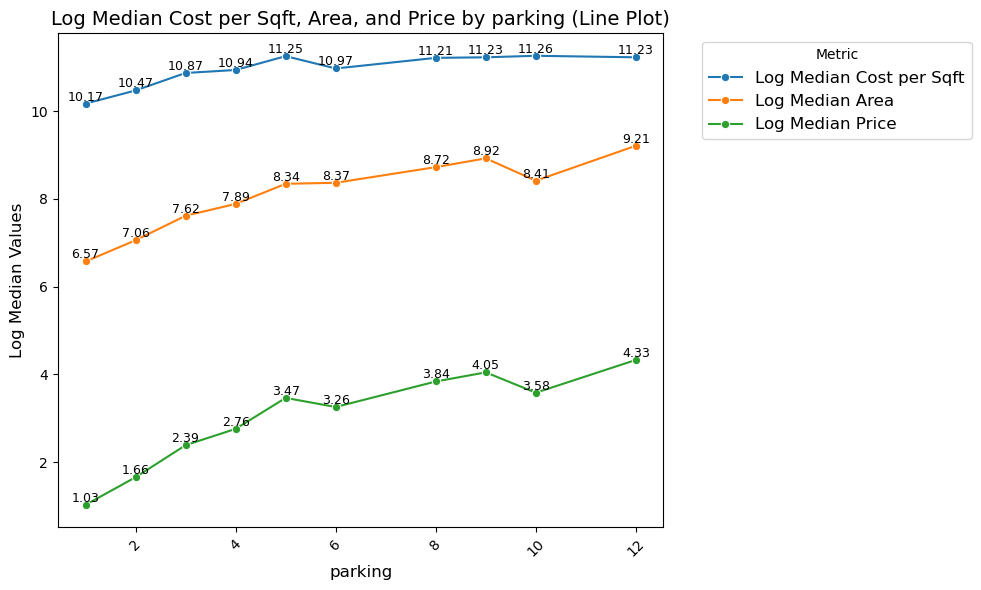

 parking  log_median_costpersqft_values
    10.0                      11.259851
     5.0                      11.251535
     9.0                      11.225257
    12.0                      11.225257
     8.0                      11.212590
     6.0                      10.970626
     4.0                      10.936174
     3.0                      10.868283
     2.0                      10.470263
     1.0                      10.169997


In [44]:
median_plot(df,'parking')

`observation`
- Properties with 5.0, 9.0, 12.0, 8.0, 6.0, 4.0, 3.0, 2.0, and 1.0 parkings are more affordable compared to properties with 10 parking .
- the trend for expensive properties follows:10.0 > 5.0 >  9.0 > 12.0 >  8.0 > 6.0 >  4.0 >  3.0 > 2.0 > 1.0

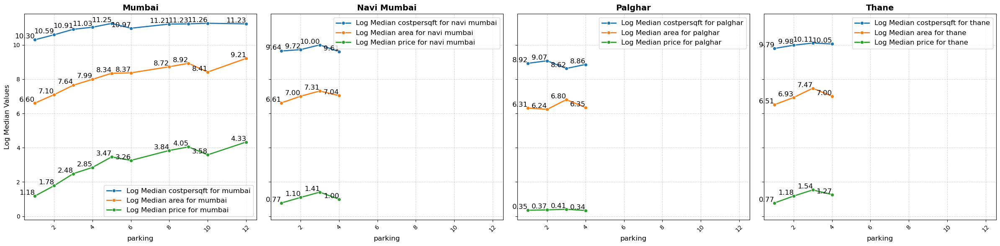

In [45]:
plot_log_median_subplots(df,'parking')

`observation`
- Larger projects with more parking tend to have higher cost per sqft and larger areas, especially in premium markets like Mumbai and Thane.
- Smaller projects or those in emerging areas like Palghar show minimal impact of parking availability on pricing.

### lift

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


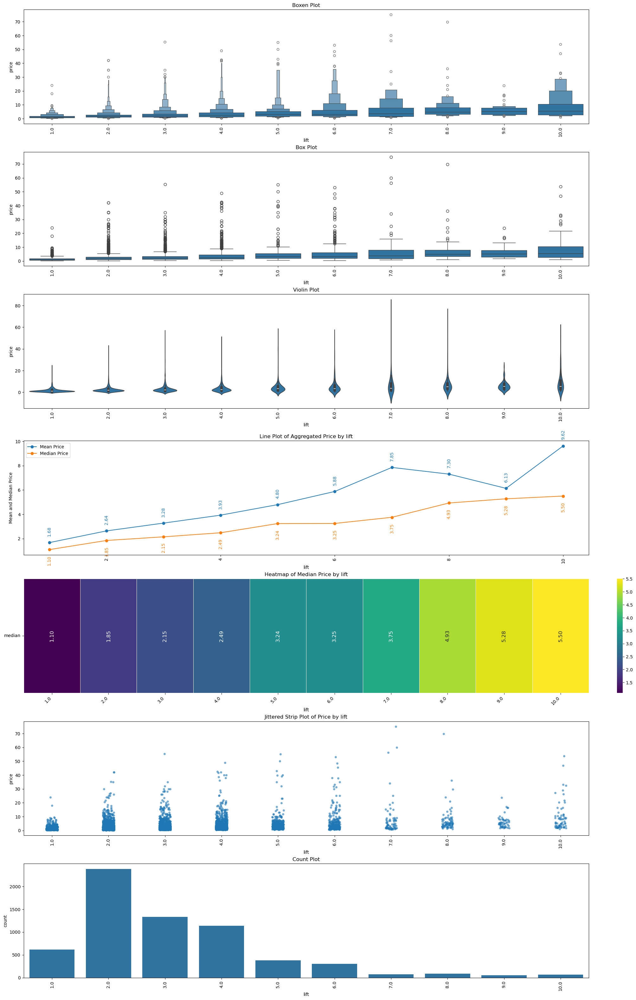

In [46]:
num_charts_plot(df, 'lift')

`observation`
- Low-lift categories (1-3) have median prices below 3 and Higher lift categories (8-10) have higher mean and median prices above 4.9 with extreme outliers.
- Lifts 1-3 have many outliers, indicating price fluctuations in these segments.
- The spread of prices (interquartile range) grows with higher categories
- A slight dip in mean price at category 9 suggests an exception, possibly due to fewer data points or property-specific factors.
- Jittered Strip Plot Interpretation:
  - Price distribution is right-skewed for all lift categories, with a concentration of properties in the lower price range and a few high-value outliers.
  - More lifts correlate with higher price ceilings, as upper lift categories (5-10) have more extreme outliers reaching above 50.
- imbalanced dtaa for lift column 

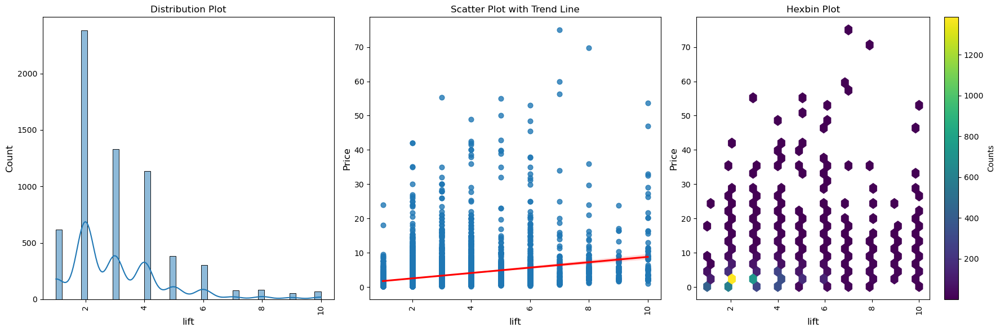

In [47]:
bivariate_plot(df, 'lift')

In [48]:
num_num_hyp_testing(df, 'price', 'lift')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.27977702589141806
- p-value              : 4.334432114715123e-116
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and lift are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.3420051299050834
- p-value              : 4.130883425220227e-176
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and lift are correlated


`observation`
- Pearson correlation (0.28) → weak positive linear relationship → presence of lift slightly increases price.
- Spearman correlation (0.34) → weak positive monotonic relationship → more lift availability tends to increase price slightly.
- Lift availability → slight increase in property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\1597587530.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)


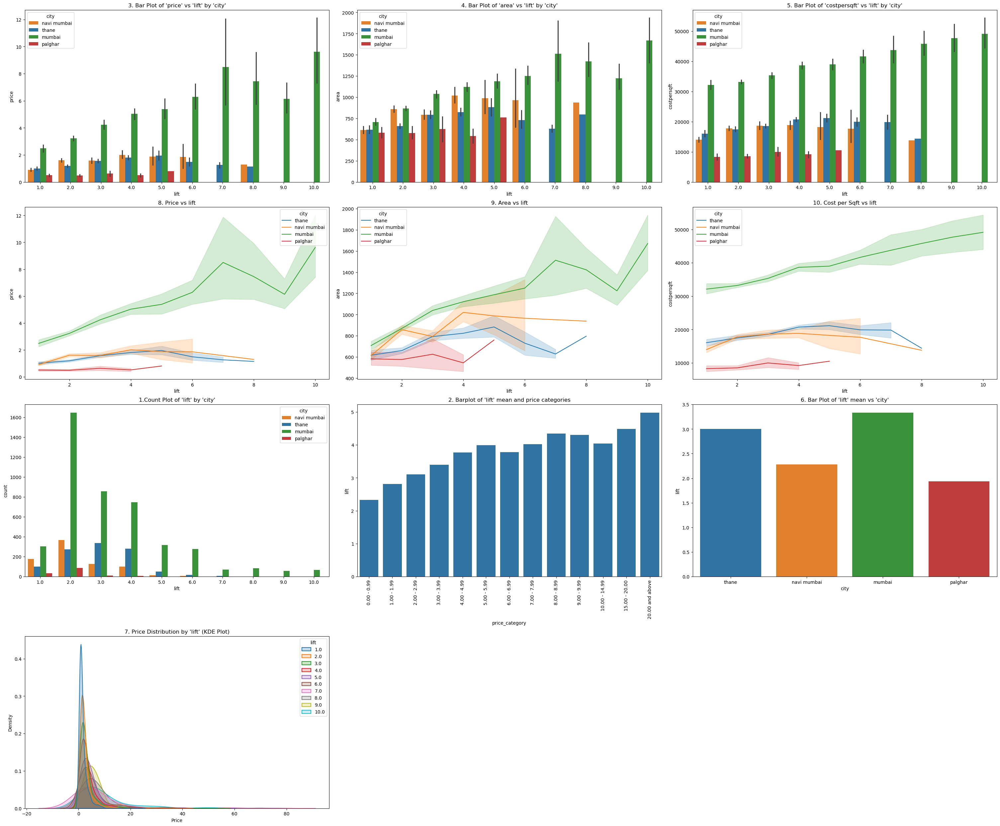

In [49]:
region_plots(df, 'lift')

`observation`
- Mumbai has the highest property prices, area, and cost per sqft, increasing with lift count.
- Thane & Navi Mumbai show moderate trends across all metrics.
- Palghar has the lowest values in price, area, and cost per sqft
- Mumbai has the highest average lift count, followed by Thane and Navi Mumbai, Palghar has the least number of properties with lifts.
- Properties with fewer lifts are generally cheaper, while those with more lifts have a broader price range, often reaching higher values.

In [50]:
summarize_properties(df, 'lift')

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,1.676006,1.100,617,304,1.700,179,0.725,100,0.815,34,0.4175
1,2.0,2.637055,1.850,2380,1648,2.250,369,1.300,275,1.010,88,0.3950
2,3.0,3.278056,2.150,1330,856,2.700,127,1.250,337,1.180,10,0.6300
3,4.0,3.932221,2.485,1136,746,3.300,102,1.745,282,1.395,6,0.5350
4,5.0,4.796457,3.240,383,318,3.800,13,1.220,51,1.510,1,0.8000
5,6.0,5.878342,3.250,304,278,3.500,7,1.000,19,1.400,0,NaN
6,7.0,7.852628,3.755,78,71,4.210,0,NaN,7,1.210,0,NaN
7,8.0,7.302824,4.930,85,83,4.990,1,1.290,1,1.140,0,NaN
8,9.0,6.133750,5.275,56,56,5.275,0,NaN,0,NaN,0,NaN
9,10.0,9.621304,5.500,69,69,5.500,0,NaN,0,NaN,0,NaN


`observation`
- sufficient number of properties for mumbai, for thane and navi mumbai less number of properties after lift 4 , for palghar less data or may be lifts not needed there. 
- Mean and median prices rise as the number of baths increases, but fluctuations occur (e.g., lift=9 has a lower mean than lift=7).
- some lift have fewer data points, which may introduce bias in the above analysis.

`solution`
- Convert lift values ≥6 into a single category (6+)

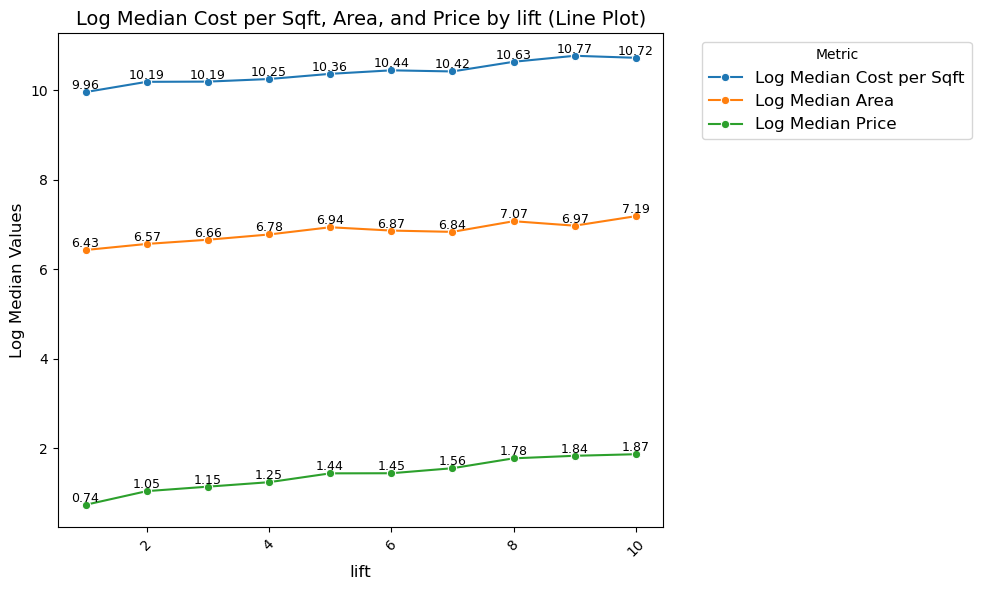

 lift  log_median_costpersqft_values
  9.0                      10.767895
 10.0                      10.722805
  8.0                      10.634003
  6.0                      10.443163
  7.0                      10.418240
  5.0                      10.364545
  4.0                      10.248990
  3.0                      10.191220
  2.0                      10.186446
  1.0                       9.957597


In [51]:
median_plot(df,'lift')

`observation`
- In comparison to properties which has 9 lifts ,properties which has  10.0, 8.0, 6.0, 7.0, 5.0, 4.0, 3.0, 2.0, 1.0 lifts are more affordable.
- Based on the gap between the price and area line plots, we can infer that the trend for expensive properties is as follows:  9.0 > 10.0 > 8.0 > 6.0 > 7.0 > 5.0 > 4.0 > 3.0 > 2.0 > 1.0

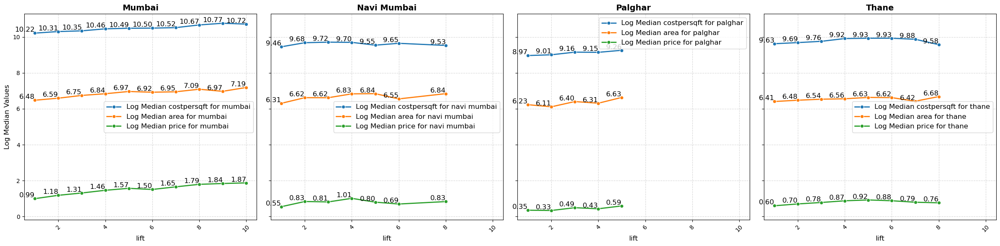

In [52]:
plot_log_median_subplots(df,'lift')

### balcony

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


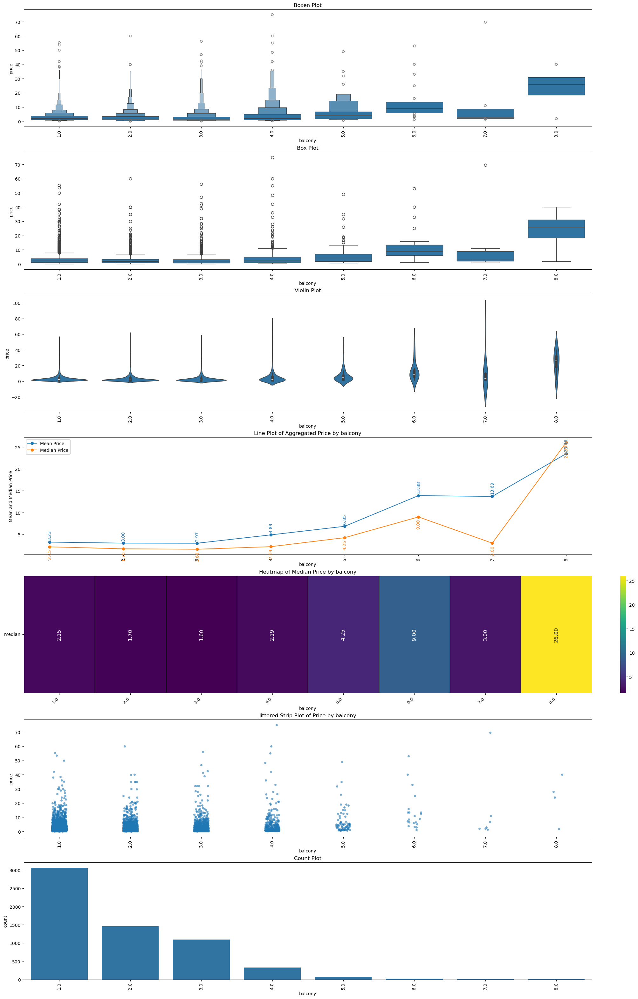

In [53]:
num_charts_plot(df, 'balcony')

`observation`
- Price distribution increases with balconies – Properties with more balconies tend to have higher prices.
- Outliers present – A few extreme high-price properties exist across all balcony categories.
- Variation in price – The spread of prices increases with more balconies, especially for 6+ balconies and show higher median price also.
- Limited data for higher balconies – Categories 6,7 and 8 balconies have fewer data points, but show significantly higher prices.
- The median price jumps sharply at 8th balcony, indicating a potential premium for such properties or because of outliers.
- some balcony have outliers, affecting the mean price.
- imbalanced data for balcony column 

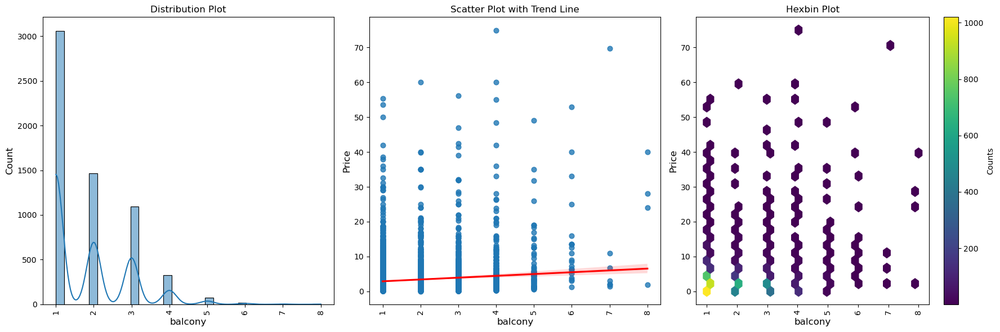

In [54]:
bivariate_plot(df, 'balcony')

In [55]:
num_num_hyp_testing(df, 'price', 'balcony')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.1125939736123568
- p-value              : 1.509350840005782e-18
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and balcony are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : -0.07132772559055967
- p-value              : 2.742358950604081e-08
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and balcony are correlated


`observation`
- Pearson correlation (0.11) → very weak positive linear relationship → more balconies slightly increase price.
- Spearman correlation (–0.07) → very weak negative monotonic relationship → slight tendency that more balconies may lower price, but effect is minimal.
- Balcony count has a very weak impact on price — effect direction is mixed.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\1597587530.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)


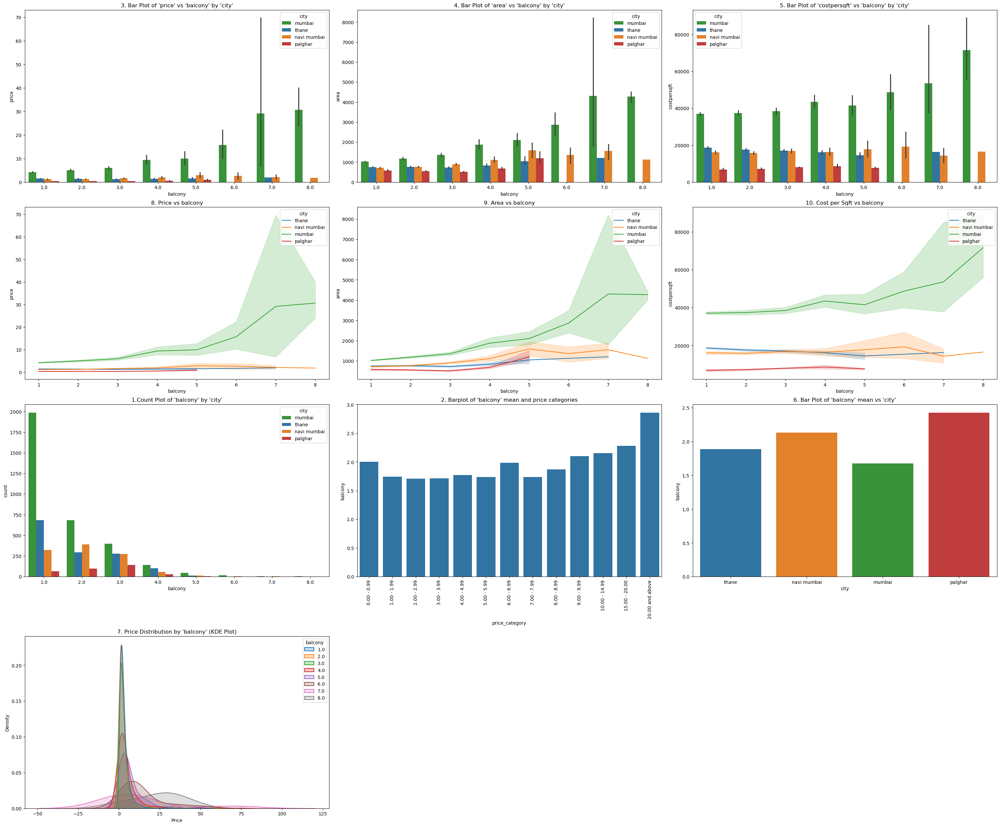

In [56]:
region_plots(df, 'balcony')

`observation`
- More balconies → Higher price, larger area, and increased cost per sqft, especially in Mumbai for 6 to 8 balconies.
- 8th balcony in Mumbai have the highest price, largest area, and highest cost per sqft.
- Other regions (Thane, Navi Mumbai, Palghar) show moderate increases in price and area with more balconies and have stable costs per sqft, with minor fluctuations.
- clear positive correlation between the number of balconies and the property area across all regions.
- costpersqft order of expensiveness by balcony: Mumbai > Navi Mumbai ≈ Thane > Palghar
- Mumbai has the highest number of properties with balconies, while Palghar has the lowest.
- below 9 cr properties we have almost 1 to 2 balconies, above that we have more than 2 balconies 
- Price distribution shows that most properties are in lower price ranges, but higher balcony counts are associated with a broader and higher price spread.

In [57]:
summarize_properties(df, 'balcony')

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,3.228382,2.150,3060,1986,3.02,324,0.950,684,1.20,66,0.35
1,2.0,2.996879,1.700,1464,684,3.30,389,1.050,295,1.16,96,0.35
2,3.0,2.973021,1.595,1096,398,3.75,275,1.200,280,0.97,143,0.36
3,4.0,4.889119,2.190,329,142,6.05,57,1.400,101,1.05,29,0.55
4,5.0,6.850987,4.250,76,46,5.65,14,2.225,13,1.49,3,0.85
5,6.0,13.878095,9.000,21,18,11.75,3,3.000,0,NaN,0,NaN
6,7.0,13.692857,3.000,7,3,11.00,3,2.000,1,1.95,0,NaN
7,8.0,23.462500,26.000,4,3,28.00,1,1.850,0,NaN,0,NaN


`observation`
- less number of properties from balcony 6 in mumbai, for thane and navi mumbai it is from balcony 5 , for palghar it is less from 4
- Mean and median prices rise as the number of baths increases, but fluctuations occur.
- some balcony have fewer data points, which may introduce bias in the above analysis.

`solution`
- Convert balcony values ≥6 into a single category (6+)

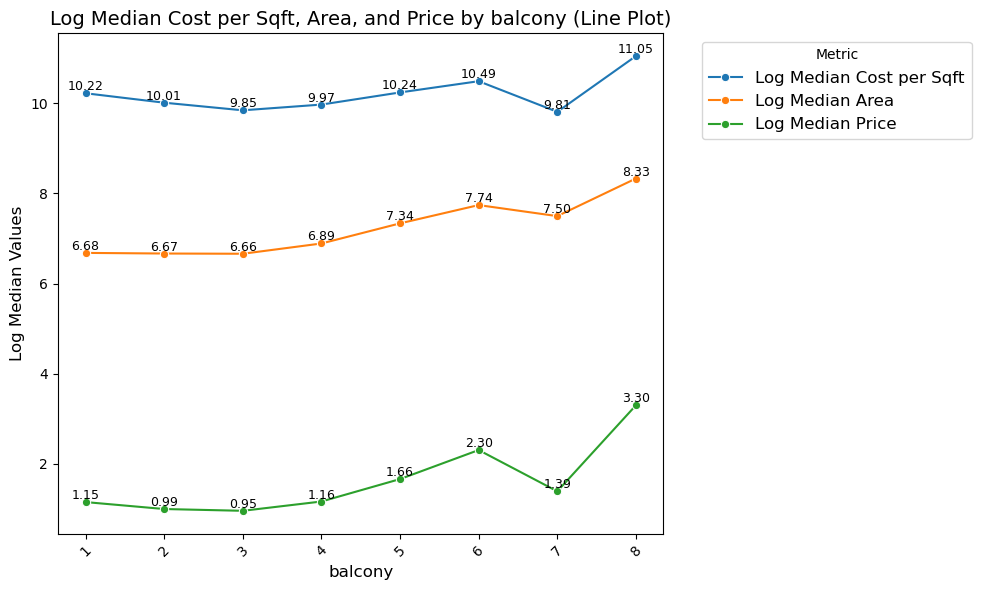

 balcony  log_median_costpersqft_values
     8.0                      11.049429
     6.0                      10.491302
     5.0                      10.242083
     1.0                      10.223649
     2.0                      10.014403
     4.0                       9.972547
     3.0                       9.845196
     7.0                       9.811263


In [58]:
median_plot(df,'balcony')

`observation`
- In comparison to properties which has 8 balconies ,properties which has  6.0, 5.0, 1.0, 2.0, 4.0, 3.0, 7.0 balconies are more affordable.
- we can infer that the trend for expensive properties is as follows: 8.0 > 6.0 > 5.0 > 1.0 > 2.0 > 4.0 > 3.0 > 7.0

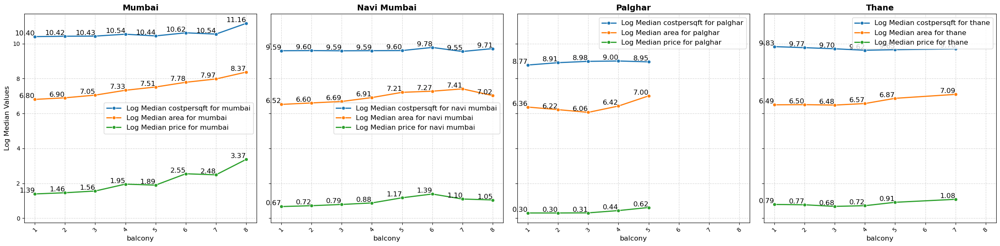

In [59]:
plot_log_median_subplots(df,'balcony')

### bed

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


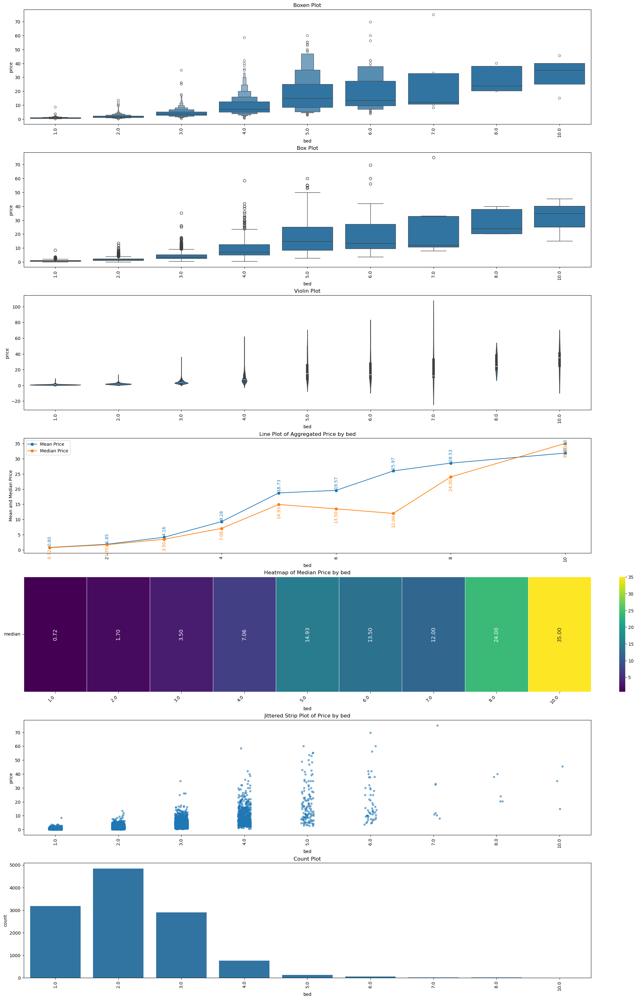

In [60]:
num_charts_plot(df, 'bed')

`observation`
- More bedrooms → Higher price & more variability, especially from 4+ bedrooms.
- Luxury properties (5+ bedrooms) show extreme outliers, with sharp price jumps.
- 1-3 bedroom properties remain in a relatively stable price range, making them more affordable.
- Beyond 4 bedrooms, price distribution widens significantly, indicating premium/luxury markets.
- imbalanced bed column dataset
- 1-3 bedrooms: Stable pricing, 5+ bedrooms: High price variation with outliers, 6 bedrooms: Median price drop, mean inflated by outliers and 8-10 bedrooms: Price stabilizes in the ultra-luxury segment.
- Heatmap Observation: Median price increases with bed count, with a significant jump at 5+ beds.
- Strip Plot Observation: Price distribution widens as bed count increases, with more outliers in larger properties.
- imbalanced bed column data 

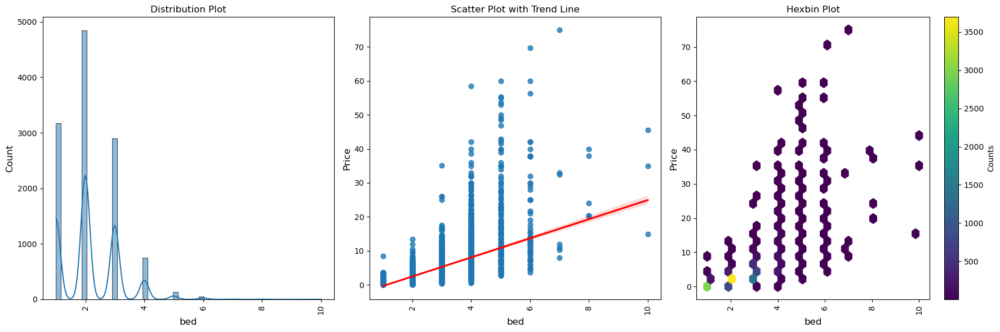

In [61]:
bivariate_plot(df, 'bed')

In [62]:
num_num_hyp_testing(df, 'price', 'bed')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.6577808243076878
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and bed are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.8059692643903158
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and bed are correlated


`observation`
- Pearson correlation (0.66) → strong positive linear relationship → more bedrooms generally mean higher price.
- Spearman correlation (0.81) → very strong positive monotonic relationship → as bedroom count increases, price tends to increase.
- More bedrooms → higher property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\1597587530.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='city', y=feature, data=df, ax=ax6, estimator=np.mean, errorbar=None, palette=region_palette)


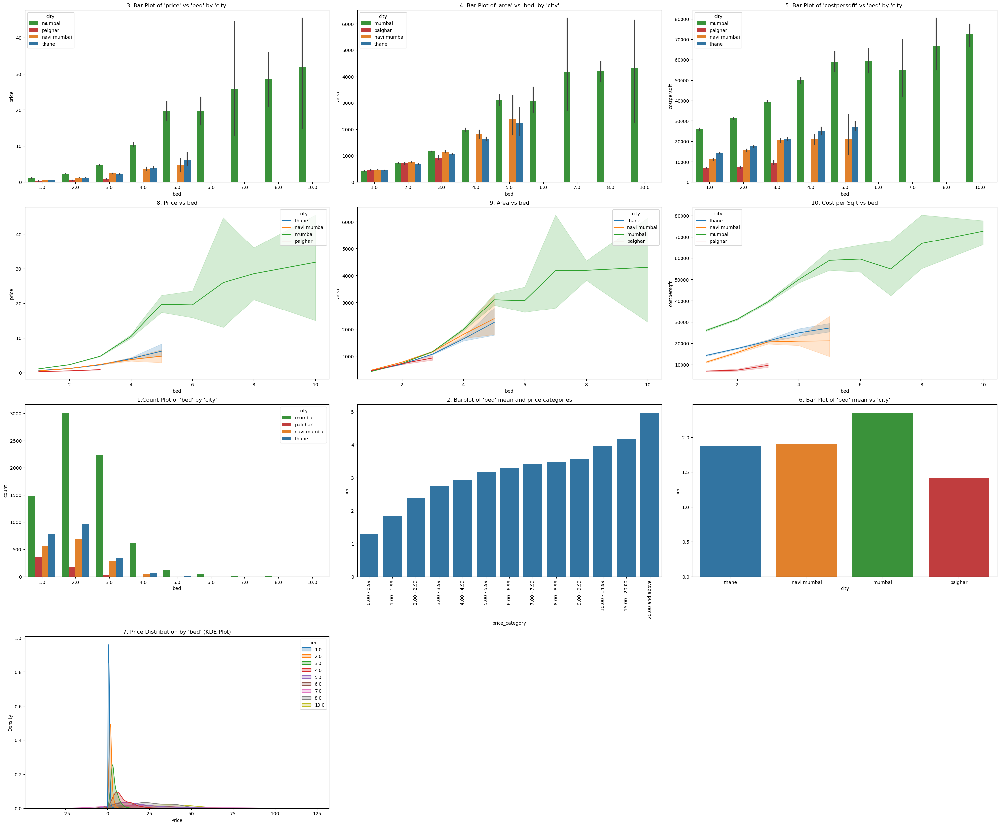

In [63]:
region_plots(df, 'bed')

`observation`
- Price, Area & Costpersqft vs. Bed: Trends are similar to bed count, showing Mumbai's dominance in pricing.
- expensivness in properties from bed column is : mumbai > thane > navi mumbai > palghar
- Bed Count Distribution: Mumbai has the highest count of 1-2 bed properties, followed by Navi Mumbai and Thane.
- Beds vs. Price Categories: Higher price categories tend to have more beds on average. 
- Mean Beds by Region: Mumbai has the highest average number of beds, while Palghar has the lowest.
- Price Distribution: Prices are heavily concentrated in the lower range, with a long tail for higher-priced properties.

In [64]:
summarize_properties(df, 'bed')

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,0.797805,0.724,3174,1485,1.050,558,0.470,779,0.64,352,0.31
1,2.0,1.853192,1.700,4843,3015,2.050,694,1.090,960,1.18,174,0.47
2,3.0,4.155553,3.500,2894,2235,4.000,288,2.215,342,2.20,29,0.85
3,4.0,9.281051,7.060,752,622,8.330,54,3.495,76,3.75,0,NaN
4,5.0,18.732441,14.930,127,118,16.095,4,4.500,5,4.85,0,NaN
5,6.0,19.568148,13.500,54,54,13.500,0,NaN,0,NaN,0,NaN
6,7.0,25.968571,12.000,7,7,12.000,0,NaN,0,NaN,0,NaN
7,8.0,28.530000,24.000,5,5,24.000,0,NaN,0,NaN,0,NaN
8,10.0,31.830000,35.000,3,3,35.000,0,NaN,0,NaN,0,NaN


`observation`
- less number of properties from bed 7 in mumbai, for thane and navi mumbai it is from bed 5 , for palghar less data from bed 3
- Mean and median prices rise as the number of baths increases
- some bed have fewer data points, which may introduce bias in the above analysis.

`solution`
- Convert bed values ≥5 into a single category (5+)

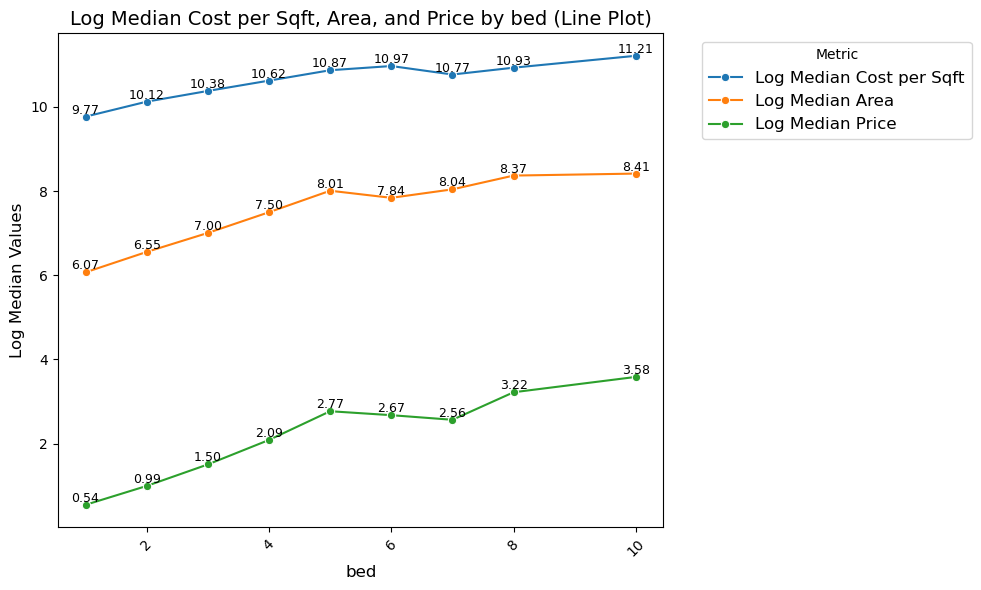

 bed  log_median_costpersqft_values
10.0                      11.212590
 6.0                      10.969172
 8.0                      10.929798
 5.0                      10.869349
 7.0                      10.767537
 4.0                      10.622644
 3.0                      10.377234
 2.0                      10.122744
 1.0                       9.766980


In [65]:
median_plot(df,'bed')

`observation`
- In comparison to properties which has 10 beds ,properties which has 6,8,5,7,4,3,2,1 bed are more affordable.
- we can infer that the trend for expensive properties is as follows: 10.0 > 6.0 > 8.0 > 5.0 > 7.0 > 4.0 > 3.0 > 2.0 > 1.0

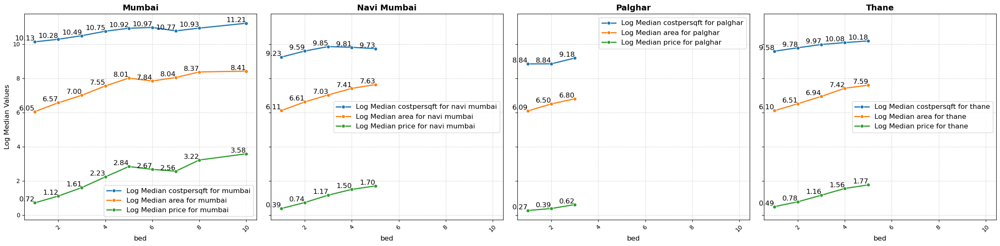

In [66]:
plot_log_median_subplots(df,'bed')

## `numerical columns with more than 15 unique values`

In [67]:
# Find numerical columns with more than 15 unique values
low_cardinality_columns = [col for col in numerical_columns if df[col].nunique() > 15]

print("Numerical columns with more than 15 unique categories:")
print(low_cardinality_columns)
print("-"*100)
print(f"Total: {len(low_cardinality_columns)}")

Numerical columns with more than 15 unique categories:
['project_in_acres', 'lattitude', 'longitude', 'flat_on_floor', 'total_floor', 'area', 'costpersqft', 'emi', 'price', 'education_mean_km', 'education_min_km', 'transport_mean_km', 'transport_min_km', 'shopping_centre_mean_km', 'shopping_centre_min_km', 'commercial_hub_mean_km', 'commercial_hub_min_km', 'hospital_mean_km', 'hospital_min_km', 'overall_min_mean_km', 'overall_avg_mean_km', 'overall_min_min_km', 'overall_avg_min_km', 'total_within_2km']
----------------------------------------------------------------------------------------------------
Total: 24


In [68]:
len(df['total_floor'].value_counts())

85

### flat_on_floor

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


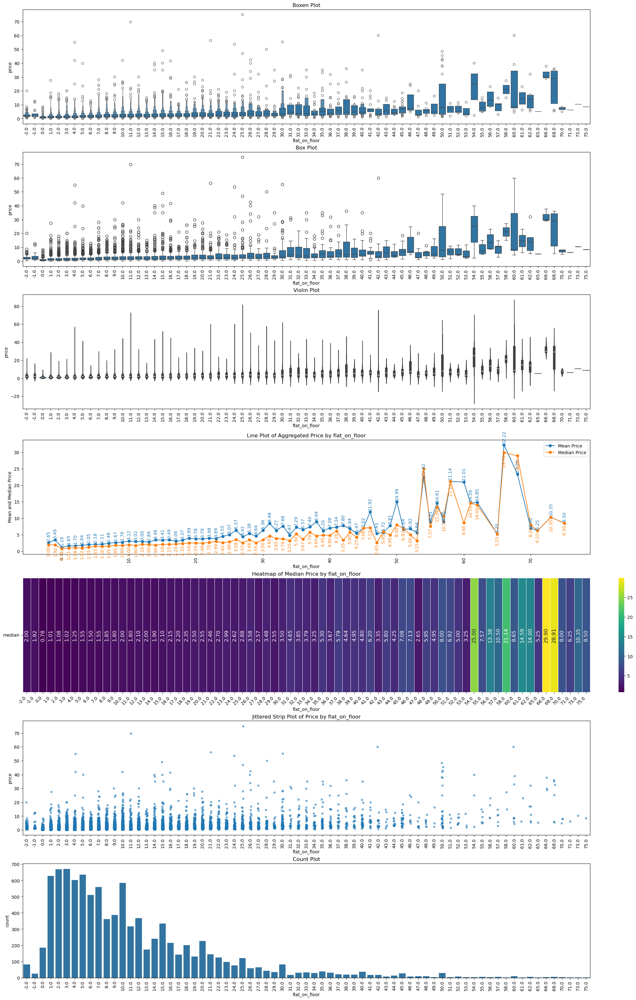

In [69]:
num_charts_plot(df, 'flat_on_floor')

`observation`
- Price remains low and stable on lower floors with some outliers.
- Higher floors (Floors beyond 50) show increased price variance and more extreme outliers, likely due to luxury properties.
- Median price is more stable than mean price, showing resistance to extreme values.
- Certain floors (e.g., 54, 58, 66, 68) show a sharp increase in median price, indicating premium flats.
- very few flats above 50 floor

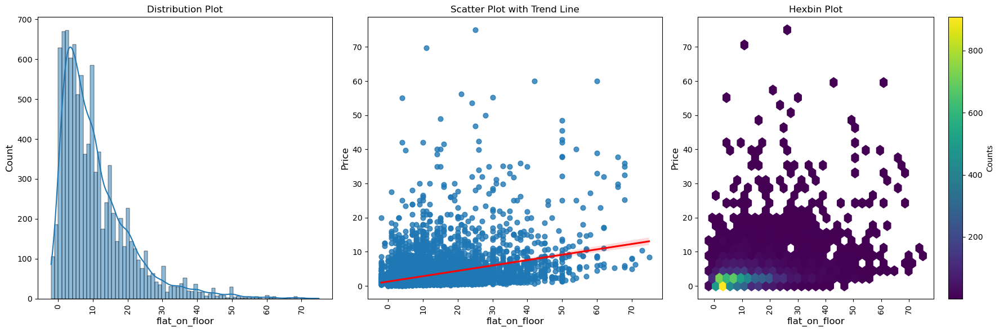

In [70]:
bivariate_plot(df, 'flat_on_floor')

`observation`
- Most flats are on lower floors, with count decreasing for higher floors.
- Prices vary across floors, but high-priced flats tend to appear on higher floors, likely due to premium properties.
- No strong correlation, but price dispersion increases as floor level rises.

In [71]:
num_num_hyp_testing(df, 'price', 'flat_on_floor')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.3621307823986614
- p-value              : 1.822918176697222e-294
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and flat_on_floor are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.3905006690684728
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and flat_on_floor are correlated


`observation`
- Pearson correlation (0.36) → moderate positive linear relationship → higher floor flats generally have higher prices.
- Spearman correlation (0.39) → moderate positive monotonic relationship → as floor level increases, price tends to increase.
- Flats on higher floors → tend to have higher property prices.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


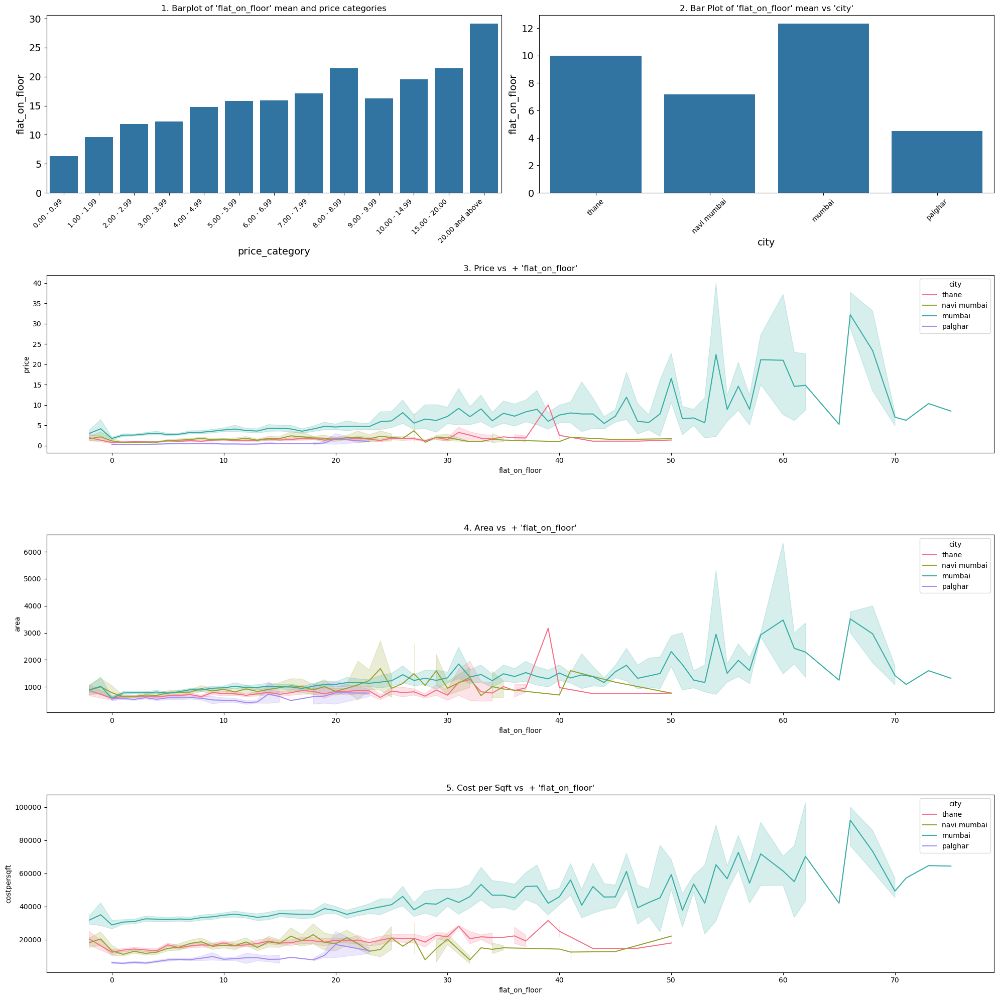

In [72]:
region_plots_high_card(df, 'flat_on_floor')

`observation`
- Higher floors correlate with higher price categories.
- Mumbai has the tallest buildings, followed by Thane, while Palghar has the lowest buildings.
- Price variations increase for high floors, especially in Mumbai
- Higher floors show more area variation, especially in Mumbai.
- Cost per sqft is mostly stable except for outliers, with Mumbai having the highest prices.
- Palghar has consistently smaller and more affordable flats.

In [73]:
len(df['flat_on_floor'].value_counts())

71

In [74]:
summarize_properties(df, 'flat_on_floor').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,-2.0,2.648098,1.995,82,56,2.41,15,1.640,11,1.65,0,NaN
1,-1.0,3.489167,1.925,24,16,2.20,8,1.450,0,NaN,0,NaN
2,0.0,1.186269,0.780,186,81,1.25,28,0.575,45,0.65,32,0.3425
3,1.0,1.649515,1.010,629,316,1.83,125,0.530,113,0.70,75,0.3000
4,2.0,1.697794,1.080,669,335,1.80,133,0.695,140,0.75,61,0.3000


`observation`
- convert into categories 

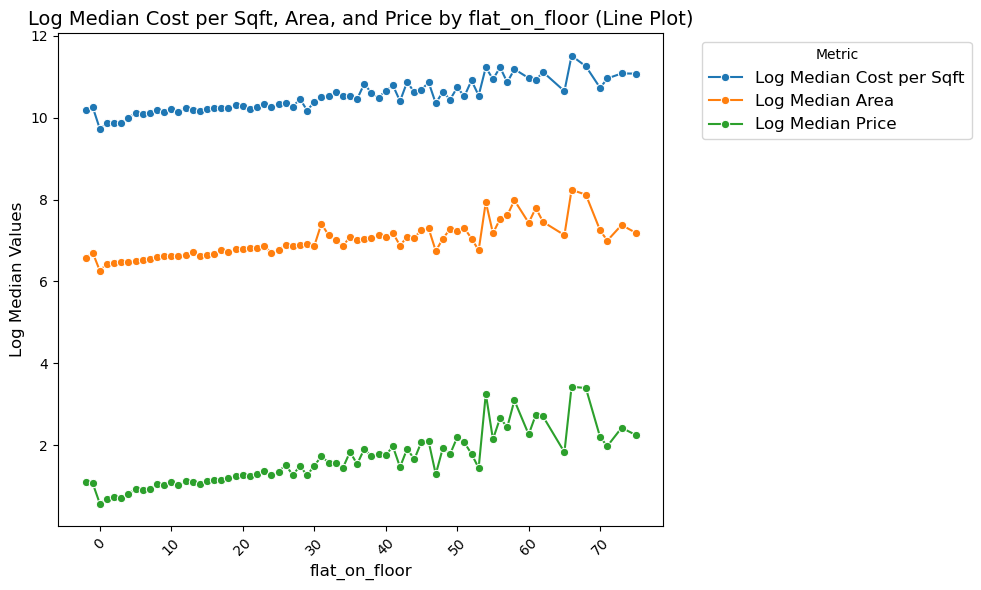

In [75]:
median_plot_high_card(df,'flat_on_floor')

`observation`
- Overall price sees higher volatility on upper floors, indicating non-linear pricing trends influenced by luxury or penthouse units.

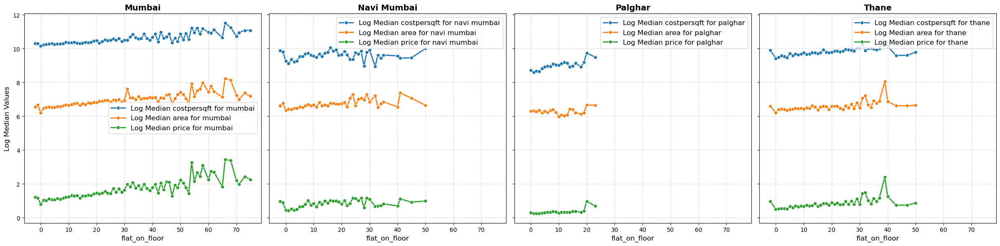

In [76]:
plot_log_median_subplots_high_card(df,'flat_on_floor')

### total_floor

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


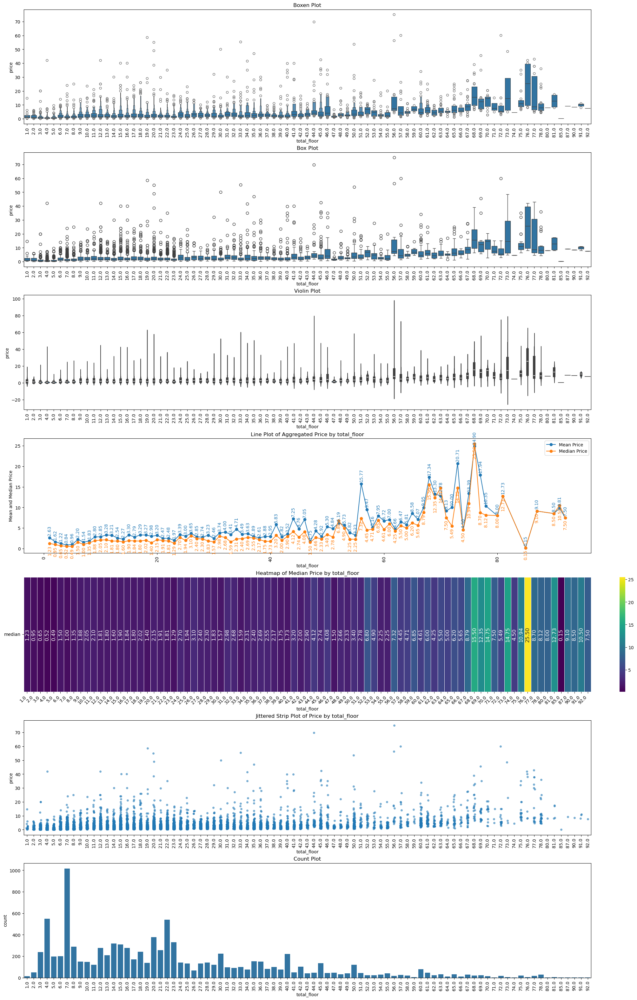

In [77]:
num_charts_plot(df, 'total_floor')

`ojbservation`
- Price is relatively stable for lower floors (1-30), with minor outliers.
- Higher total floors (above 30) show increasing price variability and more outliers.
- Extreme price spikes are observed in floors above 70, indicating premium pricing at high-rise levels.
- Mean price is more volatile than the median, confirming the presence of outliers.
- median price is relatively low (mostly between 2-7).
- A gradual increase is observed from floor 50 onwards.
- imbalanced in total_floor data 

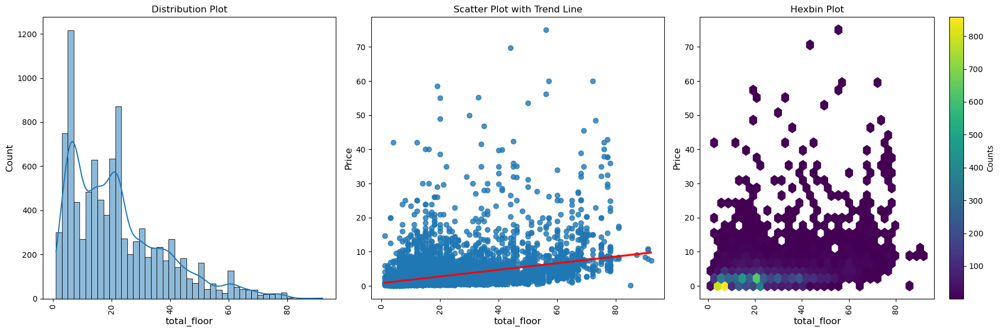

In [78]:
bivariate_plot(df, 'total_floor')

`observation`
- Most buildings have low floors.
- Floor height does not strongly impact price, but some higher-floor properties have high prices.
- The price variation is high across all floors, indicating other influencing factors (e.g., location, amenities).

In [79]:
num_num_hyp_testing(df, 'price', 'total_floor')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.3570200098359564
- p-value              : 1.3621828679945346e-292
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and total_floor are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.45187163361357824
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and total_floor are correlated


`observation`
- Pearson correlation (0.36) → moderate positive linear relationship → buildings with more total floors tend to have higher priced flats.
- Spearman correlation (0.45) → moderate positive monotonic relationship → as total floors increase, price tends to increase.
- Higher total building floors → tend to be linked with higher property prices.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


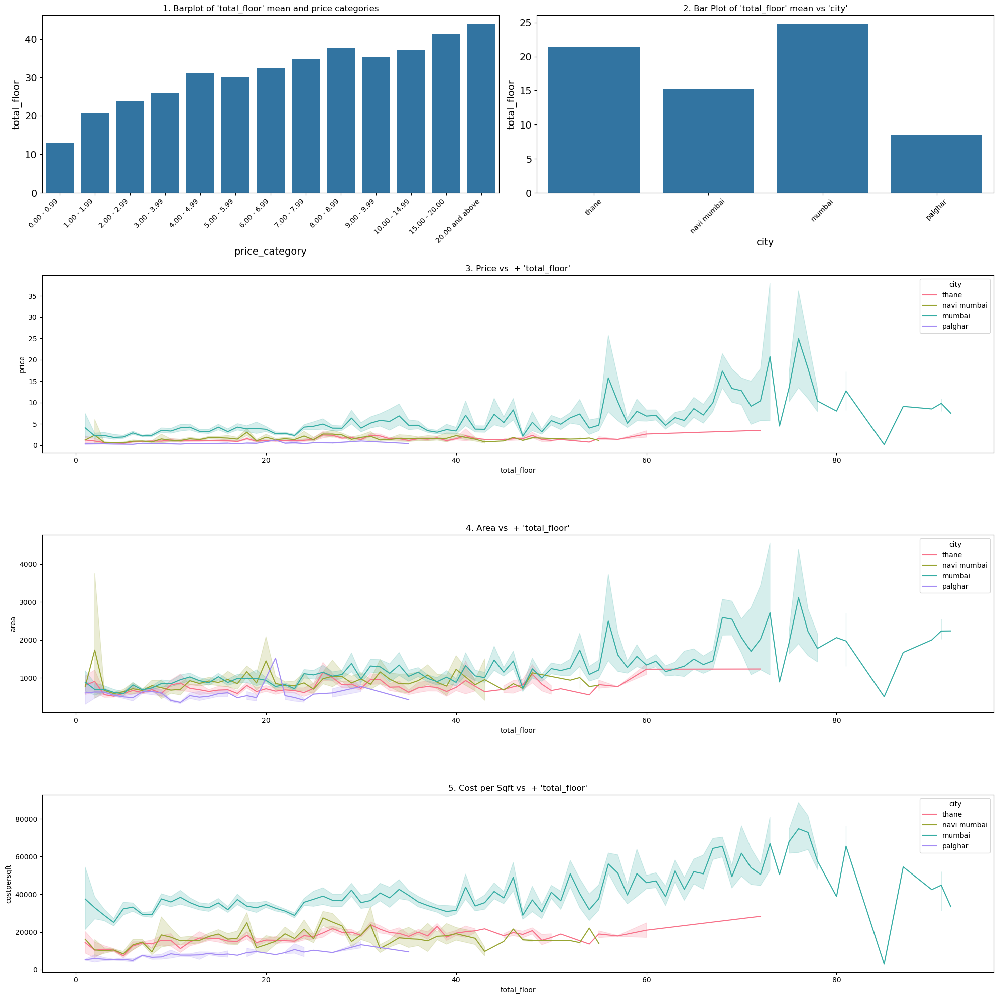

In [80]:
region_plots_high_card(df, 'total_floor')

`observation`
- Higher-priced properties tend to be in high-rise buildings.
- Mumbai has the tallest buildings, followed by Thane and Navi Mumbai, while Palghar has the lowest floors.
- Mumbai shows a significant price variation with total floors, while other regions show stable price trends.
- Mumbai exhibits the highest variations in area across floor counts, while other regions show steadier trends.
- Cost per sqft remains mostly stable across floor counts, with an extreme outlier in Thane.

In [81]:
summarize_properties(df, 'total_floor').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,1.0,2.627200,1.230,15,8,2.40,1,1.230,4,0.9675,2,0.325
1,2.0,1.624583,0.950,48,26,1.95,3,0.700,11,0.5000,8,0.400
2,3.0,1.221462,0.650,238,91,1.45,65,0.500,36,0.5000,46,0.300
3,4.0,0.837940,0.515,550,139,1.15,198,0.495,109,0.5200,104,0.270
4,5.0,0.961091,0.495,198,69,1.40,52,0.400,36,0.3550,41,0.240


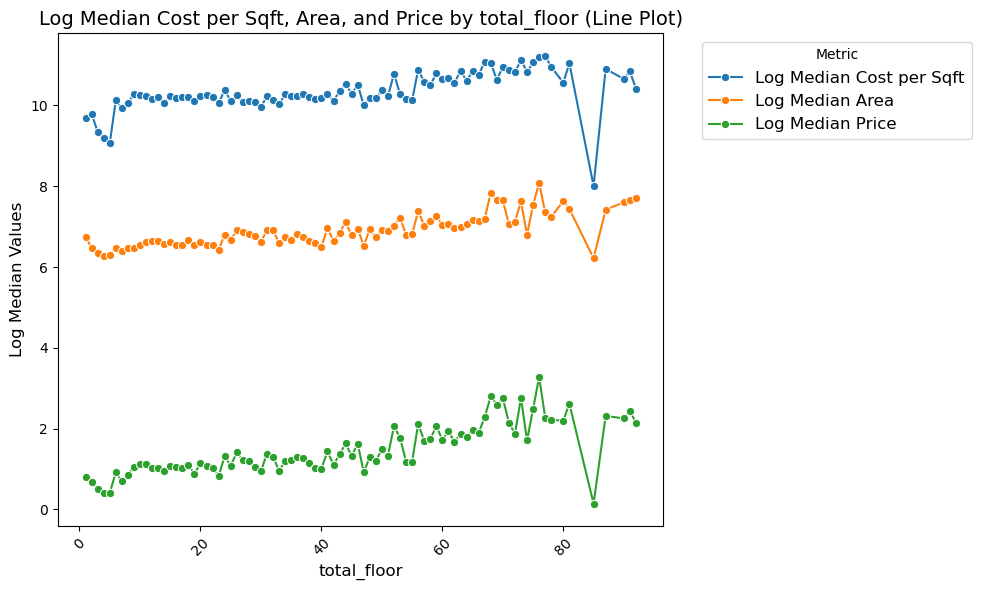

In [82]:
median_plot_high_card(df,'total_floor')

`observation`
- As total floors increase, the cost per sqft and area both rise, indicating premium pricing and larger apartments in high-rises

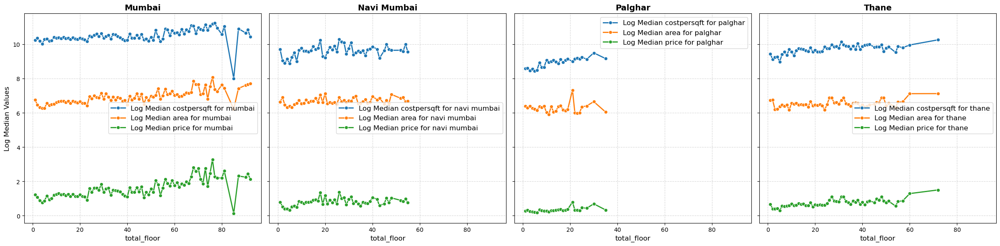

In [83]:
plot_log_median_subplots_high_card(df,'total_floor')

`observation`
- Mumbai and Navi Mumbai have premium pricing with stable area trends, while Thane follows a similar but slightly more affordable trajectory.
- Palghar is the most affordable but shows more variability in pricing and area distribution.

### price

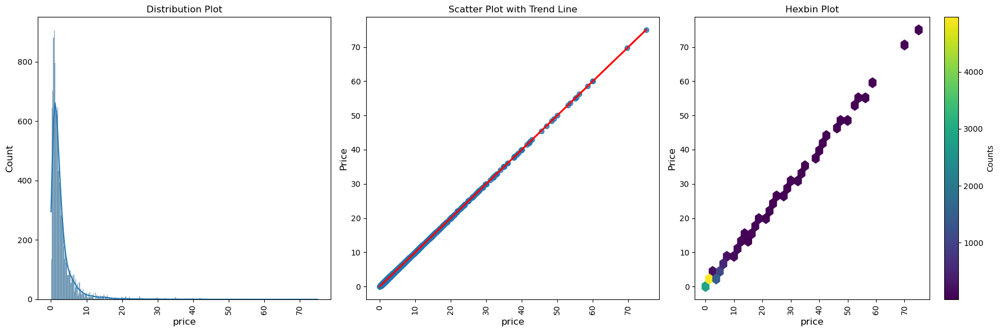

In [84]:
bivariate_plot(df, 'price')

`observation`
- The price distribution is highly right-skewed, with most properties in the low-price range and very few high-priced properties.
- Expensive properties are outliers, while affordable properties dominate the dataset.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


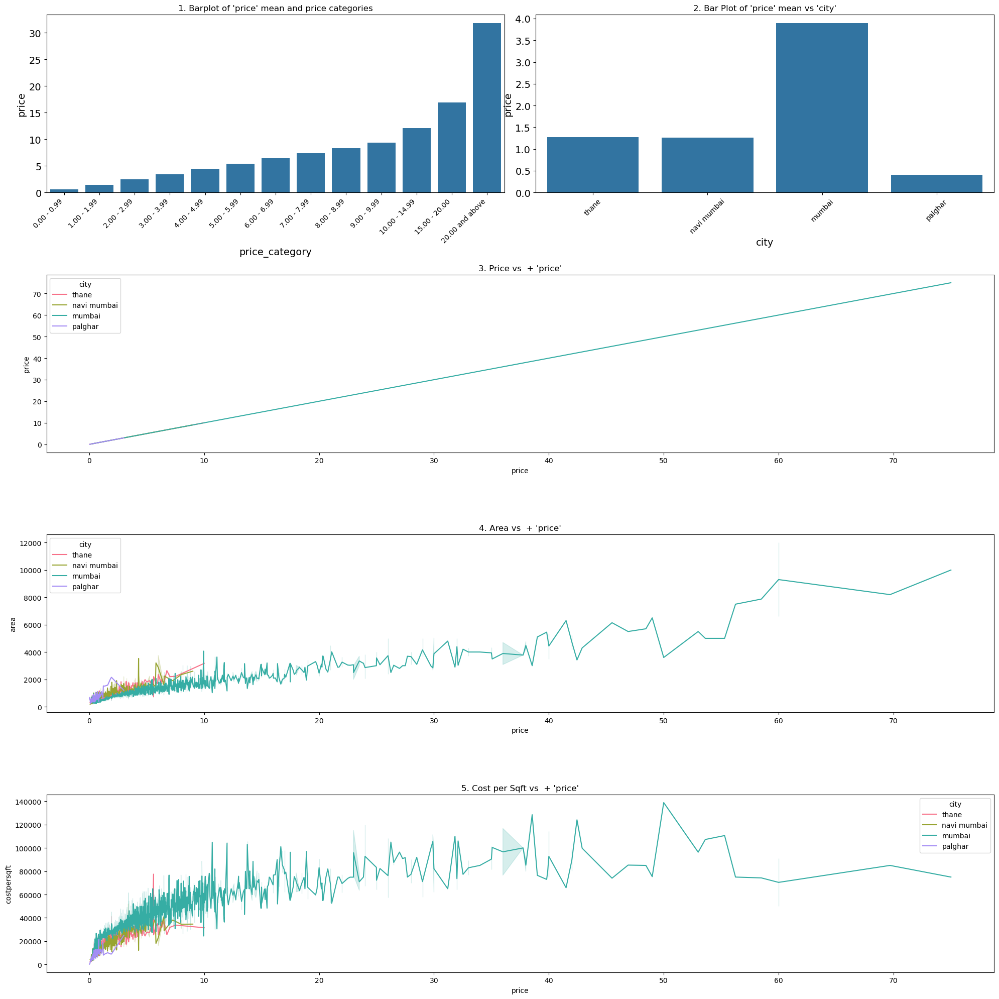

In [85]:
region_plots_high_card(df, 'price')

`observation`
- Mumbai has the highest property prices, followed by Thane and Navi Mumbai, while Palghar has the lowest
- Larger properties are generally more expensive, but price variations exist across regions.
- Cost per square foot is highly unstable at lower price levels but stabilizes at higher price points.
- Mumbai leads in high-cost properties, while Thane and Palghar remain more affordable but show variability.
- High-end properties exhibit both large areas and relatively stable cost per square foot.

In [86]:
summarize_properties(df, 'price').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,0.017,0.017,0.017,1,0,NaN,0,NaN,0,NaN,1,0.017
1,0.046,0.046,0.046,1,0,NaN,0,NaN,0,NaN,1,0.046
2,0.070,0.070,0.070,1,0,NaN,0,NaN,1,0.070,0,NaN
3,0.075,0.075,0.075,1,0,NaN,1,0.075,0,NaN,0,NaN
4,0.085,0.085,0.085,2,0,NaN,0,NaN,1,0.085,1,0.085


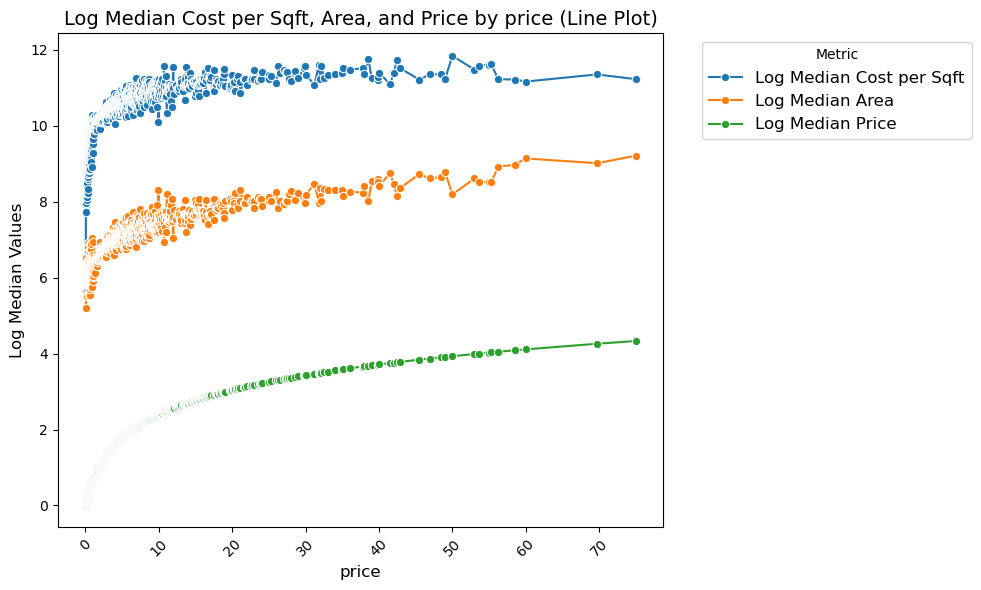

In [87]:
median_plot_high_card(df,'price')

`observation`
- Cost per sqft is volatile at lower price ranges but stabilizes for expensive properties.
- Higher-priced properties tend to have larger areas, but growth slows at extreme price points.

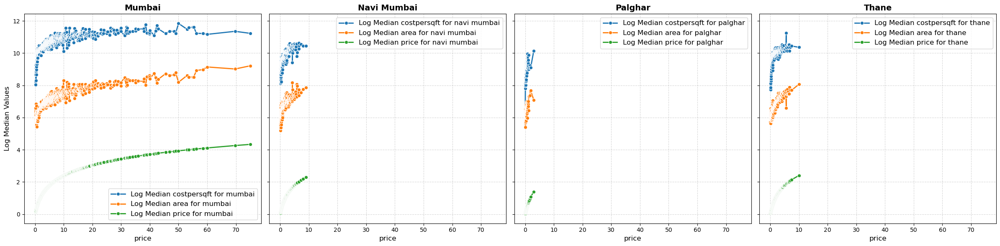

In [88]:
plot_log_median_subplots_high_card(df,'price')

### area

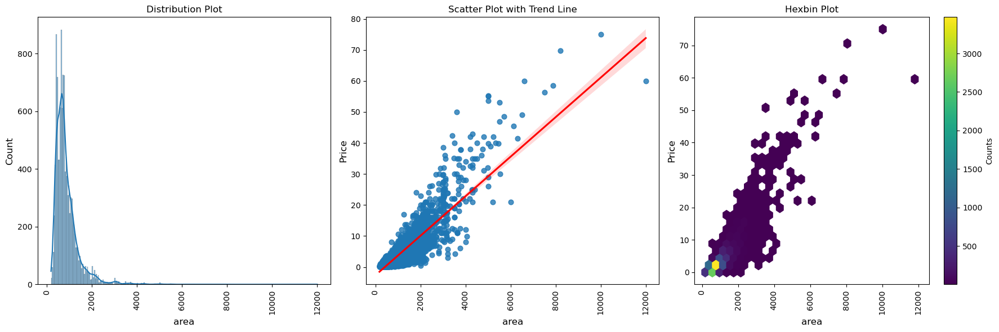

In [89]:
bivariate_plot(df, 'area')

`observation`
- The "area" variable is highly skewed, with most values in the lower range and a few extreme outliers.
- The scatter plot shows a positive correlation between "area" and "price," but with notable variance, especially for larger areas.

In [90]:
num_num_hyp_testing(df, 'price', 'area')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.8741263481561212
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and area are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.8127841433247153
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and area are correlated


`observation`
- Pearson correlation (0.87) → very strong positive linear relationship → larger area strongly increases price.
- Spearman correlation (0.81) → very strong positive monotonic relationship → as area increases, price tends to increase.
- Bigger area → strongly linked to higher property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


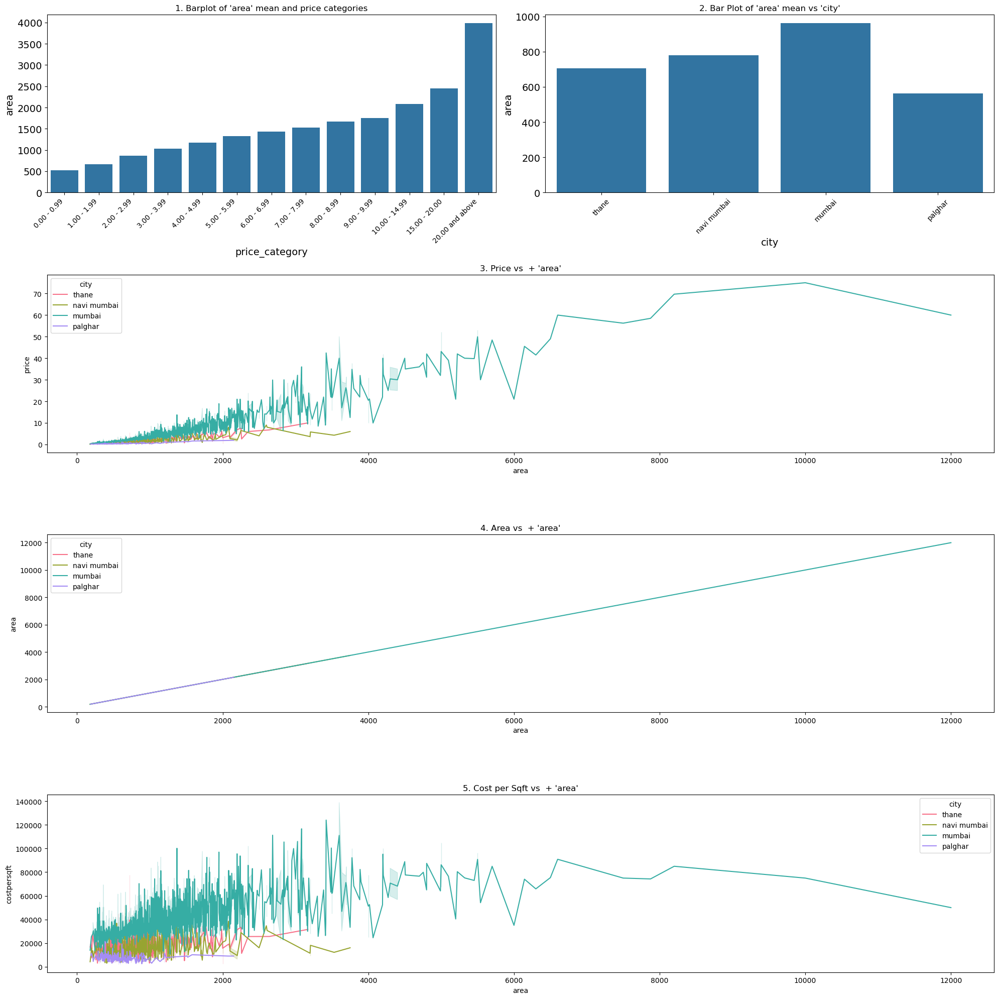

In [91]:
region_plots_high_card(df, 'area')

`observation`
- Larger properties are associated with higher price categories, with a sharp rise in the highest price range.
- Mumbai has the highest mean area, while Palghar has the smallest, reflecting regional property trends.

In [92]:
summarize_properties(df, 'area').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,180.0,0.208333,0.25,3,1,0.25,1,0.075,1,0.30,0,NaN
1,189.0,0.180000,0.18,1,0,NaN,0,NaN,0,NaN,1,0.18
2,190.0,0.370000,0.37,1,0,NaN,0,NaN,1,0.37,0,NaN
3,197.0,0.500000,0.50,1,1,0.50,0,NaN,0,NaN,0,NaN
4,200.0,0.203333,0.15,3,0,NaN,0,NaN,1,0.15,2,0.23


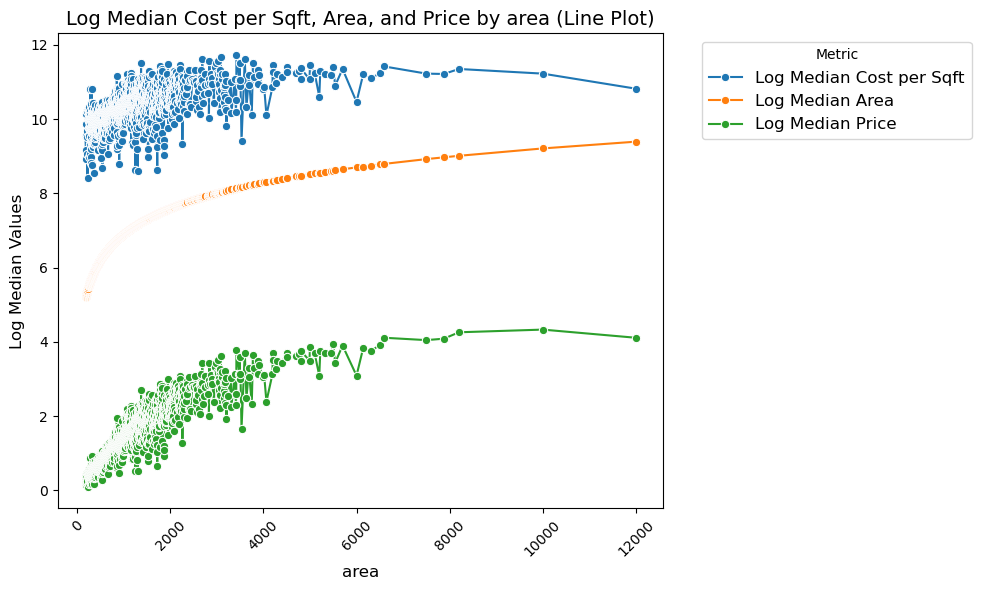

In [93]:
median_plot_high_card(df,'area')

`observation`
- The cost per square foot decreases as area increases, while the median area follows an increasing trend.
- The median price initially rises but later declines, suggesting that larger properties may not always command higher overall prices despite their larger size.
- There is significant variability in pricing at smaller areas, which stabilizes as area increases.

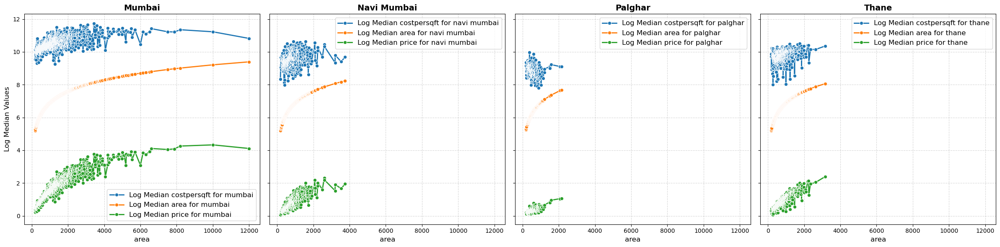

In [94]:
plot_log_median_subplots_high_card(df,'area')

### costpersqft

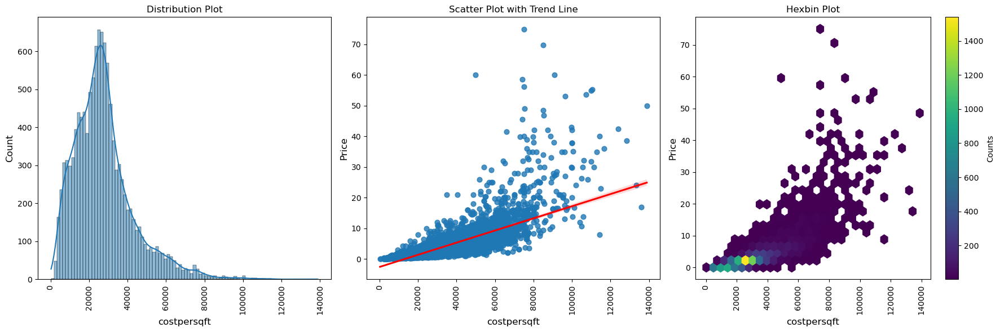

In [95]:
bivariate_plot(df, 'costpersqft')

`observation`
- The dataset is highly skewed, with most properties having a low cost per square foot and only a few high-end properties causing long-tailed distributions.
- Price values vary widely at lower cost per square foot levels, indicating that total price is influenced by more than just cost per square foot—likely factors such as property size, location, and amenities.

In [96]:
num_num_hyp_testing(df, 'price', 'costpersqft')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.7507293348186457
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and costpersqft are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.8765805668696194
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and costpersqft are correlated


`observation`
- Pearson correlation (0.75) → strong positive linear relationship → higher cost per sqft generally means higher total price.
- Spearman correlation (0.88) → very strong positive monotonic relationship → as cost per sqft increases, price tends to increase.
- Higher cost per sqft → strongly linked to higher property price.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


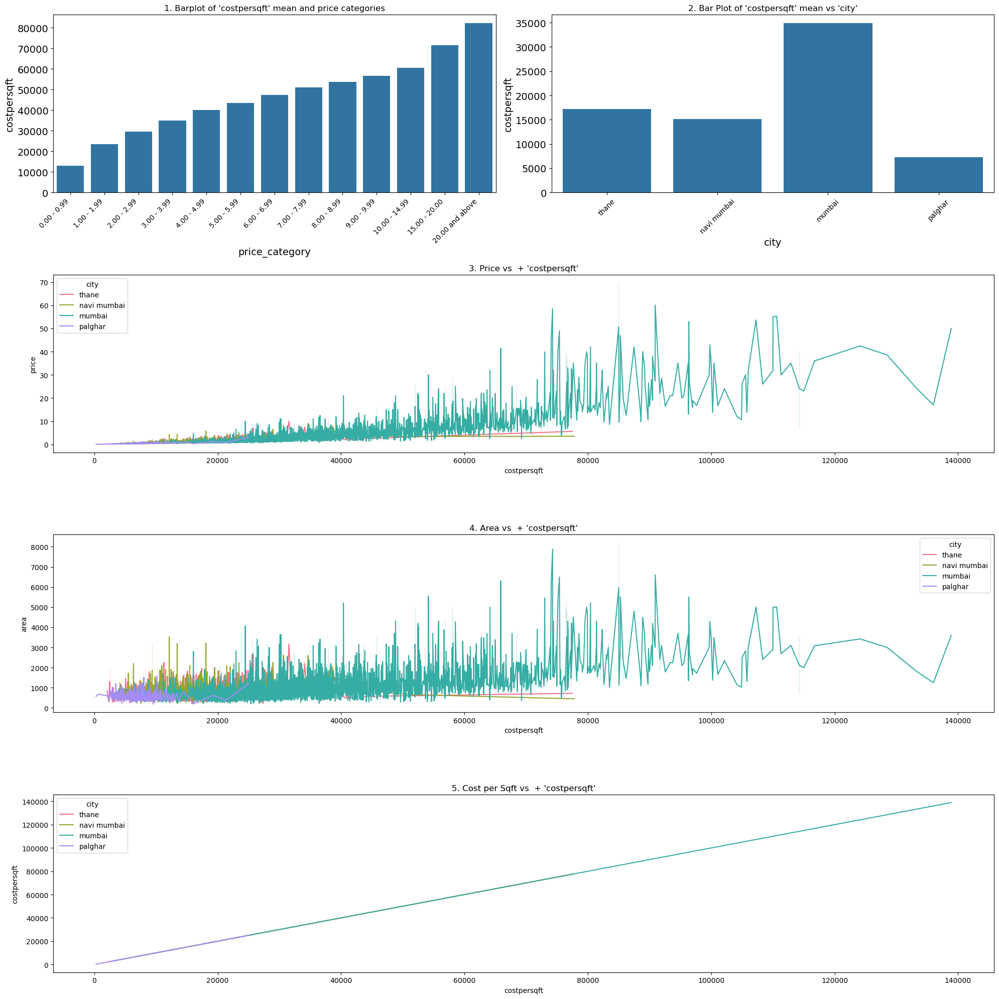

In [97]:
region_plots_high_card(df, 'costpersqft')

`observation`
- The cost per square foot increases as property price categories rise, indicating that premium properties have a higher price density. 
- Mumbai has the highest cost per square foot, followed by Thane and Navi Mumbai, while Palghar is the most affordable region, reinforcing the role of location in property valuation.

In [98]:
summarize_properties(df, 'costpersqft').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,289.0,0.017,0.017,1,0,NaN,0,NaN,0,NaN,1,0.017
1,676.0,0.046,0.046,1,0,NaN,0,NaN,0,NaN,1,0.046
2,2118.0,0.180,0.180,1,0,NaN,0,NaN,1,0.18,0,NaN
3,2143.0,0.150,0.150,1,0,NaN,0,NaN,1,0.15,0,NaN
4,2185.0,0.130,0.130,1,0,NaN,0,NaN,0,NaN,1,0.130


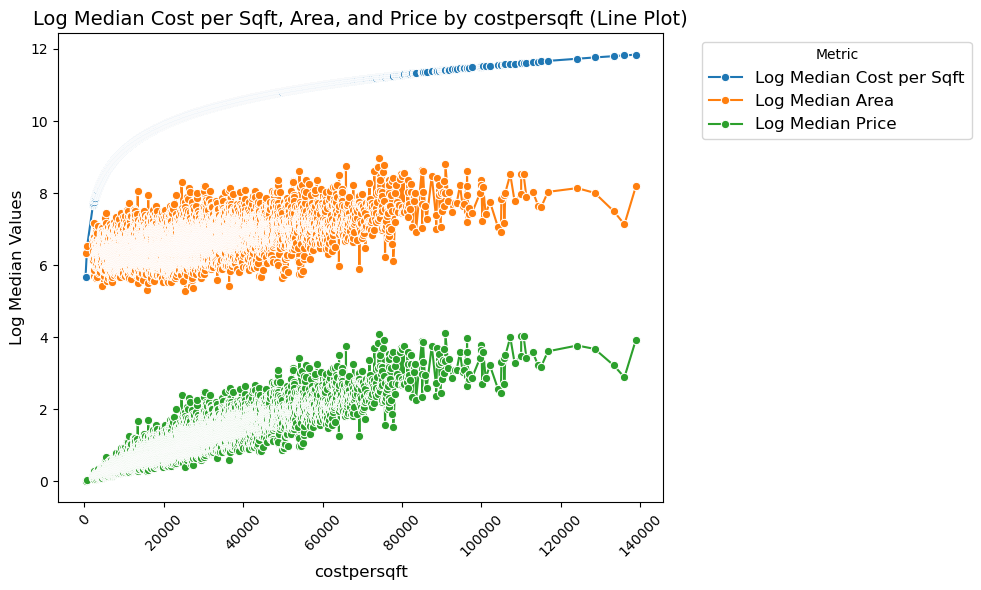

In [99]:
median_plot_high_card(df,'costpersqft')

`observation`
- The log median cost per sqft increases with costpersqft(x-axis), while the log median area decreases significantly.
- The log median price remains relatively stable across different costpersqft values.
- Data is highly skewed, with most values concentrated at lower cost per sqft and a few extreme outliers influencing trends.

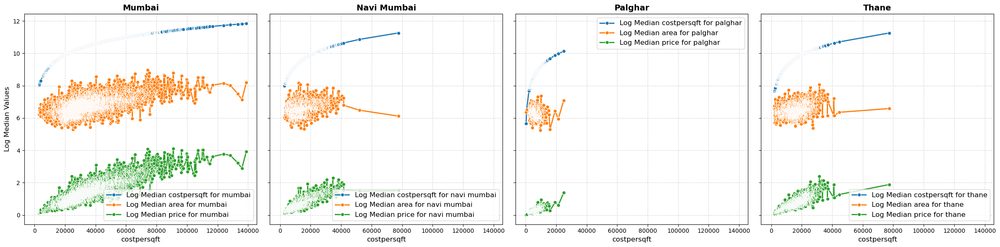

In [100]:
plot_log_median_subplots_high_card(df,'costpersqft')

### lattitude

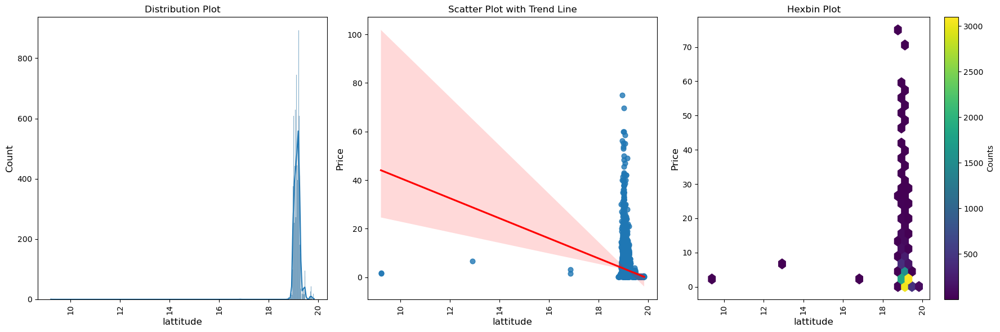

In [101]:
bivariate_plot(df, 'lattitude')

`observation`
- Most data points are concentrated around 20° latitude, with very few beyond 30°.
- Prices vary widely at 20° latitude, while other latitudes have sparse data.
- Outliers exist at extreme latitudes (<10° and >70°), possibly indicating rare locations.

In [102]:
num_num_hyp_testing(df, 'price', 'lattitude')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : -0.18535308972528045
- p-value              : 1.1950726746861108e-88
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and lattitude are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : -0.35905203607728
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and lattitude are correlated


`observation`
- Pearson correlation (–0.19) → weak negative linear relationship → price slightly decreases as latitude increases (moves north).
- Spearman correlation (–0.36) → moderate negative monotonic relationship → higher latitude generally linked to lower price.
- Higher latitude → tends to have slightly lower property prices.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


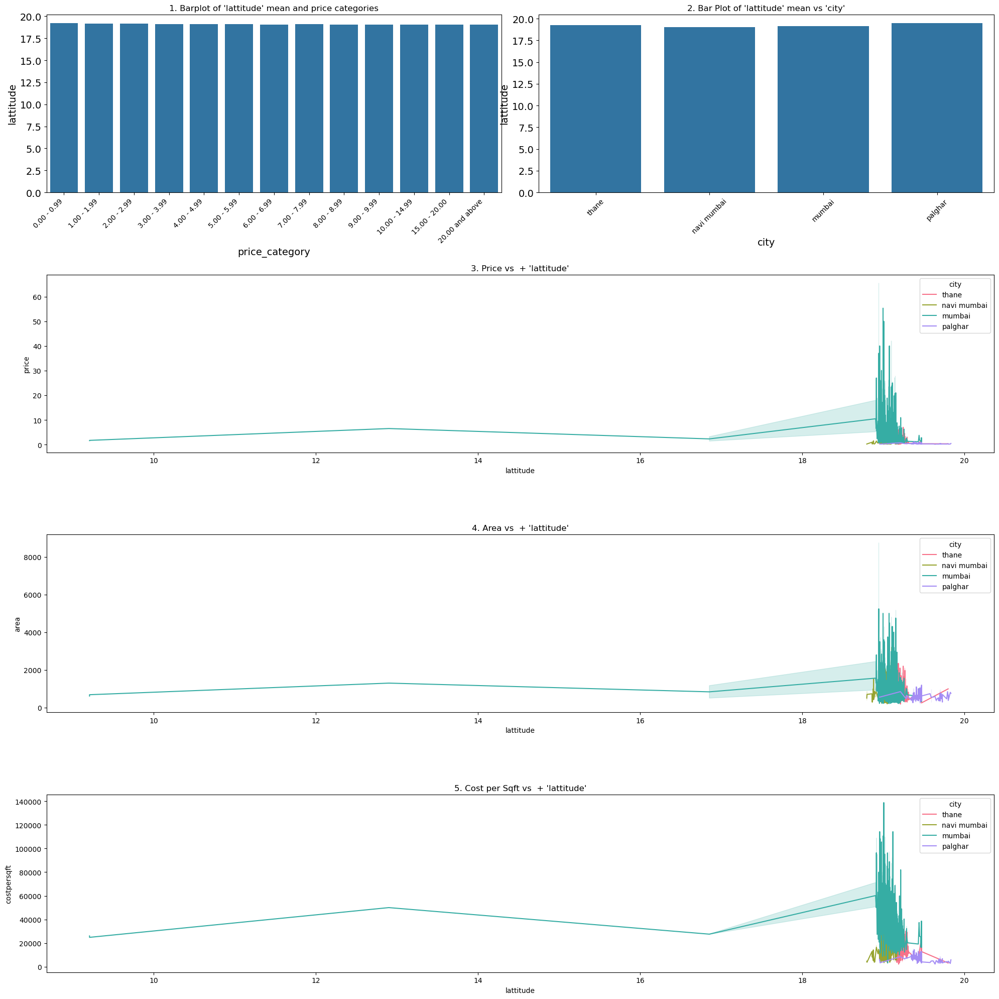

In [103]:
region_plots_high_card(df, 'lattitude')

In [104]:
summarize_properties(df, 'lattitude').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,9.209138,1.600,1.600,1,1,1.6,0,NaN,0,NaN,0,NaN
1,9.209138,1.700,1.700,1,1,1.7,0,NaN,0,NaN,0,NaN
2,12.900399,6.500,6.500,1,1,6.5,0,NaN,0,NaN,0,NaN
3,16.853296,2.300,2.300,2,2,2.3,0,NaN,0,NaN,0,NaN
4,18.795002,0.215,0.215,2,0,NaN,2,0.215,0,NaN,0,NaN


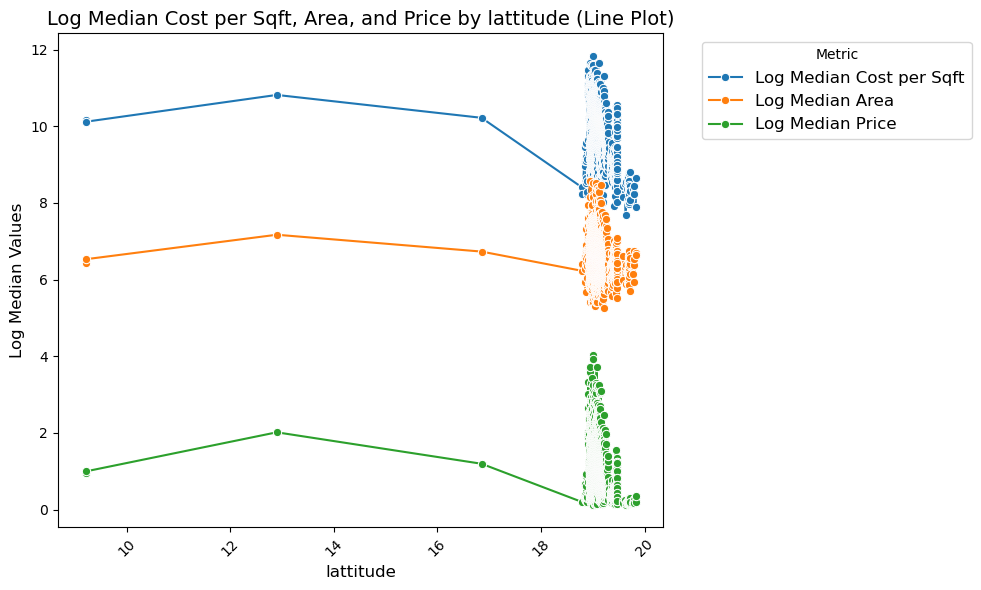

In [105]:
median_plot_high_card(df,'lattitude')

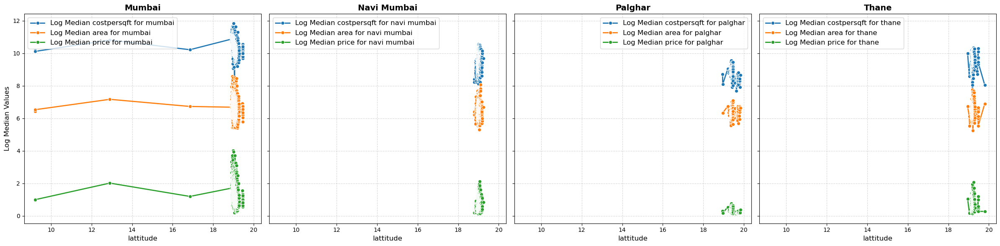

In [106]:
plot_log_median_subplots_high_card(df,'lattitude')

### longitude

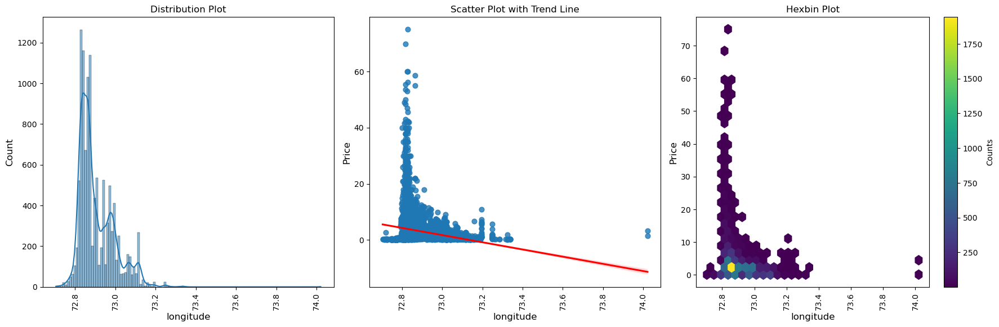

In [107]:
bivariate_plot(df, 'longitude')

`observation`
- Longitude data is heavily skewed and concentrated around ~70°.
- Only a few data points exist outside this range.
- Price variation is significant in the main longitude range (~70°).

In [108]:
num_num_hyp_testing(df, 'price', 'longitude')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : -0.2662107780446271
- p-value              : 3.315288045527759e-184
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and longitude are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : -0.34911831174265073
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and longitude are correlated


`observation`
- Pearson correlation (–0.27) → weak negative linear relationship → price tends to decrease as longitude increases (moves east).
- Spearman correlation (–0.35) → moderate negative monotonic relationship → higher longitude generally linked to lower price.
- Higher longitude → tends to have slightly lower property prices.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


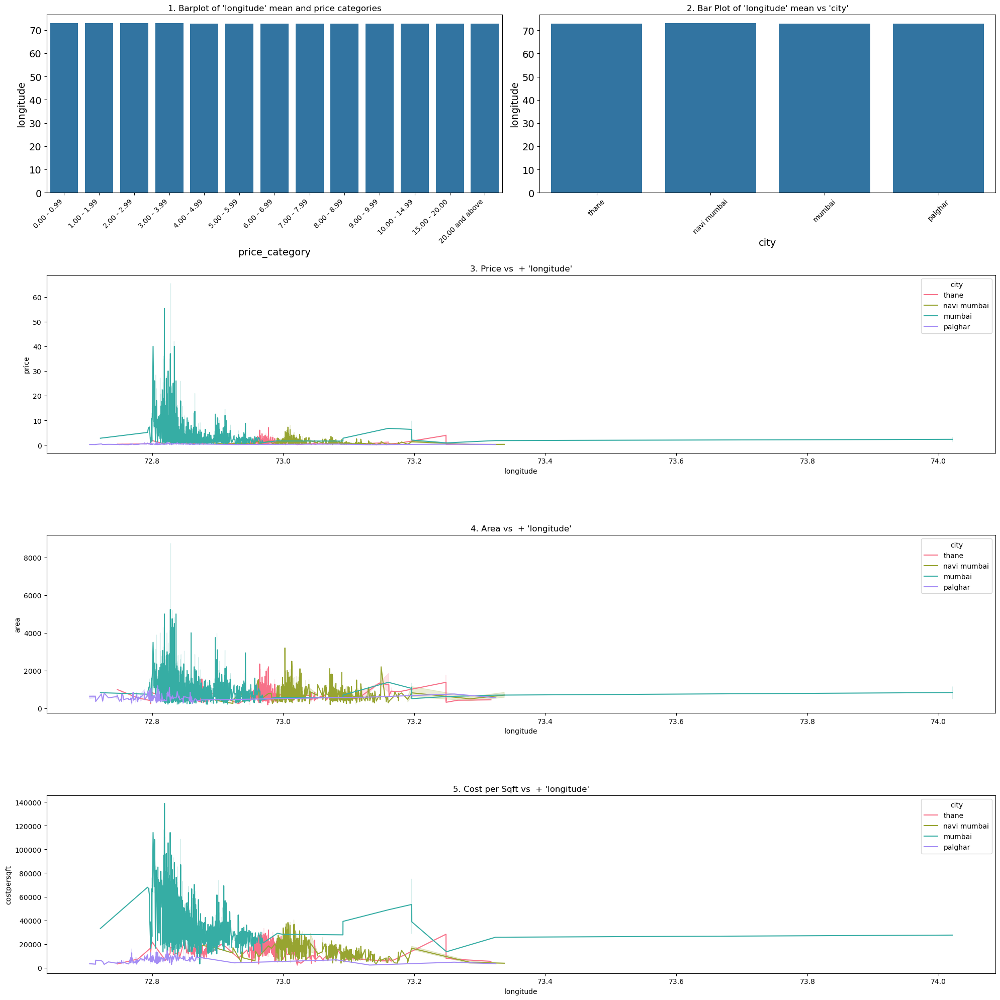

In [109]:
region_plots_high_card(df, 'longitude')

In [110]:
summarize_properties(df, 'longitude').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,72.704548,0.20,0.20,2,0,NaN,0,NaN,0,NaN,2,0.20
1,72.713629,0.18,0.18,2,0,NaN,0,NaN,0,NaN,2,0.18
2,72.713631,0.27,0.27,1,0,NaN,0,NaN,0,NaN,1,0.27
3,72.713760,0.23,0.23,1,0,NaN,0,NaN,0,NaN,1,0.23
4,72.720961,2.75,2.75,1,1,2.75,0,NaN,0,NaN,0,NaN


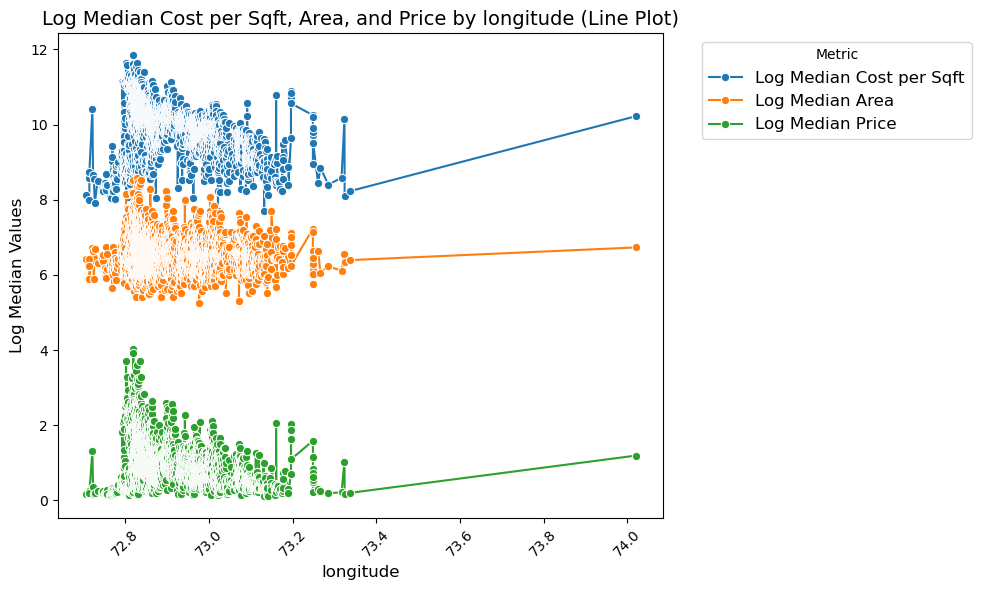

In [111]:
median_plot_high_card(df,'longitude')

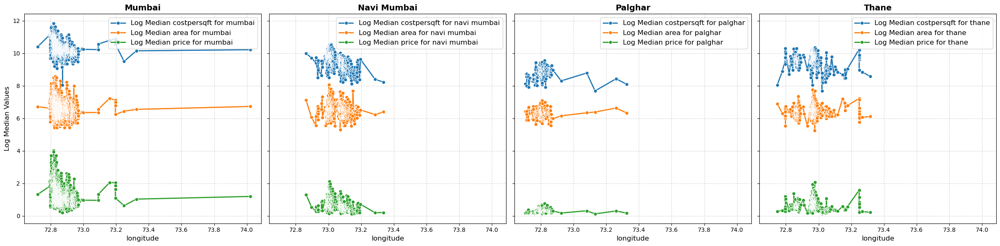

In [112]:
plot_log_median_subplots_high_card(df,'longitude')

### emi

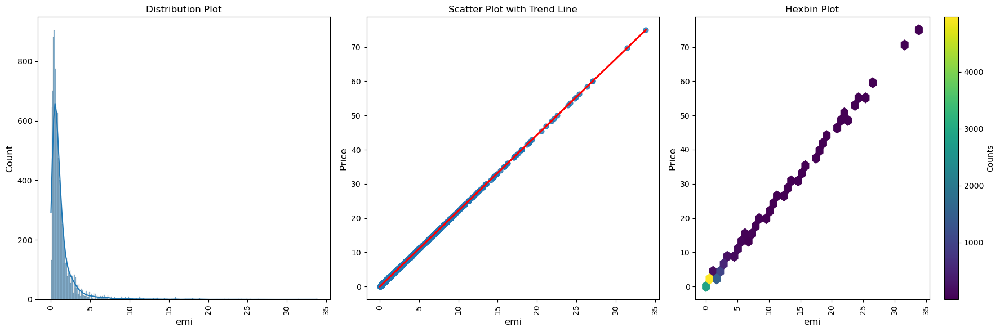

In [113]:
bivariate_plot(df, 'emi')

`observation`
- emi distribution is skewed, meaning most values are small.
- Price and emi have a strong linear relationship.
- emi is in lakhs

In [114]:
num_num_hyp_testing(df, 'price', 'emi')

Pearson Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.9999987851434373
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and emi are correlated
----------------------------------------------------------------------------------------------------
Spearman Test
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 0.9999839932224156
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables price and emi are correlated


`observation`
- Pearson correlation (0.9999) → nearly perfect positive linear relationship → higher price directly means higher EMI. 
- Spearman correlation (0.9999) → nearly perfect positive monotonic relationship → as price increases, EMI almost perfectly increases too.
- EMI and price are almost perfectly correlated — higher price → higher EMI.

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2357801042.py:64: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


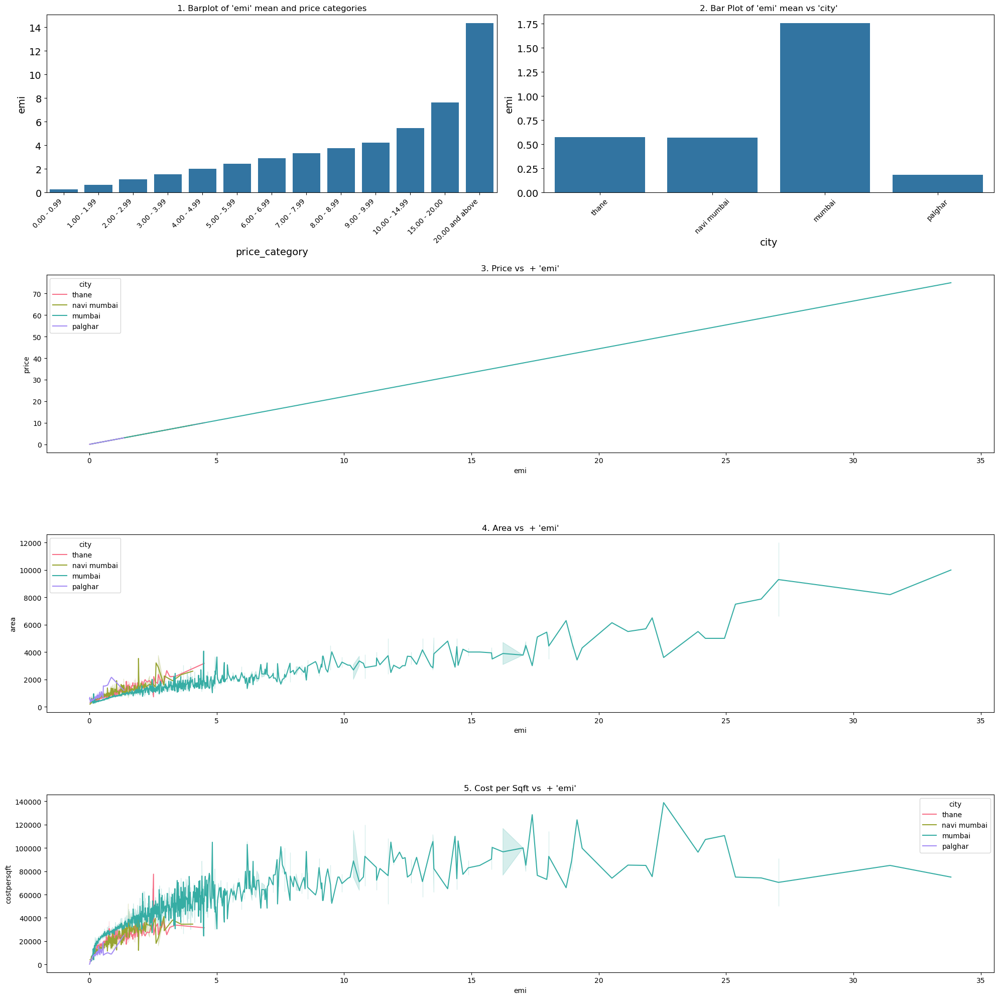

In [115]:
region_plots_high_card(df, 'emi')

`observation`
- Higher price categories lead to higher emi.
- Mumbai has the highest emi, while Palghar has the lowest.
- Linear relation between emi and price, meaning emi is likely derived directly from price.
- Higher EMI is associated with larger areas, especially in Mumbai.
- Cost per sqft is volatile at low EMI values, but stabilizes at higher EMI.
- Mumbai dominates higher EMI ranges, indicating premium properties with larger spaces.

In [116]:
summarize_properties(df, 'emi').head()

,feature_value,price_mean,price_median,count,mumbai,mumbai_median_price,navi mumbai,navi mumbai_median_price,thane,thane_median_price,palghar,palghar_median_price
0,0.00745,0.017000,0.0170,1,0,NaN,0,NaN,0,NaN,1,0.017
1,0.02000,0.046000,0.0460,1,0,NaN,0,NaN,0,NaN,1,0.046
2,0.03000,0.072500,0.0725,2,0,NaN,1,0.075,1,0.0700,0,NaN
3,0.04000,0.088333,0.0850,3,0,NaN,0,NaN,1,0.0850,2,0.090
4,0.05000,0.113077,0.1200,13,0,NaN,2,0.120,4,0.1025,7,0.120


`observation`
- make categories 

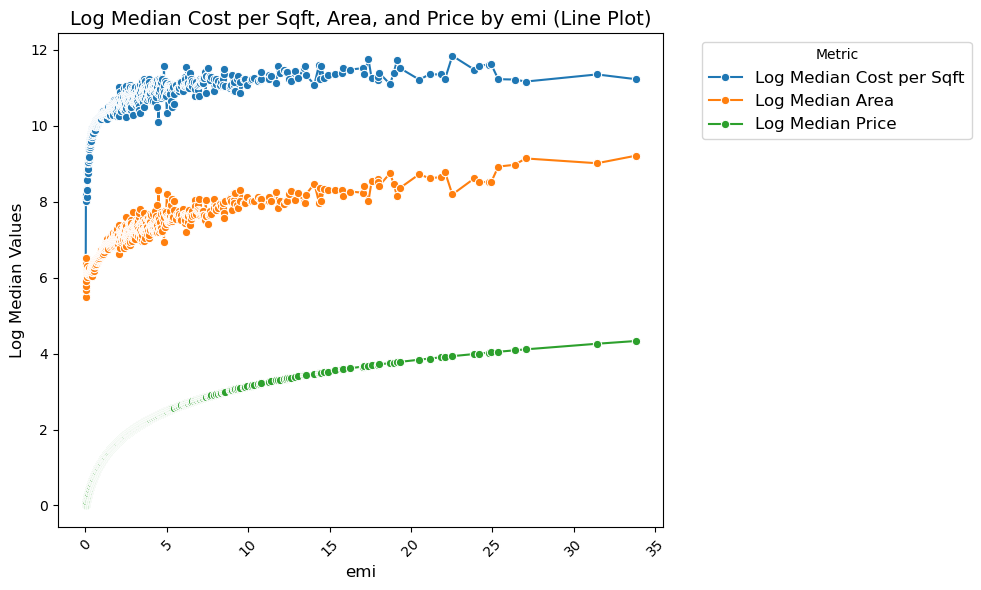

In [117]:
median_plot_high_card(df,'emi')

`observation`
- Higher emi is linked with higher cost per sqft, larger area, and higher property prices.
- Cost per sqft stabilizes early, while area and price increase steadily.
- Some fluctuations in cost per sqft and area suggest variations in premium properties.

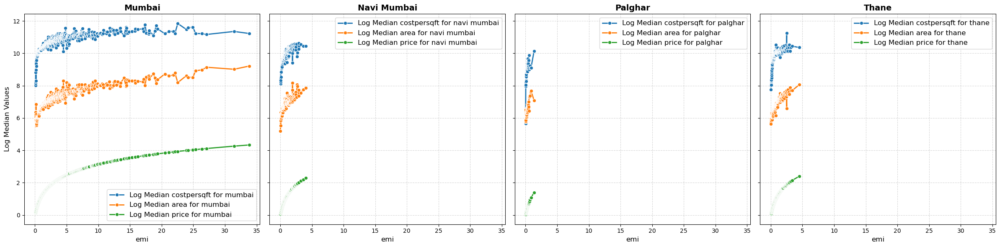

In [118]:
plot_log_median_subplots_high_card(df,'emi')

### project_in_acres

C:\Users\ABC\AppData\Local\Temp\ipykernel_14692\2165957660.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a1.set_xticklabels(a1.get_xticklabels(), rotation=90)


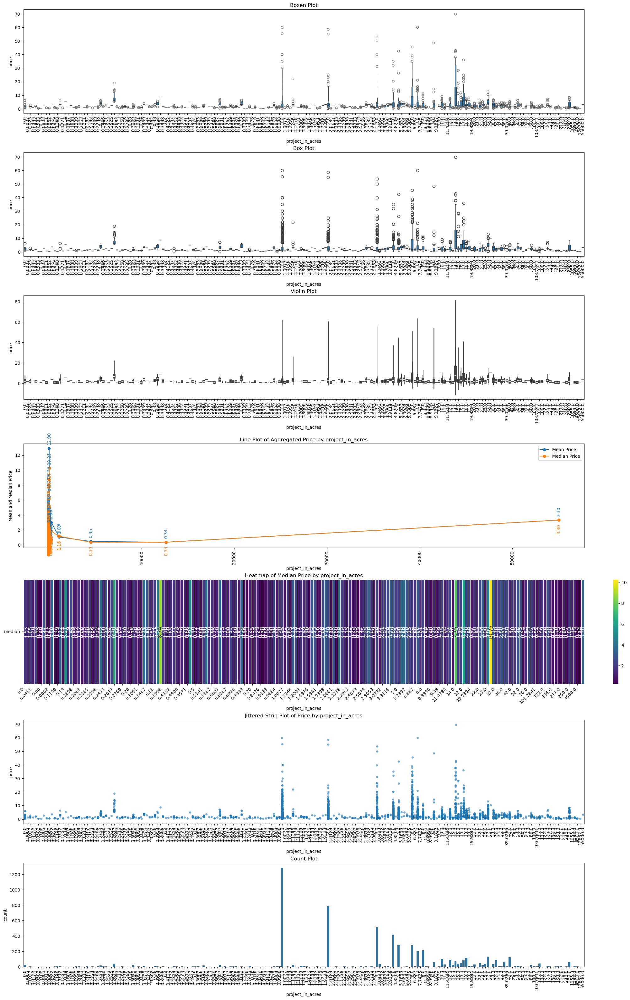

In [119]:
num_charts_plot(df, 'project_in_acres')

`observation`
- Price variation is higher in larger projects, with multiple extreme outliers.
- Certain projects (e.g., 11.17 acres, 19.3 acres) show significant price dispersion, suggesting diverse property types within the same acreage.
- outliers in data
- A few specific project sizes show significantly high median prices, as highlighted in the heatmap.
- Most prices are concentrated at lower values, with some extreme outliers.
- Certain project sizes show price spikes and frequent transactions.
- Project sizes are not evenly distributed; some occur significantly more often.

In [ ]:
bivariate_plot(df, 'project_in_acres')

`observation`
- Most projects are small, with a few large-acreage outliers.
- Prices are concentrated in low-acreage projects, with larger ones being rare and priced lower.
- Severe right-skewness in acreage distribution.

In [ ]:
num_num_hyp_testing(df, 'price', 'project_in_acres')

`observation`
- Pearson correlation (–0.007) → near zero linear relationship → no significant linear link between project size and price (p-value > 0.05).
- Spearman correlation (+0.04) → very weak positive monotonic relationship → slight tendency for price to increase with larger project size (p-value < 0.05).
- Project size in acres has no meaningful correlation with price.

In [ ]:
region_plots_high_card(df, 'project_in_acres')

`observation`
- 3.00-3.99 price category has the highest mean acreage.
- Navi Mumbai projects have the largest mean acreage; Palghar has the smallest.
- Price remains flat despite increasing acreage, with most data concentrated at small-acreage values.

In [ ]:
#make 0.0000 and 0.0002 acres as np.nan 
df['project_in_acres'] = df['project_in_acres'].replace([0.0000, 0.0002], np.nan)

In [ ]:
summarize_properties(df, 'project_in_acres').head()

`observation`
- make categories

In [ ]:
median_plot_high_card(df,'project_in_acres')

`observation`
- Smaller projects have higher cost per square foot but lower total price, while larger projects show a decreasing trend initially before increasing steadily.

In [ ]:
plot_log_median_subplots_high_card(df,'project_in_acres')

### distance columns 

In [ ]:

# Basic summary
distance_cols = [
    'education_mean_km', 'education_min_km', 'education_within_2km',
    'transport_mean_km', 'transport_min_km', 'transport_within_2km',
    'shopping_centre_mean_km', 'shopping_centre_min_km', 'shopping_centre_within_2km',
    'commercial_hub_mean_km', 'commercial_hub_min_km', 'commercial_hub_within_2km',
    'hospital_mean_km', 'hospital_min_km', 'hospital_within_2km',
    'tourist_mean_km', 'tourist_min_km', 'tourist_within_2km',
    'overall_min_mean_km', 'overall_avg_mean_km',
    'overall_min_min_km', 'overall_avg_min_km', 'total_within_2km'
]

In [ ]:
km_cols = [col for col in distance_cols if 'mean_km' in col or 'min_km' in col or 'overall' in col]

# 1. Correlation matrix (only for numerical distances)
corr_df = df[['price'] + km_cols].corr(method='spearman')
print("\n--- Spearman Correlation with Price ---")
print(corr_df['price'].sort_values(ascending=False))

`observation`

- Negative correlation → Closer → Higher price
→ So properties closer to education, shopping centre, commercial hub, hospital tend to have higher prices.
- Positive correlation → Farther → Higher price
→ So properties farther from tourist spots and transport tend to have higher prices.

In [ ]:
# How many plots side by side?
plots_per_page = 3

# Loop through km_cols in batches of 3
for i in range(0, len(km_cols), plots_per_page):
    selected_cols = km_cols[i:i+plots_per_page]

    fig, axes = plt.subplots(1, plots_per_page, figsize=(6 * plots_per_page, 5))

    # If only 1 or 2 plots in last batch, axes might not be iterable
    if plots_per_page == 1:
        axes = [axes]
    elif len(selected_cols) < plots_per_page:
        axes = axes[:len(selected_cols)]

    for ax, col in zip(axes, selected_cols):
        sns.regplot(
            data=df,
            x=col,
            y='price',
            scatter_kws={'alpha': 0.5},
            line_kws={'color': 'red'},
            lowess=True,
            ax=ax
        )
        ax.set_title(f"{col} vs. Price")

    plt.tight_layout()
    plt.show()


`observation`
- Mostly negative trend → Closer to amenities → Higher price → Properties near education, transport, shopping centres, commercial hubs, hospitals tend to have higher prices.
- Some slight positive trend → Farther from tourist spots → Higher price → Indicates buyers may pay more to be farther from busy tourist areas.

In [ ]:
# How many plots per row?
plots_per_page = 3

for i in range(0, len(km_cols), plots_per_page):
    selected_cols = km_cols[i:i+plots_per_page]

    fig, axes = plt.subplots(1, plots_per_page, figsize=(6 * plots_per_page, 5))

    # Handle last batch if fewer than 3
    if plots_per_page == 1:
        axes = [axes]
    elif len(selected_cols) < plots_per_page:
        axes = axes[:len(selected_cols)]

    for ax, col in zip(axes, selected_cols):
        # Create bins without modifying df
        bins = pd.cut(df[col], bins=5)
    
        temp = pd.DataFrame({
            'bin': bins,
            'price': df['price']
        })
    
        sns.boxplot(data=temp, x='bin', y='price', ax=ax)
        ax.tick_params(axis='x', rotation=45)
        ax.set_title(f"Price Distribution across Binned {col}")


    plt.tight_layout()
    plt.show()


`observation`
- Price spread decreases with distance: In most boxplots, the price range (IQR and outliers) narrows as distance increases — meaning properties far from key amenities not only tend to be cheaper but also have less price variability.
- Closer bins have more high-priced outliers: The lowest-distance bins often show more extreme high-value outliers, highlighting that premium properties cluster near key amenities.
- Tourist spots are an exception: Bins for tourist distances sometimes show stable or slightly increasing prices, with more spread in distant bins, suggesting niche demand for remote/tourist areas.

In [ ]:
# Pick your within_2km flags

flag_cols = [col for col in distance_cols if 'within_2km' in col]

plots_per_page = 3

for i in range(0, len(flag_cols), plots_per_page):
    selected_cols = flag_cols[i:i+plots_per_page]

    fig, axes = plt.subplots(1, plots_per_page, figsize=(6 * plots_per_page, 5))

    # Handle last batch
    if plots_per_page == 1:
        axes = [axes]
    elif len(selected_cols) < plots_per_page:
        axes = axes[:len(selected_cols)]

    for ax, col in zip(axes, selected_cols):
        sns.boxplot(data=df, x=col, y='price', ax=ax)
        ax.set_title(f"Price by {col} (0=No, 1=Yes)")

    plt.tight_layout()
    plt.show()

`Observation`

- For **education**, each property (i.e., each row) has its own distances to nearby education centers (schools/colleges). For example, `[1.0, 3.0, 1.9, 4.8]` means there are 4 education centers within different distances from that property.
- We count how many are **within 2 km** for each property — e.g., `[1.0, 3.0, 1.9, 4.8]` → 2 are within 2 km.
- In the plot:

  - `1` means the property has **one** education center within 2 km.
  - `5` means the property has **five** education centers within 2 km.
- The graph shows that:

  - Properties with **1 education center nearby** can have prices above **70 crore**.
  - Properties with **5 education centers nearby** can have prices up to **20 crore**.
- from total_within_2km graph less than 10 imp locations within 2km having property prices more than 30cr and more than 10 imp locations have property prices less than 30cr
- The total count shows that having multiple amenities nearby supports higher prices, but there is a diminishing effect(adding more amenities doesn’t increase the price as much as the first few did) when too many accumulate.

In [ ]:
# For each binary flag column: group by 0 & 1 → calculate mean price for each → print mean when flag is 0 (means property doesn’t have amenity) and 1 (means property has amenity).
print("\n--- Mean Price Comparison by Binary Distance Flags ---")
for col in flag_cols:
    means = df.groupby(col)['price'].mean()
    print(f"{col} -> 0: {means.get(0, 'NA'):.2f}, 1: {means.get(1, 'NA'):.2f}")

`observation`

- Positive impact:
  - Education, commercial hub, hospital within 2 km → Higher mean price
  - So properties **closer to these** tend to be priced higher.
- Negative or less impact:**
  - Transport, tourist spots within 2 km → Lower mean price
  - So being very close to transport or tourist spots might **not add value**, possibly even lowers it.
- Diminishing effect:
  - Total\_within\_2km: More amenities within 2 km → mean price drops → **too many nearby amenities doesn’t keep increasing price**, benefit plateaus.

# Multivariate analysis on Categorical columns

In [231]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)
print("-" * 100)
print(f'Total categorical columns: {len(categorical_columns)}')

Index(['id', 'builder', 'project_name', 'location', 'city', 'property_type',
       'status', 'construction', 'ownership', 'furnish', 'overlooking',
       'facing', 'flooring', 'extra_rooms', 'price_category', 'seller'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Total categorical columns: 16


### city

In [ ]:
num_charts_plot(df, 'city')

`observation`
- Mumbai has the widest price distribution with extreme outliers, while Thane, Navi Mumbai, and Palghar have lower and more concentrated price ranges. Extreme values in Mumbai create a long tail.
- Mumbai has the highest price variability with extreme outliers, while Thane, Navi Mumbai, and Palghar have lower, more concentrated price ranges. The mean price in Mumbai is significantly higher than the median, indicating skewness due to outliers. Palghar has the lowest prices, with minimal variation.
- imabalnced data in city feature

In [ ]:
bivariate_plot(df, 'city')

In [ ]:
region_plots_for_categorical_features(df, 'city')

`observation`
- Mumbai has the highest price and cost per sqft, driven by large property sizes and higher demand.  -  Thane and Navi Mumbai have moderate prices with significant variations in cost per sqft.  - . Palghar has the lowest prices and cost per sqft, reflecting its affordabilit
- Mumbai has the highest number of listings, followed by Thane and Navi Mumbai, while Palghar has the least.
- Mumbai dominates across all price categories, especially in higher price ranges.
- The median price increases consistently across price categories, with Mumbai leading in the highest segments.y.

In [ ]:
summarize_properties(df, 'city')

`observation`
- Mumbai – Highest prices (mean: 3.55, median: 2.21) and most listings (8519), indicating high demand.
- Palghar – Lowest prices (mean: 0.28, median: 0.23) and fewest listings (161), indicating affordability.

`solution`
- feature encoding

In [ ]:
median_plot(df,'city')

`observation`
- Mumbai – Highest cost per sqft (10.28) and price (1.17), showing premium pricing.
- Navi Mumbai & Thane – Moderate cost per sqft (~9.55 & 9.82) with larger median areas (~6.55 & 6.48).
- Palghar – Lowest cost per sqft (8.42) and price (0.21), making it the most affordable region.
- Trend – Price follows cost per sqft, while area remains relatively stable.

In [ ]:
num_cat_hyp_testing(df, 'price','city', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `city` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `city` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (city).
- The variation in price depends on or changes with different city categories.
- This indicates that city may be an important factor or predictor for price.

### property_type
`from here i make my own observations`

In [ ]:
num_charts_plot(df, 'property_type')

`observation`
- Both new and resale properties have similar price distributions with significant high-price outliers.
- Most properties are in the lower price range, with a few expensive listings.
- New properties have higher prices than resale properties.

In [ ]:
bivariate_plot(df, 'property_type')

`observation`
- The distribution plot shows a higher count of resale properties than new properties.

In [ ]:
region_plots_for_categorical_features(df, 'property_type')

`observation`
- Mumbai has the highest price, area, and cost per sqft.
- Navi Mumbai has a higher area than Thane, but its price is lower than Thane.
- Palghar has the lowest price and area compared to all other regions.
- Cost per sqft for both new and resale properties follows the same trend: Mumbai > Thane > Navi Mumbai > Palghar.
- Mumbai, Navi Mumbai, and Thane have higher prices for new properties than resale.
- Palghar resale property price is slightly higher than new property.
- Navi Mumbai's area is higher than Thane, which is the opposite trend compared to price.
- Area variance is higher for resale properties.
- Palghar’s price remains almost unchanged, while resale property area is higher than new property.
- Expensiveness for cost per sqft plot is like: Mumbai > Thane > Navi Mumbai > Palghar
- Mumbai has more properties for both resale and new properties, while Palghar has the lowest.
- Resale property prices are higher than new property prices up to 15 Cr properties.
- Both new properties and resale properties follow an increasing trend in price categories.
- both new and resale properties is right-skewed, with most properties concentrated at lower price ranges.
- Resale properties have a slightly higher density at lower prices compared to new properties.

In [ ]:
summarize_properties(df, 'property_type')

`observation`
Resale properties are cheaper than new ones in all regions except Palghar.

`solution`
feature encoding 

In [ ]:
median_plot(df,'property_type')

`observation`
- log median values for cost per sqft, area, and price are all lower for resale properties compared to new properties.

In [ ]:
plot_log_median_subplots(df,'property_type')

`observation`
- Mumbai has almost no variation between new and resale properties, while Navi Mumbai, Palghar, and Thane show some variation in log median cost per sqft, area, and price.

In [ ]:
num_cat_hyp_testing(df, 'price','property_type', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `property_type` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `property_type` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (property_type).
- The variation in price depends on or changes with different property_type categories.
- This indicates that property_type may be an important factor or predictor for price.

### status

In [ ]:
num_charts_plot(df, 'status')

`observation`
- except ongoing under construction and ready to move properties have outliers and ongoing properties have very less data also compare to under construction and ready to move
- Prices are highly skewed, with most values concentrated at the lower end.
- Expensivness for status feature is like : under construction > ready to move > ongoing

In [ ]:
bivariate_plot(df, 'status')

In [ ]:
region_plots_for_categorical_features(df, 'status')

`observation`
- Mumbai has the highest price, area, and cost per/' sqft.
- Navi Mumbai has a larger area than Thane, but its price is lower than Thane.
- Palghar has the lowest price and area among all regions, and no properties in the ongoing category.
- Cost per sqft trend (for under construction & ready to move properties) : Mumbai > Thane > Navi Mumbai > Palghar.
- price and area treand is same for mumbai region
- price trend for thane region as : under construction > ready to move whereas it is different for area region 
- Navi Mumbai's area is higher than Thane, which is the opposite trend compared to price.
- palghar price also in no change trend but thea rea is increase from under construction and ready to move
- mumbai has highest count properties for all other region except palghr
- for lower range have suffient no of properties 

In [ ]:
summarize_properties(df, 'status')

`observation`
- Ongoing properties are very few compared to other categories.
- Under construction properties have the highest mean price (3.19).
- Ready-to-move properties have a lower mean price (2.73) than under-construction properties.
- Mumbai has the most properties (5018 for ready-to-move, 3435 for under construction).
- Palghar has the lowest median price, while Mumbai has the highest.
- Thane and Navi Mumbai's median prices are lower than Mumbai's but higher than Palghar's.

`solution`
feature encoding 

In [ ]:
median_plot(df,'status')

`observation`
- Price & Area ↑ (ongoing → ready to move → under construction)
- Cost per sqft ↓ (ongoing → ready to move → under construction)
- Under construction: Highest price & area, lower cost per sqft
- Ongoing: Highest cost per sqft, lowest price & area

In [ ]:
plot_log_median_subplots(df,'status')

`observation`
- Navi Mumbai & Thane: Cost per sqft, Price & Area ↑ (ready to move → under construction)
- Mumbai: Price & Area ↑ and Cost per sqft ↓ (ongoing → ready to move → under construction)
- Palghar: Cost per sqft ↑, Price & Area ↓ (ready to move → under construction)

In [ ]:
num_cat_hyp_testing(df, 'price','status', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `status` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `status` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (status).
- The variation in price depends on or changes with different status categories.
- This indicates that status may be an important factor or predictor for price.

### construction

In [ ]:
# Define custom construction order
construction_order = [
    'under construction', 
    'new construction', 
    'less than 5 years', 
    '5 to 10 years', 
    '10 to 15 years', 
    '15 to 20 years', 
    'above 20 years'
]

# Set the 'construction' column to have the custom order
df['construction'] = pd.Categorical(df['construction'], categories=construction_order, ordered=True)


In [ ]:
num_charts_plot(df, 'construction')

`observation`
- properties below 5 to 10 years have higher price that the other properties
- except under construction properties all other properties count is very less

In [ ]:
bivariate_plot(df, 'construction')

In [ ]:
region_plots_for_categorical_features(df, 'construction')

`observation`
- Mumbai: Highest price, largest area, highest cost per sqft.
- Palghar: Lowest price, smallest area, most affordable.
- Thane & Navi Mumbai: Moderate trends, similar patterns.
- Anomaly: Spike in cost per sqft for Thane (10 to 15 years).
- Mumbai: Dominates under-construction properties.
- Lower price range: Mostly under-construction 
- as per construction ages price_categoriers also increases 

In [ ]:
summarize_properties(df, 'construction')

`observation`
- New construction: Highest price median (2.25).
- Older properties (10+ years): Lower price median (~1.6).
- Mumbai: Dominates new & under-construction.
- Palghar: Lowest median prices across all categories

In [ ]:
median_plot(df,'construction')

`observation`
- Log Median Cost per Sqft remains stable around 10.02 - 10.28.
- Log Median Area fluctuates slightly between 6.46 - 6.65.
- Log Median Price is lowest for older constructions (~0.92) and highest for new constructions (1.18).

`solution`
- encoding will do in feature engineering notebook

In [ ]:
plot_log_median_subplots(df,'construction')

`observation`
- fluctuations in each category (cost per sqft, area, and price) vary at different construction stages across regions
- Mumbai : Cost per sqft shows minor fluctuations, while area and price remain relatively stable.
- Navi mumbai : Cost per sqft increases for "15 to 20 years","above 20 years" and "under construction" stages.
- Palghar: Cost per sqft increases for "above 20 years" and "under construction" stages.
- Thane: Cost per sqft increases for "new construction" and "under construction" stages.

In [ ]:
num_cat_hyp_testing(df, 'price','construction', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `construction` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `construction` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (construction).
- The variation in price depends on or changes with different construction categories.
- This indicates that construction may be an important factor or predictor for price.

### ownership

In [ ]:
num_charts_plot(df, 'ownership')

`observation`
- Freehold properties tend to have the highest price variations and extreme outliers.
- Power of Attorney properties show the most stable pricing.
- Right-skewed distribution for all ownership types (long upper tails).
- Highest spread & outliers in Freehold & Co-operative Society.
- Leasehold has the highest mean (4.05) & median (2.69) prices.
- Power of Attorney has the lowest mean (3.12) & median (1.78) prices.
- Mean price is consistently higher than median → indicates skewness & presence of high-value properties.
- Freehold shows the widest spread & highest outliers (up to 70).
- imbalanced in ownership column

In [ ]:
bivariate_plot(df, 'ownership')

In [ ]:
region_plots_for_categorical_features(df, 'ownership')

`observation`
- Mumbai: Highest price, area, and cost/sqft (leasehold peaks).
- Palghar: Lowest across all metrics, stable trend.
- Thane: Price and area decline with ownership change.
- Navi Mumbai: Moderate, cost/sqft increases for leasehold & power of attorney.
- Mumbai: Dominates freehold and co-operative society ownership.
- Thane & Navi Mumbai: More balanced distribution across ownership types.
- Price Category: Lower categories have more freehold properties, higher categories show a mix.
- Median Price: Increases with price category, all ownership types follow a similar trend.

In [ ]:
summarize_properties(df, 'ownership')

`observation`
- Mumbai dominates in all ownership types, with the highest counts and median prices.
- Palghar has the least data, with many missing median prices.

`solution`
- feature encoding 

In [ ]:
median_plot(df,'ownership')

`observation`
- Leasehold has the highest Log Median Cost per Sqft (10.32), Area (6.80), and Price (1.31).
- Power of Attorney has the lowest Log Median Area (6.36) and Price (0.98).
- Co-operative Society has the lowest Log Median Cost per Sqft (10.13).

In [ ]:
plot_log_median_subplots(df,'ownership')

`observation`
- Mumbai: Leasehold has the highest log median cost per sqft (10.50), area (6.86), and price (1.49).
- Navi Mumbai: Leasehold has the highest log median cost per sqft (9.92) and area (6.63), while power of attorney has the highest price (0.83).
- Palghar: Freehold has the highest log median cost per sqft (8.42) and area (6.21), while co-operative society has the highest price (0.28).
- Thane: Freehold has the highest log median cost per sqft (9.87) and area (6.52), while co-operative society has the highest price (0.75).

In [ ]:
num_cat_hyp_testing(df, 'price','ownership', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `ownership` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `ownership` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (ownership).
- The variation in price depends on or changes with different ownership categories.
- This indicates that ownership may be an important factor or predictor for price.

### furnish

In [ ]:
num_charts_plot(df, 'furnish')

`observation`
- Price Distribution: Prices are highly skewed, with most values concentrated at the lower end.
- Outliers: Significant number of outliers in all furnishing categories, especially at the higher price range.
- Comparison Across Categories: The price distribution is similar across unfurnished, semi-furnished, and furnished categories.
- Mean & Median Trend: Prices decrease from furnished → semi-furnished → unfurnished.
- Skewed Distribution: Mean price is higher than median, indicating high-priced outliers.
- Heatmap Insight: Furnished properties have the highest median price (2.05), while unfurnished ones have the lowest (1.73).
- Conclusion: Furnished properties are generally more expensive.
- imbalanced in the furnish column es

In [ ]:
bivariate_plot(df, 'furnish')

In [ ]:
region_plots_for_categorical_features(df, 'furnish')

`observation`
- Mumbai has the highest prices & area, while Palghar is the most affordable.
- Furnished properties cost more across all regions.
- Thane shows a sharp increase in cost per sqft for furnished properties.
- Area trends vary, with some regions showing fluctuations in semi-furnished properties.
- Overall, furnishing increases price but affects cost per sqft differently across regions.
- Most properties in Mumbai are unfurnished, while semi-furnished and furnished are less common.
- Median price increases consistently across price categories, with furnished properties dominating higher price ranges.

In [ ]:
summarize_properties(df, 'furnish')

`observation`
- Furnished: Highest prices (₹3.23 Cr mean, ₹2.05 Cr median).
- Semi-furnished: Slightly high mean (₹3.23 Cr) but lower median (₹1.80 Cr).
- Unfurnished: Most common, lowest prices (₹2.72 Cr mean, ₹1.73 Cr median).
- Mumbai: Highest prices; Palghar: Lowest across all types.

`solution`
feature encoding

In [ ]:
median_plot(df,'furnish')

`observation`


In [ ]:
plot_log_median_subplots(df,'furnish')

In [ ]:
num_cat_hyp_testing(df, 'price','furnish', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `furnish` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `furnish` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (furnish).
- The variation in price depends on or changes with different furnish categories.
- This indicates that furnish may be an important factor or predictor for price.

### overlooking

In [ ]:
num_charts_plot(df, 'overlooking')

`observation`
- Price Distribution: Prices have a right-skewed distribution with many outliers in all categories.
- Variation Across Categories: Median prices are similar across overlooking types, with slight differences.
- Trend Observation: Categories with "pool" tend to have higher mean and median prices.
- Price values are concentrated at lower levels, with some high-value outliers.
- overlooking column is imbalanced 

In [ ]:
bivariate_plot(df, 'overlooking')

`observation`
- "Main road" has the highest count and "Pool" has the lowest count.
- "Pool" categories generally have lower price ranges compared to others. but is shows highest median compare to others 

In [ ]:
region_plots_for_categorical_features(df, 'overlooking')

`observation`
- Price: Highest in Mumbai, lowest in Palghar. "Garden/park, pool" has higher variation.
- Area: Largest in Mumbai, smallest in Palghar. "Garden/park, pool" has larger areas.
- Cost per Sqft: Highest in Mumbai, lowest in Palghar. "Main road" shows high variation.

In [ ]:
summarize_properties(df, 'overlooking')

`observation`
- Highest Price (Median): "Garden/park, pool" (3.3), "Pool" (3.445)
- Lowest Price (Median): "Garden/park, main road" (1.62)
- Mumbai has the highest prices, while Palghar has the lowest
- Navi Mumbai & Thane have similar price trends, lower than Mumbai

`solution`
encoding will do in model buiding and feature engineering notebook

In [ ]:
median_plot(df,'overlooking')

`observation`
- Overlooking pool tends to have higher price & cost per sqft.
- Main road alone has lower values in all metrics.

In [ ]:
plot_log_median_subplots(df,'overlooking')

`observation`
- Pool views tend to have higher cost per sqft and higher area.
- Main road generally has lower area and price.
- Mumbai has the highest property prices, while Palghar has the lowest.

In [ ]:
num_cat_hyp_testing(df, 'price','overlooking', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `overlooking` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `overlooking` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (overlooking).
- The variation in price depends on or changes with different overlooking categories.
- This indicates that overlooking may be an important factor or predictor for price.

### facing

In [ ]:
num_charts_plot(df, 'facing')

`observation`
- South-West facing has the highest price range.
- East facing has many outliers.
- Most facings have similar median prices but differ in variability.
- Prices generally increase towards South-West, then drop slightly for West.
- South-West facing has the highest median price (2.90), followed by West (2.37).
- East-facing properties are the most common, followed by North-East and West. South-West, South, and South-East have the least number of properties.

In [ ]:
bivariate_plot(df, 'facing')

In [ ]:
region_plots_for_categorical_features(df, 'facing')

`observation`
- Price: Highest in Mumbai, lowest in Palghar.
- Area: South-West in Navi Mumbai has the largest area.
- Cost per sqft: Thane highest for North-East, Mumbai consistently high. Palghar is the cheapest.
- Mumbai: Higher price, less area (especially south-west, north-west).
- Thane, Navi Mumbai, Palghar: More area for the price.
- Navi Mumbai: Peak area for south-west.
- Thane: More area, especially north-west, east.
- Palghar: Most area, lowest price
- Below ₹4 Cr, east-facing is most common, followed by north-east, west, and norh.
- As prices increase, facing property prices also increase
- East-facing properties have the highest density, followed by north-east and north-facing.


In [ ]:
summarize_properties(df, 'facing')

`observation`
- there is difference in price mean and price median for all facing categories 
- lowest median is for south-east and highest median for south-west
- for each region have different max and min median facing properties for each region 
- East-facing and North-East-facing properties are generally in higher demand due to Vastu preferences. However, West-facing properties, especially those with a sea view, are also highly sought after. South-facing properties are usually less preferred.

`solution`  
feature encoding

In [ ]:
median_plot(df,'facing')

`observation`
- along with west , south west facing properties alao have higher demand but we have very less count for that region

In [ ]:
plot_log_median_subplots(df,'facing')

`observation`
- in mumbai south-west properties costpersqft is high
- in navi mumbai south properties costpersqft is high
- in palghar north-west properties costpersqft is high
- and in thane north-west properties costpersqft is high 

In [ ]:
num_cat_hyp_testing(df, 'price','facing', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `facing` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `facing` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (facing).
- The variation in price depends on or changes with different facing categories.
- This indicates that facing may be an important factor or predictor for price.

### flooring 
will do feature enginnering for this feature directly in property_model_building or in property_feature_engineering

### extra_rooms

In [ ]:
num_charts_plot(df, 'extra_rooms')

`observation`
- Servant rooms have the highest median price.
- Servant + study room combinations also show high prices.
- Properties with no extra rooms have the lowest median price.
- Multiple extra rooms (e.g., puja, servant, store, study) tend to increase the price.
- Store and puja rooms alone have relatively lower median prices.
- Outliers are present across all categories, especially in properties with servant rooms
- No extra rooms have the lowest prices , Puja rooms alone remain low in price, Servant room combinations drive prices higher.
- Store and study room combinations generally have lower prices.
- Jittered strip plot shows higher variance in servant room properties.

In [ ]:
bivariate_plot(df, 'extra_rooms')

In [ ]:
region_plots_for_categorical_features(df, 'extra_rooms')

`observation`
- Extra rooms like "puja, servant, store, study" tend to have higher prices and costs per sqft, especially in Mumbai.
- Price, area, and cost per sqft show fluctuating trends across extra room combinations, with Mumbai generally dominating in value.
- Palghar has consistently lower values across all metrics compared to other regions.
- Most properties fall under "none of these" for extra rooms, followed by "store" and "puja" categories.
- Mumbai dominates in count for properties without extra rooms, while Thane and Navi Mumbai have a more balanced distribution, may be because most number of properties are from mumbai
- Price distribution shows a higher count in lower price categories (0-1.99, 1-1.99), with fewer properties in premium price ranges.
- Median price increases with price categories across all extra room combinations, especially for properties priced above 20.00.
- Properties with multiple extra rooms (puja, servant, store, study) are associated with higher price ranges, while standalone extra rooms (puja, servant, store) are more evenly distributed across price categories.

In [ ]:
summarize_properties(df, 'extra_rooms')

`observation`
- "None of these" and "store" are the most common extra room configurations.
- Higher median prices for properties with more extra rooms (e.g., "puja, servant, study" – 7.02L, "servant, study" – 9.25L).
- Mumbai has the most listings; Palghar has very few.
- Premium configurations: Servant + Study, Puja + Servant + Store + Study.
- More rooms generally mean higher prices.

`solution`
- feature encoding

In [ ]:
median_plot(df,'extra_rooms')

`observation`
-  price increases, the area also increases but the cost per sqft remains relatively stable

In [ ]:
plot_log_median_subplots(df,'extra_rooms')

In [ ]:
num_cat_hyp_testing(df, 'price','extra_rooms', alpha=0.05)

`observation`

ANOVA Test  
- ANOVA test calculates the mean of the `price` column with respect to each category in the `extra_rooms` column.  
- If the difference in means across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population means, which is a good sign of association.

Kruskal-Wallis Test  
- Kruskal-Wallis test calculates the median of the `price` column with respect to each category in the `extra_rooms` column.  
- If the difference in medians across the groups is large, it indicates strong association between the variables.  
- Observation:  
  - Null hypothesis rejected means the groups do not have similar population medians, which is a good sign of association.

what is good sign of association?
- There is a statistical relationship between the numeric variable (price) and the categorical variable (extra_rooms).
- The variation in price depends on or changes with different extra_rooms categories.
- This indicates that extra_rooms may be an important factor or predictor for price.

### price_category

In [ ]:
num_charts_plot(df, 'price_category')

`observation`
- Low price categories (0.00 - 9.99): Stable, low variance.
- High price categories (10.00+): Wider spread, more outliers.
- The mean (32.04) is much higher than the median (28.00), suggesting that a few extreme values are pulling up the mean.
- Other categories have tightly clustered prices, but the last category has widely scattered points.

In [ ]:
bivariate_plot(df, 'price_category')

`observation`
- The Distribution Plot (left) shows a right-skewed distribution, indicating that lower price categories have significantly higher counts, while higher price categories have fewer occurrences.
- The Scatter Plot (right) reveals a clear increasing trend, suggesting that as the price category increases, the price values rise non-linearly, with higher dispersion in upper price ranges.

In [ ]:
region_plots_for_categorical_features(df, 'price_category')

`observation`
- Palghar Properties: Present only in price categories below ₹2 Cr, with larger areas compared to other regions.
- Mumbai Presence: Flats from Mumbai are present in all price categories, while Palghar, Navi Mumbai, and Thane are missing in certain higher price categories.
- Cost per Sqft: Palghar has the highest cost per sqft despite having larger areas, indicating a possible premium pricing model.
- Mumbai: Has the smallest area but the highest cost per sqft across all price categories.
- Other Regions (Thane, Navi Mumbai, Palghar): Larger areas and lower cost per sqft compared to Mumbai.
- Palghar: Stands out with the largest area and the lowest cost per sqft.
- The price distribution is highly concentrated in the lower price categories (below ₹10 Cr), with very few properties in the ₹20 Cr and above range. Most properties fall under the ₹0-3 Cr segment.

In [ ]:
summarize_properties(df, 'price_category')

`observation`
- Majority of properties are in the ₹0-3 Cr range.
- Mumbai dominates in all price categories, with the highest count of properties.
- Palghar properties are only present in the ₹0-1 Cr range and have the lowest median prices.
- Navi Mumbai and Thane properties are mostly in the mid-range but disappear in higher price segments.
- Only Mumbai has listings above ₹10 Cr, confirming that luxury properties are concentrated there.

In [ ]:
median_plot(df,'price_category')

### seller

In [ ]:
num_charts_plot(df, 'seller')

`observation`
- Real Estate Agents → Highest price variability, many outliers.
- Organizations → Moderate price range, some outliers.
- Users (Individuals) → Least variability, fewer outliers.
- Real Estate Agents → Highest mean and median price.
- Organizations → Moderate prices.
- Users (Individuals) → Lowest mean and median price.
- seller column having imbalced data 

In [ ]:
bivariate_plot(df, 'seller')

In [ ]:
region_plots_for_categorical_features(df, 'seller')

`observation`
- Area: Properties sold by individuals and real estate agents have smaller areas than those sold by organizations.
- Price Trend: Mumbai > Thane > Navi Mumbai > Palghar.
- Price & Cost per Sqft: Highest when sold by real estate agents, lowest when sold by individuals.
- Area: Largest for properties sold by organizations, smaller for real estate agents and individuals.
- Mumbai remains the most expensive, followed by Thane > Navi Mumbai > Palghar.
- Seller Count: Most properties are sold by real estate agents, followed by individuals, and the least by organizations.
- most properties sold by real estate agents.
- Median Price: Increases with price category, with all seller types showing a similar trend.
- Price Distribution: Most properties are in the lower price range, with a peak near zero.
- Seller-wise Trends:
  - Individuals (green): Highest density at the lowest price range.
  - Real estate agents (orange) & Organizations (blue): Slightly more spread out, indicating they also sell higher-priced properties.
- Long Tail: A few high-priced properties exist but are rare.

In [ ]:
summarize_properties(df, 'seller')

`observation`
- Real estate agents sold the most properties (8113), followed by individuals (3421), and then organizations (360).
- Median price trend: Real estate agents (2.15) > Organizations (1.50) > Individuals (0.98).

`solution`
- feature encoding

In [ ]:
median_plot(df,'seller')

`observation`
- Real estate agents dominate in all three metrics (cost per sqft, area, and price).
- Individuals have the lowest values across all metrics.
- sellers who sell at higher prices also tend to sell properties with larger areas.

In [ ]:
plot_log_median_subplots(df,'seller')

`observation`
- Real estate agents sell at higher prices, which aligns with them selling larger areas.
- The log median cost per sqft is relatively stable, but the log median price increases for real estate agents, indicating they handle larger properties.

In [ ]:
num_cat_hyp_testing(df, 'price','seller', alpha=0.05)

`observation`
- There is a statistical relationship between the numeric variable (price) and the categorical variable (seller).
- The variation in price depends on or changes with different seller categories.
- This indicates that seller may be an important factor or predictor for price.

# Multivariate analysis on high cardinal Categorical columns

## builder 

In [ ]:
num_charts_plot_high_card_categorical(df, 'builder', top_n=25)

`observation`
- some builders show higher price variations.
- Most builders have a low median price with many outliers.
- Distributions are skewed, with some extreme high-price values.
- Mean > Median: Indicates high-priced outliers.
- Price: Some builders have high-price outliers.
- Count: Lodha Group has the most listings, followed by Godrej, Rustomjee, and Piramal.

In [ ]:
num_two_chart_plot_high_card_categorical(df, 'builder', top_n=25)

In [ ]:
region_plots_high_card_categorical(df, 'builder',top_n=15)

`observation`
- Mumbai properties have the highest price, area, and cost per sqft, followed by Navi Mumbai and Thane.
- Palghar is missing as these builders don't operate there.
- Mumbai: Highest properties, Thane: Moderate properties, Navi Mumbai: Least properties , palghar: No properties for this builders
- Most builders have price distributions concentrated around a low range, with a few having higher price variations.

In [ ]:
summarize_properties_high_card_categorical(df, 'builder', top_n=15)

In [ ]:
plot_log_median_subplots_high_card_categorical(df, 'builder', top_n=10)

`observation`
- same builders tend to develop higher-priced properties in Mumbai compared to Navi Mumbai and Thane.

In [ ]:
median_plot_high_card_categorical(df, 'builder', top_n=10)

`observation`
- certain builders tend to develop more expensive properties with larger areas, while others focus on more affordable projects.

In [ ]:
num_cat_hyp_testing(df, 'price','builder', alpha=0.05)

`observation`
- There is a statistical relationship between the numeric variable (price) and the categorical variable (builder).
- The variation in price depends on or changes with different builder categories.
- This indicates that builder may be an important factor or predictor for price.

## project_name 

In [ ]:
num_charts_plot_high_card_categorical(df, 'project_name', top_n=25)

`observation`
- Rustomjee Crown and Birla Niyaara show high price variation, while most projects have stable prices with few outliers.
- Mean and median prices are closely aligned for all projects, it means there is less outliers
- Birla Niyaara and Rustomjee Crown have the highest median prices in the heatmap and also show the widest price dispersion in the jitter plot
- Most other projects have lower and more tightly clustered prices.
- Oberoi Sky City has the highest count of listings, followed by Piramal Vaikunth. Other projects have relatively lower but comparable counts. 

In [ ]:
num_two_chart_plot_high_card_categorical(df, 'project_name', top_n=25)

`observation`
- Price Dispersion: Birla Niyaara and Rustomjee Crown show the widest price range.
- Price Clustering: Most projects have clustered prices with lower variation.

In [ ]:
region_plots_high_card_categorical(df, 'project_name',top_n=30)

`observation`
- Mumbai: Highest price, largest area, highest cost per sqft (e.g., Lodha Malabar, Rustomjee Crown).
- Thane: Lowest price, smaller areas, most affordable.
- Navi Mumbai: Mid-range pricing, slightly higher cost per sqft than Thane but lower than Mumbai.
- Densely Packed: Overlapping distributions indicate similar pricing for many projects.

In [ ]:
summarize_properties_high_card_categorical(df, 'project_name', top_n=15)

In [ ]:
plot_log_median_subplots_high_card_categorical(df, 'project_name', top_n=10)

In [ ]:
median_plot_high_card_categorical(df, 'project_name', top_n=10)

In [ ]:
num_cat_hyp_testing(df, 'price','project_name', alpha=0.05)

`observation`
- There is a statistical relationship between the numeric variable (price) and the categorical variable (project_name).
- The variation in price depends on or changes with different project_name categories.
- This indicates that project_name may be an important factor or predictor for price.

## location 

In [ ]:
num_charts_plot_high_card_categorical(df, 'location', top_n=25)

`observation`
- The boxen and box plots show that most locations have a median price clustered at the lower end, with few outliers.
- Outliers are present in almost all locations, indicating some extreme price points.
- Most locations show a close alignment between mean and median prices, indicating relatively symmetric distributions.
- Worli and Prabhadevi stand out with the highest mean and median prices, with Worli having a sharper peak.
- Some locations like Ghodbunder Road, Panvel, and Mira Road Area show notably low prices.
- except Worli and Prabhadevi other areas remain under a median price of 4, reflecting affordable ranges compared to prime locations.
- Mulund West, Andheri West, and Kandivali East have the highest number of listings.
- Prabhadevi and Worli, despite their high prices, have relatively fewer listings.

In [ ]:
num_two_chart_plot_high_card_categorical(df, 'location', top_n=25)

`observation`
- Mulund West and similar high-count locations likely represent more affordable and widely available housing.
- Worli and Prabhadevi offer high-end, luxury listings with fewer options but much higher prices.
- The mix of high-count but low-priced vs. low-count but high-priced areas gives a clear segmentation of the real estate landscape.

In [ ]:
region_plots_high_card_categorical(df, 'location',top_n=30)

`observation`
- Mumbai leads in price and cost per sqft, reflecting its premium market.
- Thane and Navi Mumbai offer larger areas at more affordable rates.
- If investors seek affordability, Thane/Navi Mumbai is better; for premium/luxury properties, central Mumbai is the focus.

In [ ]:
summarize_properties_high_card_categorical(df, 'location', top_n=15)

In [ ]:
plot_log_median_subplots_high_card_categorical(df, 'location', top_n=10)

In [ ]:
median_plot_high_card_categorical(df, 'location', top_n=20)

In [ ]:
num_cat_hyp_testing(df, 'price','location', alpha=0.05)

`observation`
- There is a statistical relationship between the numeric variable (price) and the categorical variable (location).
- The variation in price depends on or changes with different location categories.
- This indicates that location may be an important factor or predictor for price.